<a href="https://colab.research.google.com/github/phungngocbich/phungngocbich.com/blob/code_model_nckh/ARIMA_GoogleTrends_ipynb.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install matplotlib-venn
!apt-get -qq install -y libfluidsynth1
# https://pypi.python.org/pypi/libarchive
!apt-get -qq install -y libarchive-dev && pip install -U libarchive
import libarchive
# https://pypi.python.org/pypi/pydot
!apt-get -qq install -y graphviz && pip install pydot
import pydot
!pip install cartopy
import cartopy


E: Package 'libfluidsynth1' has no installation candidate


In [ ]:
pip install pytrends

In [ ]:
!pip install pmdarima

# **Import thư viện**

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.tsa.stattools import adfuller
from pmdarima import auto_arima
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

# **LÀM SẠCH DỮ LIỆU**

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
# Load dữ liệu Google Trends (thay thế 'google_trends.csv' bằng file thực tế)
df = pd.read_csv('/content/drive/MyDrive/DATANCKH/trends_filtered_2020_2025.csv', delimiter=',', encoding='utf-8')
df = df.dropna()  # Xóa giá trị NaN nếu có

In [ ]:
# 1. Chuyển đổi cột 'date' sang kiểu datetime
df['date'] = pd.to_datetime(df['date'], errors='coerce')

# 2. Loại bỏ các dòng trùng lặp
df_cleaned = df.drop_duplicates()

# 3. Kiểm tra và loại bỏ các giá trị bị thiếu
df_cleaned = df_cleaned.dropna()

# 4. Chuẩn hóa lại tên cột
df_cleaned.columns = df_cleaned.columns.str.lower().str.replace(" ", "_")

# Lưu lại file đã làm sạch
cleaned_file_path = "DATASET_CLEANED.csv"
df_cleaned.to_csv(cleaned_file_path, index=False)


In [ ]:
#In dữ liệu đã làm sạch
print(df_cleaned)
total_keywords = df['keyword'].nunique() # Thay 'Keyword' bằng tên cột chứa keyword
print(f"Tổng số keyword: {total_keywords}")

            date      keyword  interest_over_time
0     2020-03-15  AI Security                   5
1     2020-03-22  AI Security                   5
2     2020-03-29  AI Security                   5
3     2020-04-05  AI Security                   5
4     2020-04-12  AI Security                   5
...          ...          ...                 ...
12262 2025-02-09   Zero Trust                  74
12263 2025-02-16   Zero Trust                  83
12264 2025-02-23   Zero Trust                  77
12265 2025-03-02   Zero Trust                  74
12266 2025-03-09   Zero Trust                  76

[12267 rows x 3 columns]
Tổng số keyword: 47


# **MÔ HÌNH ARIMA**

In [ ]:
# Chuyển cột 'date' sang datetime và đặt làm index
df_cleaned["date"] = pd.to_datetime(df_cleaned["date"], errors="coerce")
df_cleaned.dropna(subset=["date"], inplace=True)
df_cleaned.sort_values("date", inplace=True)
df_cleaned.set_index("date", inplace=True)  # Đặt cột 'date' làm index
# Kiểm tra dữ liệu
print(df_cleaned)

                          keyword  interest_over_time
date                                                 
2020-03-15            AI Security                   5
2020-03-15                    FDM                  56
2020-03-15           RPA Software                  56
2020-03-15      Distributed Cloud                  23
2020-03-15        Smart Contracts                   8
...                           ...                 ...
2025-03-09  Green cloud computing                  35
2025-03-09        Network Slicing                  55
2025-03-09                Edge AI                  92
2025-03-09                    FDM                  91
2025-03-09             Zero Trust                  76

[12267 rows x 2 columns]


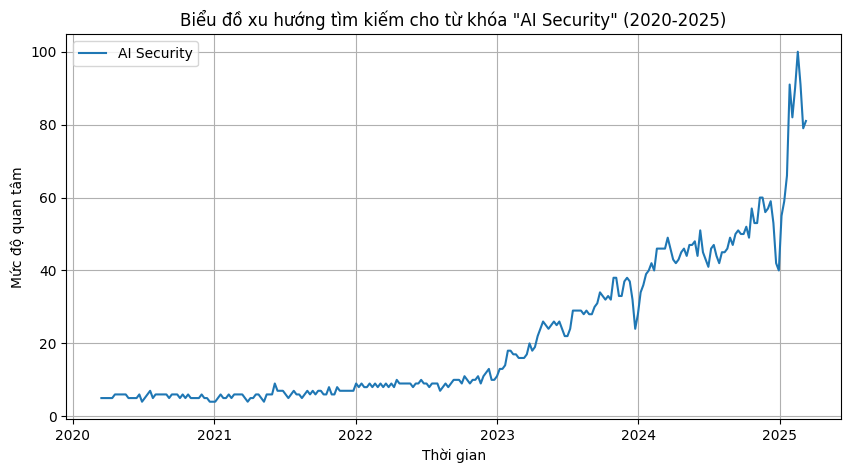

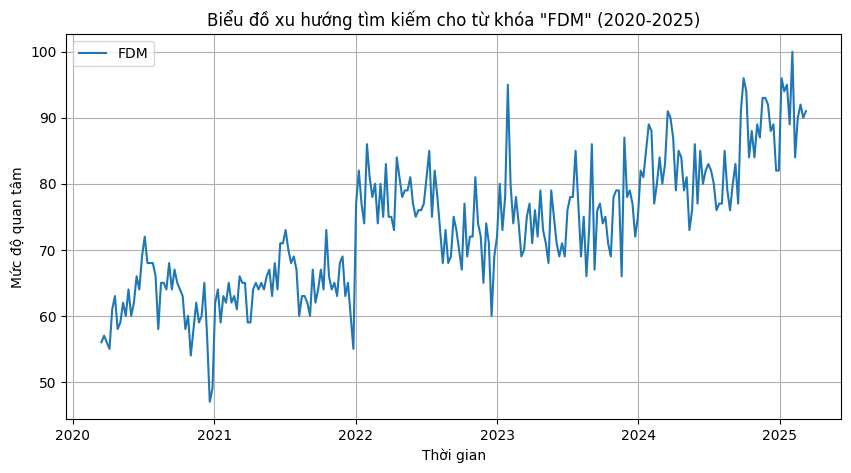

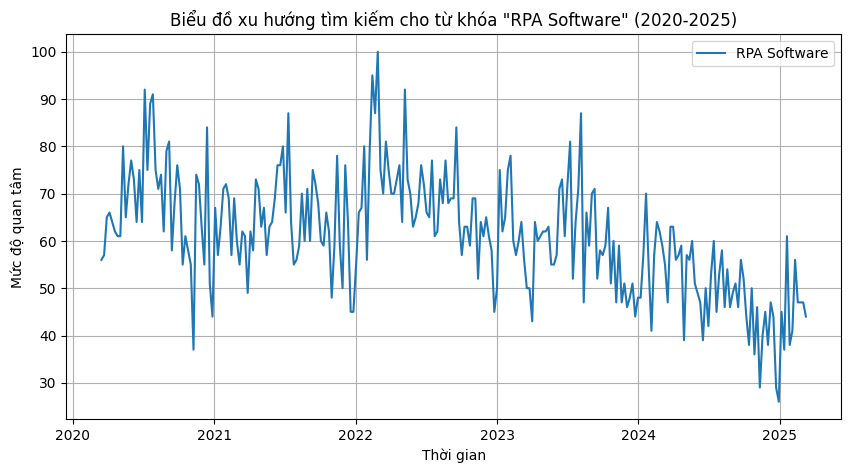

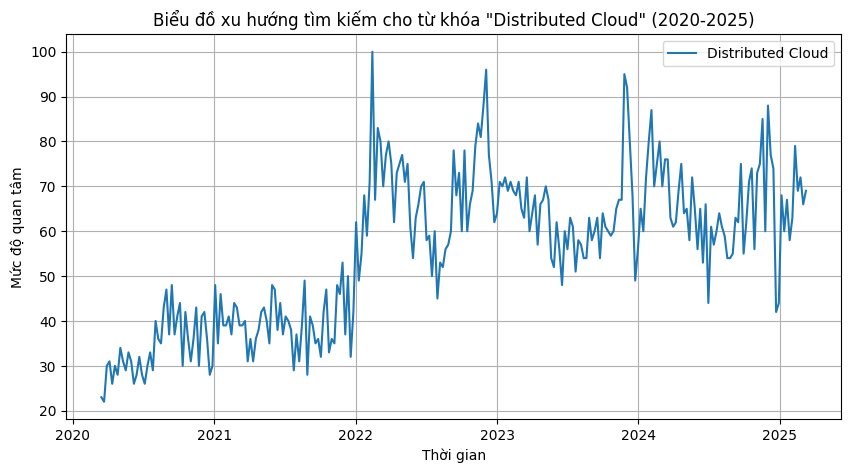

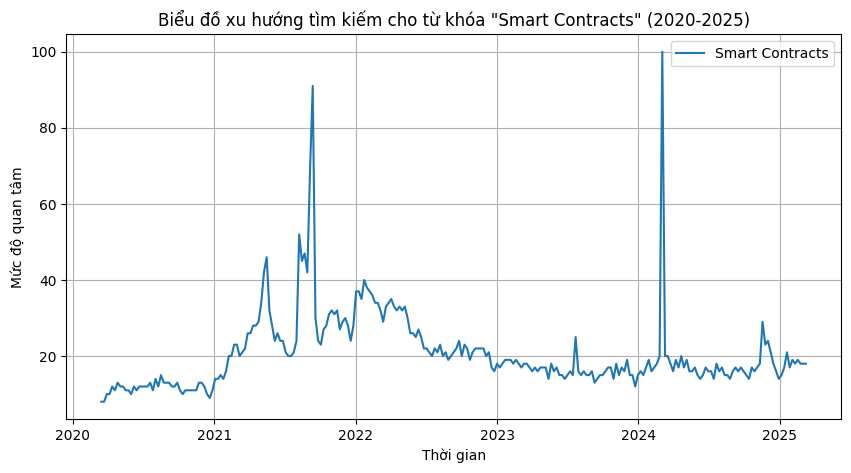

...

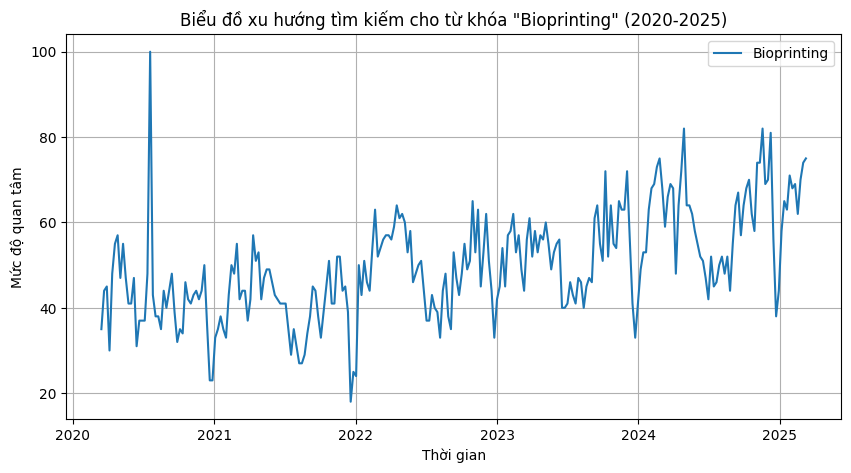

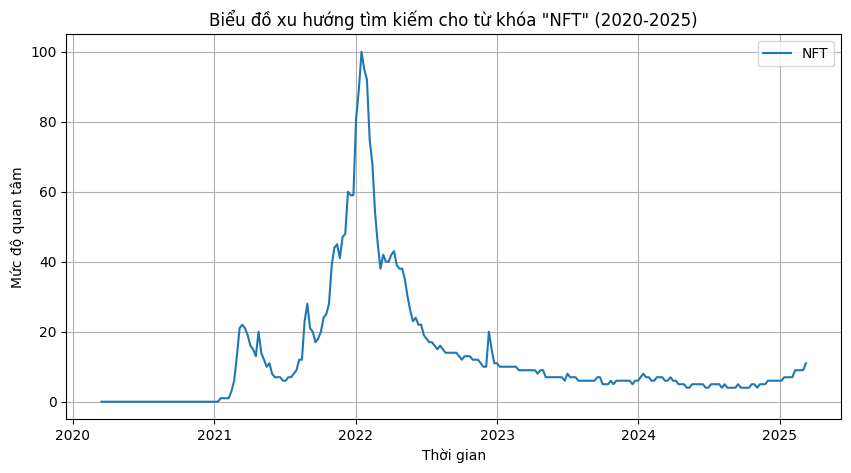

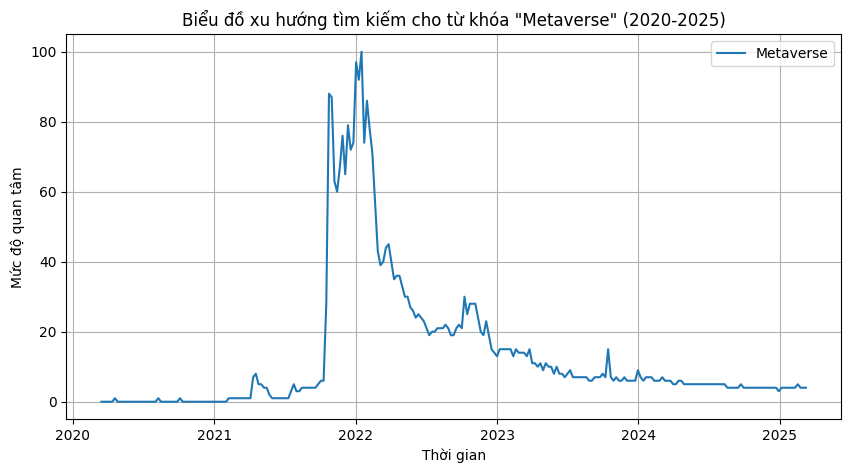

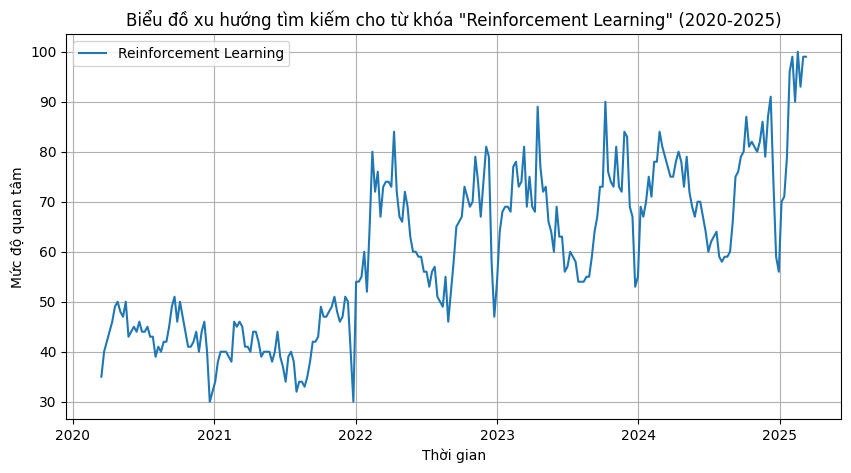

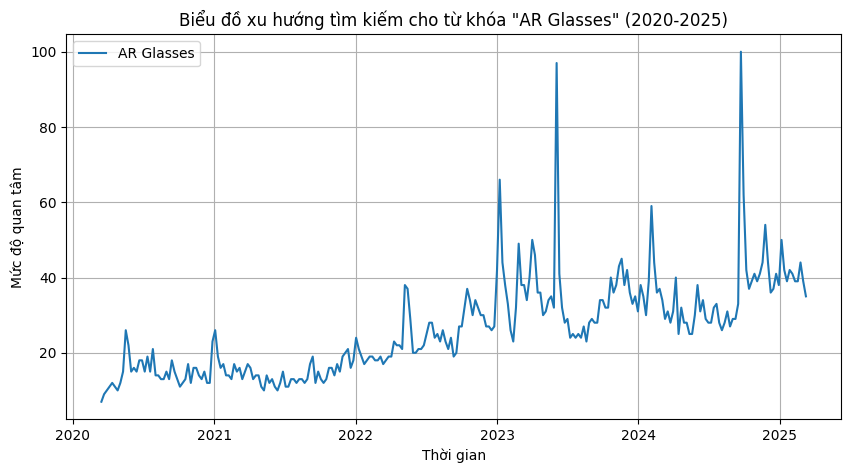

In [ ]:
#In biểu đồ dữ liệu xxu hướng của từng từ khóa từ năm 2020 đến 2025
for keyword in df_cleaned['keyword'].unique():
    keyword_data = df_cleaned[df_cleaned['keyword'] == keyword]
    plt.figure(figsize=(10, 5))  # Điều chỉnh kích thước biểu đồ nếu cần
    # Use keyword_data.index for the x-axis, which is now the 'date'
    plt.plot(keyword_data.index, keyword_data['interest_over_time'], label=keyword)
    plt.title(f'Biểu đồ xu hướng tìm kiếm cho từ khóa "{keyword}" (2020-2025)')
    plt.xlabel('Thời gian')
    plt.ylabel('Mức độ quan tâm')
    plt.legend()
    plt.grid(True)
    plt.show()

In [ ]:
import numpy as np
import pandas as pd

# Khai báo kích thước cửa sổ trượt
window_size = 10  # Số điểm dữ liệu trong một cửa sổ

# Get unique keywords from the 'keyword' column of df_cleaned
keywords = df_cleaned['keyword'].unique()

# Dictionary lưu trữ dữ liệu train-test của từng từ khóa
train_data = {}
test_data = {}

for keyword in keywords:
    # Get data for the current keyword from df_cleaned
    data = df_cleaned[df_cleaned['keyword'] == keyword]['interest_over_time'].values
    windows = []

    # Tạo cửa sổ trượt
    for i in range(len(data) - window_size):
        windows.append(data[i:i + window_size])  # Lấy 10 điểm liên tiếp làm cửa sổ

    windows = np.array(windows)

    # Chia train-test (80% train, 20% test)
    split_idx = int(len(windows) * 0.8)
    train_data[keyword] = windows[:split_idx]
    test_data[keyword] = windows[split_idx:]

    # In ra thông tin từng từ khóa
    print(f"\n🔹 {keyword}:")
    print(f"  🔸 Tổng số cửa sổ = {len(windows)}")
    print(f"  🔹 Train = {len(train_data[keyword])}, Test = {len(test_data[keyword])}")

    # In toàn bộ các cửa sổ
    for i in range(len(windows)):
        print(f"  Window {i+1}: {windows[i]}")

Kết quả truyền trực tuyến bị cắt bớt đến 5000 dòng cuối.
  Window 97: [25 27 29 26 28 28 30 28 29 29]
  Window 98: [27 29 26 28 28 30 28 29 29 32]
  Window 99: [29 26 28 28 30 28 29 29 32 29]
  Window 100: [26 28 28 30 28 29 29 32 29 27]
  Window 101: [28 28 30 28 29 29 32 29 27 28]
  Window 102: [28 30 28 29 29 32 29 27 28 32]
  Window 103: [30 28 29 29 32 29 27 28 32 28]
  Window 104: [28 29 29 32 29 27 28 32 28 29]
  Window 105: [29 29 32 29 27 28 32 28 29 31]
  Window 106: [29 32 29 27 28 32 28 29 31 28]
  Window 107: [32 29 27 28 32 28 29 31 28 29]
  Window 108: [29 27 28 32 28 29 31 28 29 27]
  Window 109: [27 28 32 28 29 31 28 29 27 30]
  Window 110: [28 32 28 29 31 28 29 27 30 29]
  Window 111: [32 28 29 31 28 29 27 30 29 25]
  Window 112: [28 29 31 28 29 27 30 29 25 27]
  Window 113: [29 31 28 29 27 30 29 25 27 24]
  Window 114: [31 28 29 27 30 29 25 27 24 23]
  Window 115: [28 29 27 30 29 25 27 24 23 23]
  Window 116: [29 27 30 29 25 27 24 23 23 24]
  Window 117: [27 30 29 25

In [ ]:
# Kiểm tra tính dừng bằng ADF Test
def adf_test(series):
    result = adfuller(series)
    print("ADF Statistic:", result[0])
    print("p-value:", result[1])
    if result[1] < 0.05:
        print("Chuỗi dữ liệu dừng")
    else:
        print("Chuỗi dữ liệu không dừng")

# Assuming 'data' is your Series, apply the test to the entire Series
adf_test(data)  # Pass the entire 'data' Series instead of a single element

ADF Statistic: -1.5815923450880773
p-value: 0.49283334317135336
Chuỗi dữ liệu không dừng


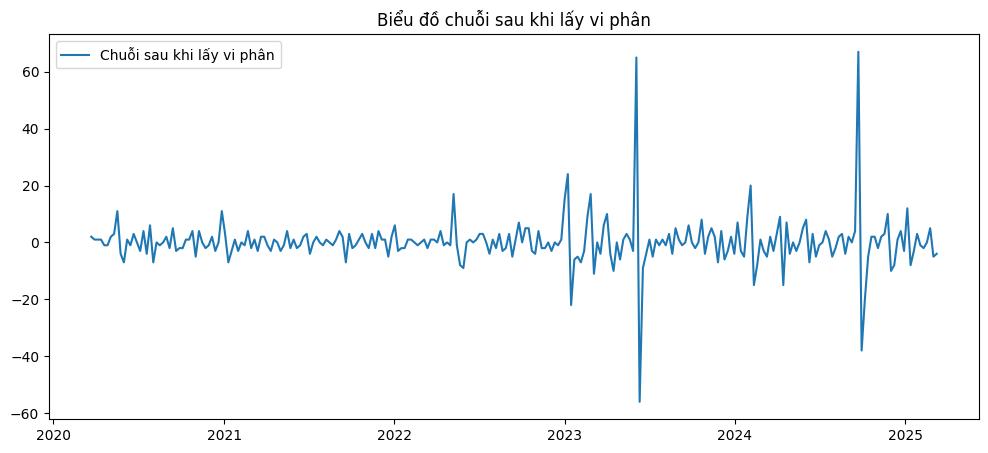

ADF Statistic: -10.006749522308182
p-value: 1.822958011451922e-17
Chuỗi dữ liệu dừng


In [ ]:
# Nếu chuỗi không dừng, lấy vi phân
if adfuller(data.values)[1] > 0.05: # Access the values of the Series directly
    data_diff = data.diff().dropna()
    plt.figure(figsize=(12, 5))
    plt.plot(data_diff, label="Chuỗi sau khi lấy vi phân")
    plt.title("Biểu đồ chuỗi sau khi lấy vi phân")
    plt.legend()
    plt.show()
    adf_test(data_diff.values) # Access the values of the Series directly
else:
    data_diff = data.copy()


 Đang vẽ ACF & PACF cho: AI Security


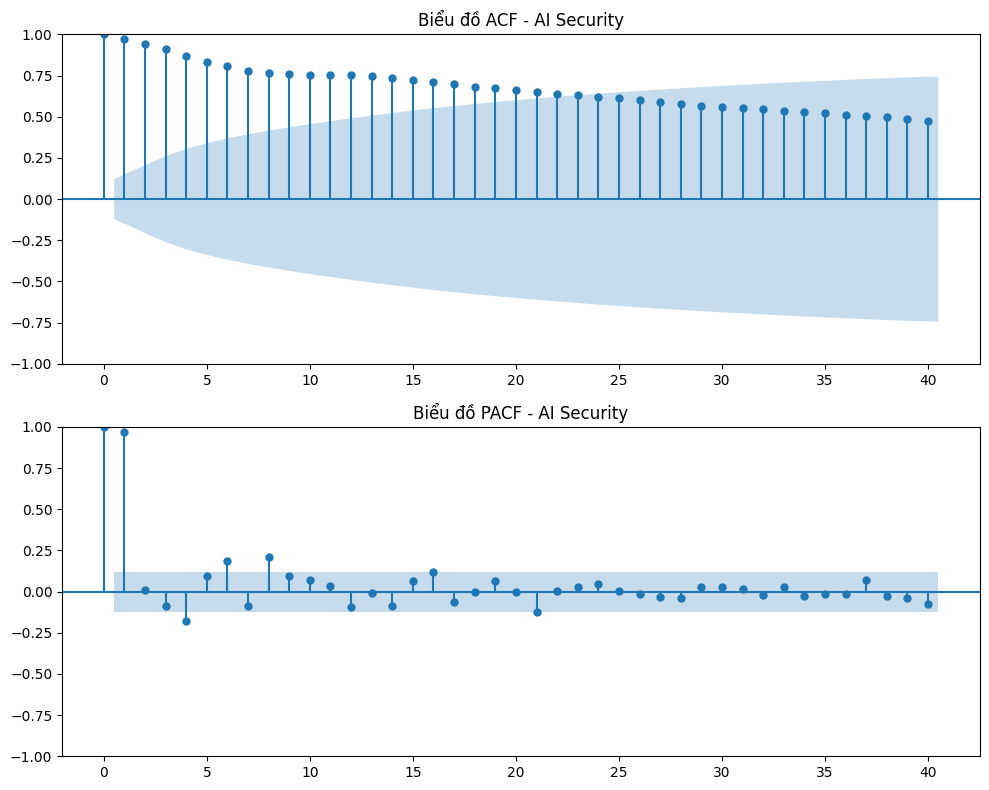


 Đang vẽ ACF & PACF cho: FDM


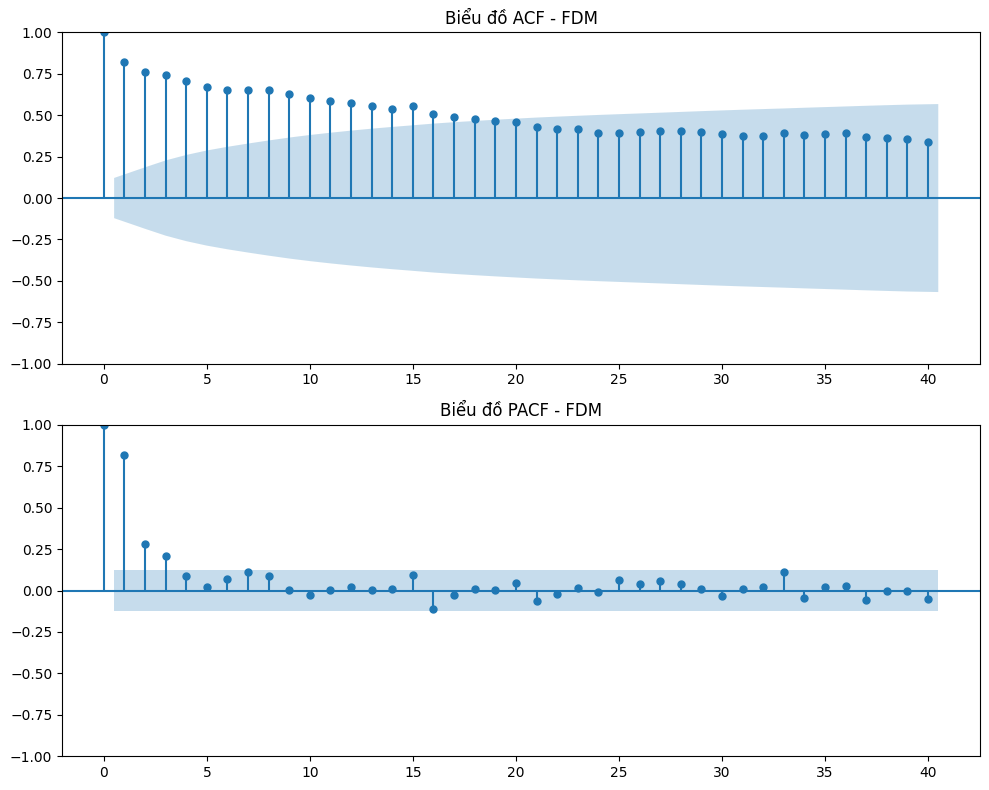


 Đang vẽ ACF & PACF cho: RPA Software


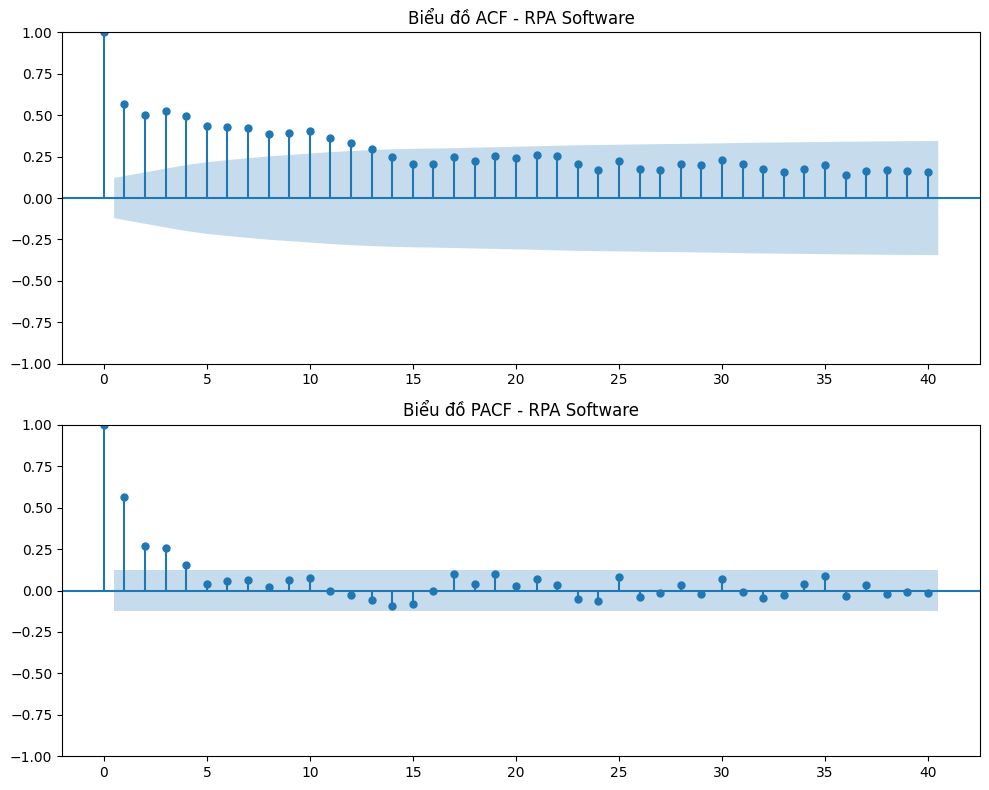


 Đang vẽ ACF & PACF cho: Distributed Cloud


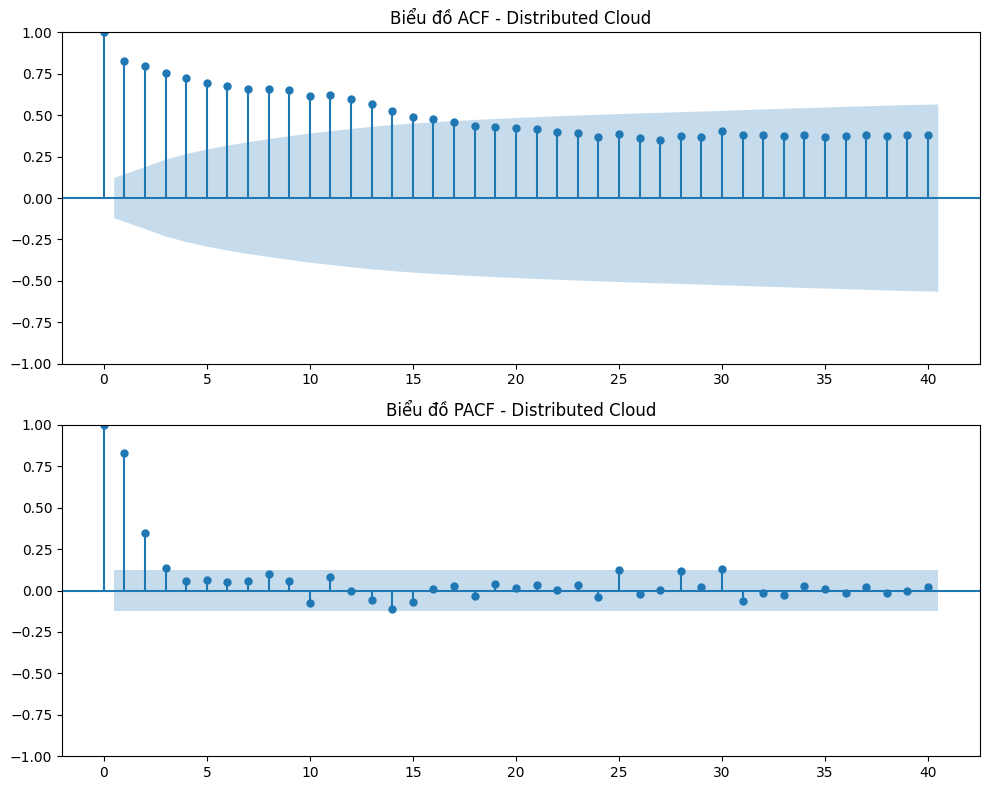


 Đang vẽ ACF & PACF cho: Smart Contracts


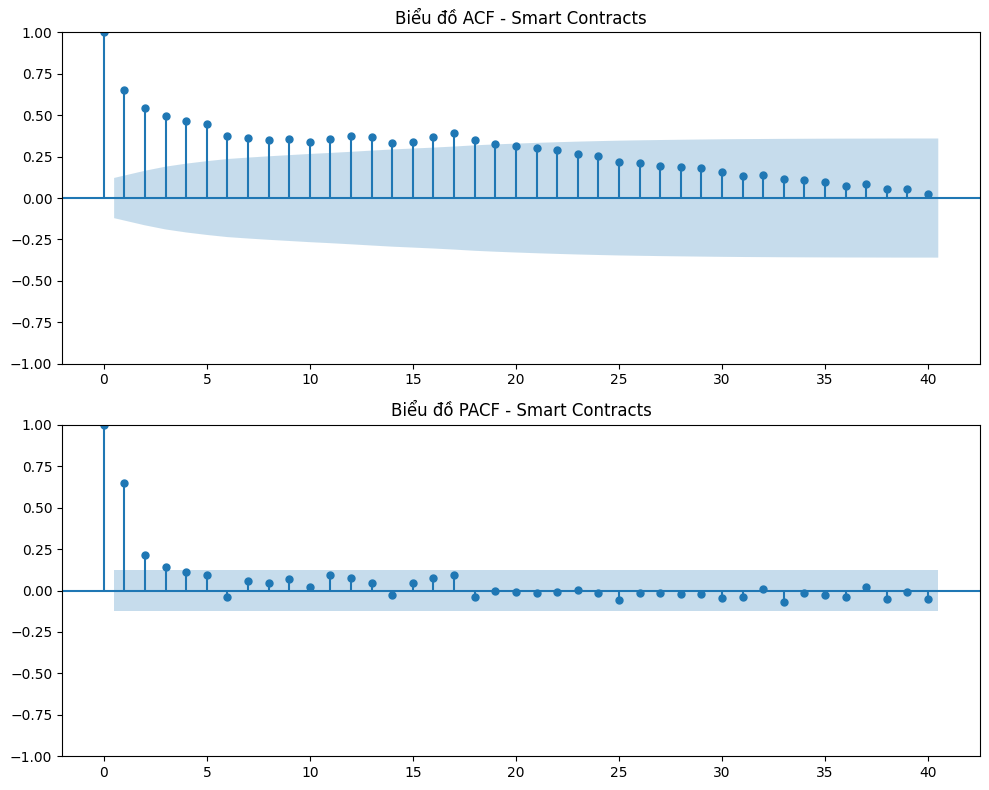


 Đang vẽ ACF & PACF cho: Smart Sensors


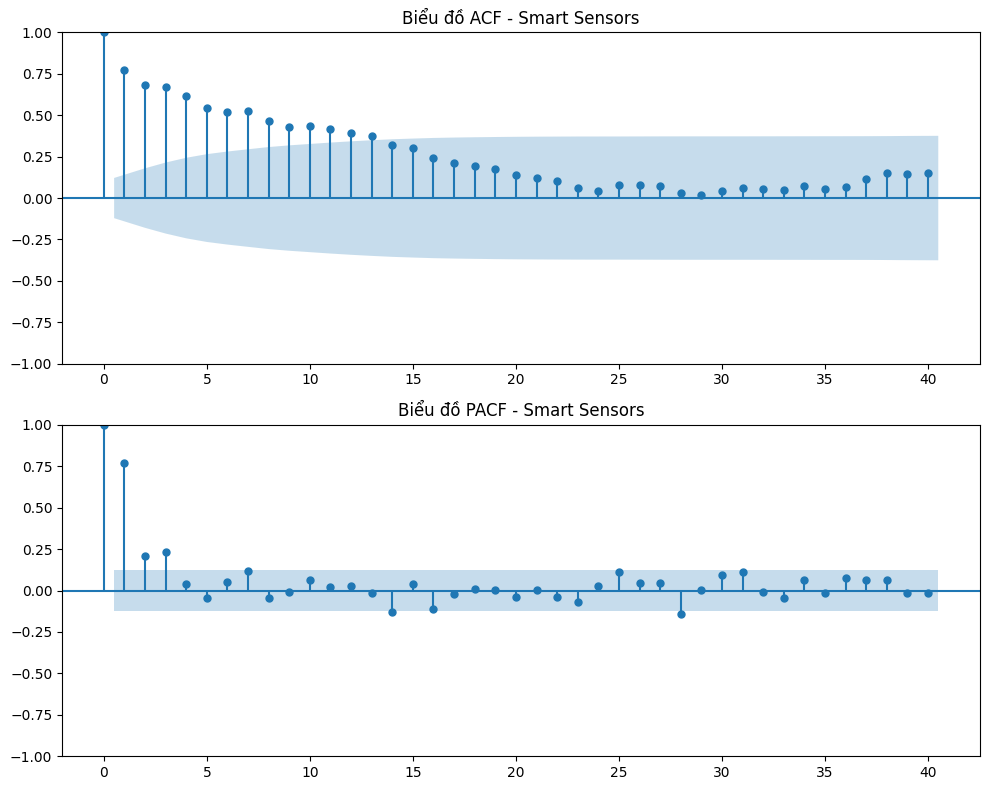


 Đang vẽ ACF & PACF cho: Cloud computing for IoT


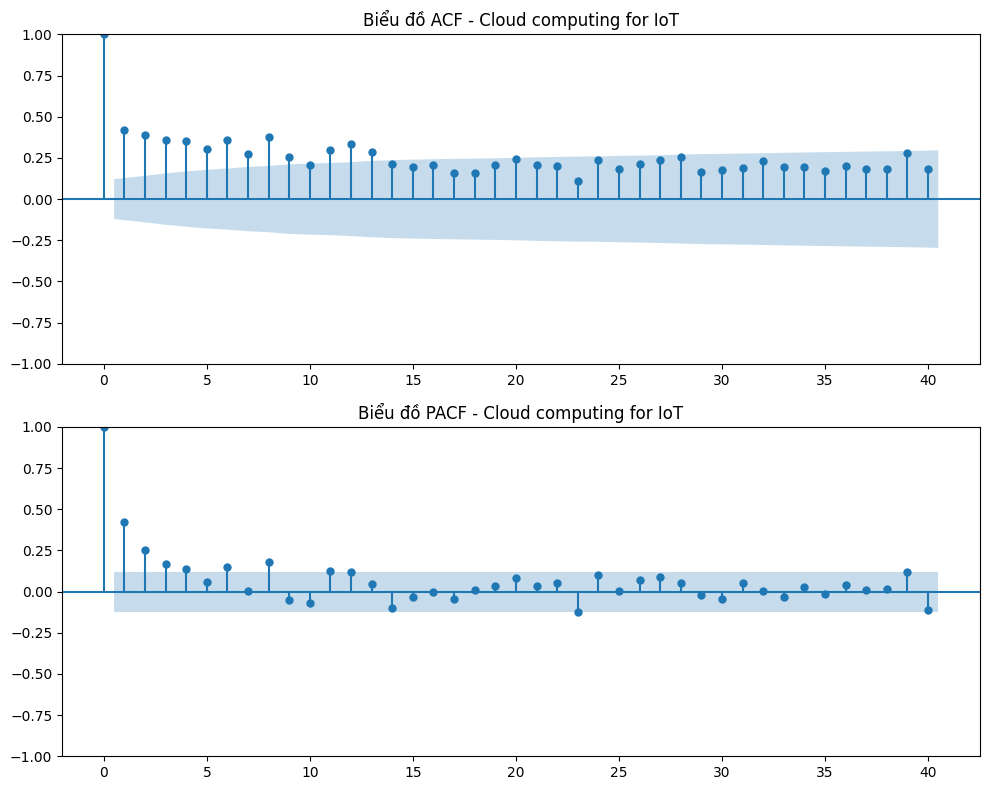


 Đang vẽ ACF & PACF cho: Quantum computing


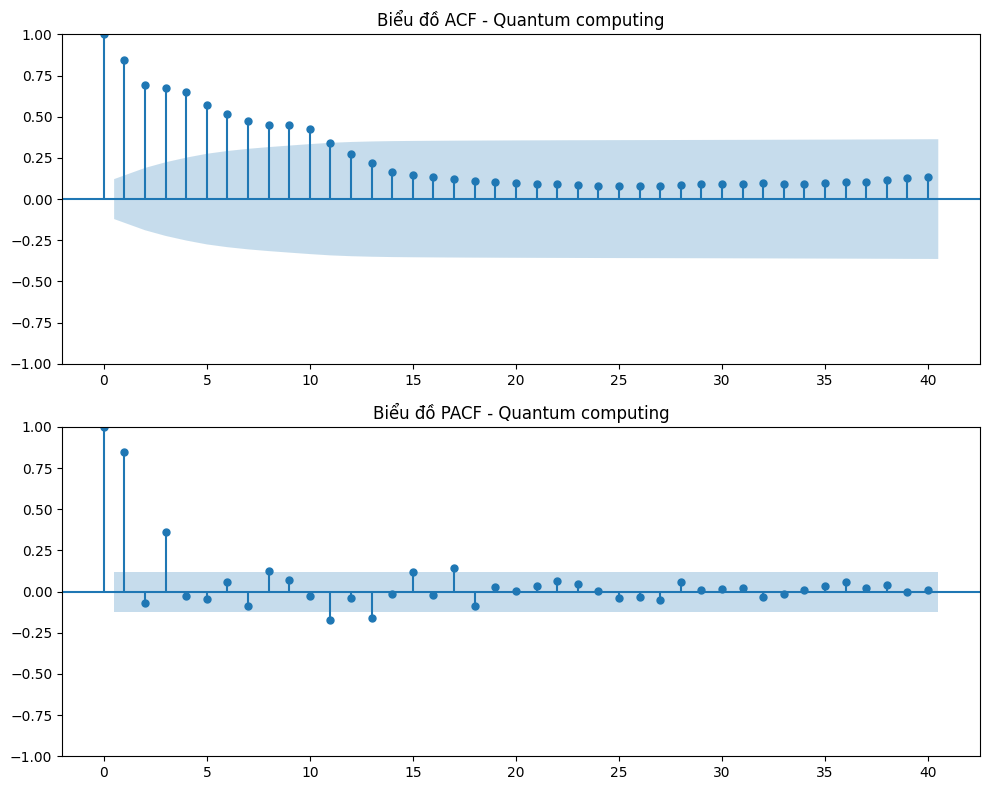


 Đang vẽ ACF & PACF cho: Green Hydrogen


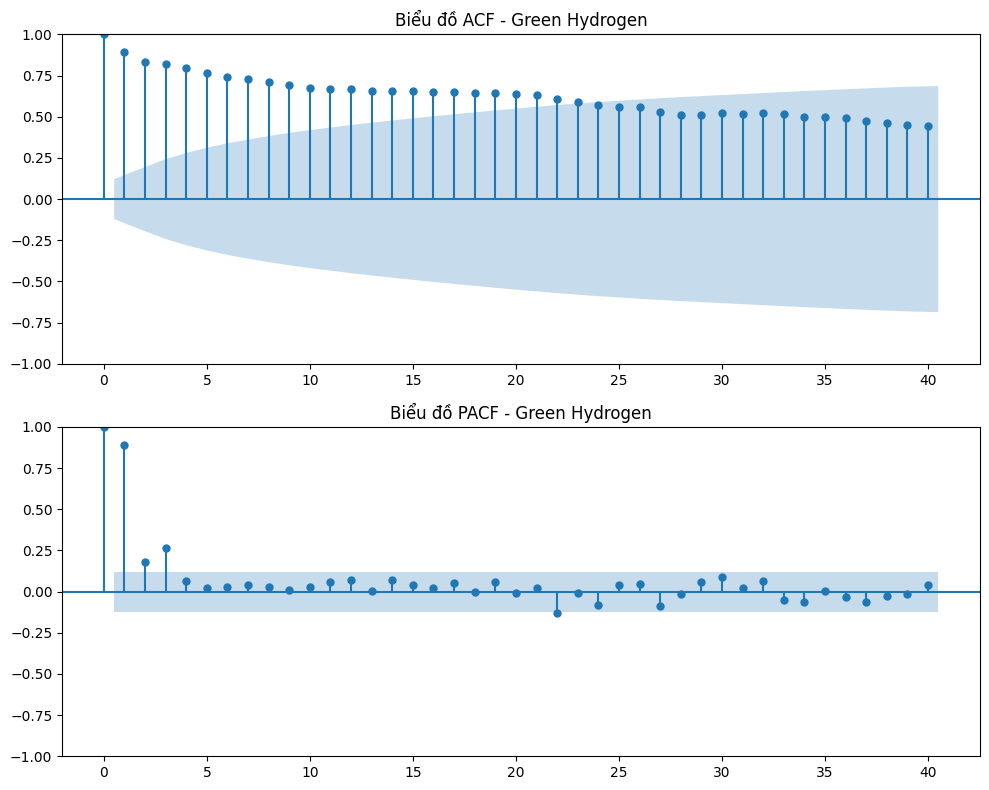


 Đang vẽ ACF & PACF cho: Public Cloud


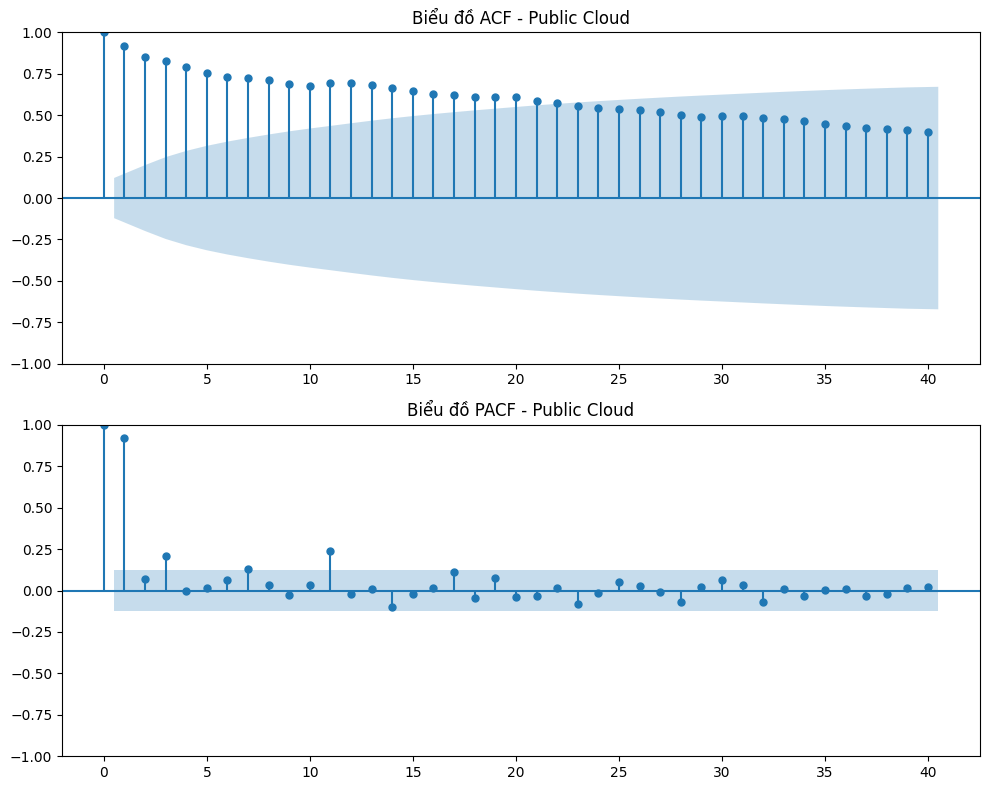


 Đang vẽ ACF & PACF cho: Industrial Robots


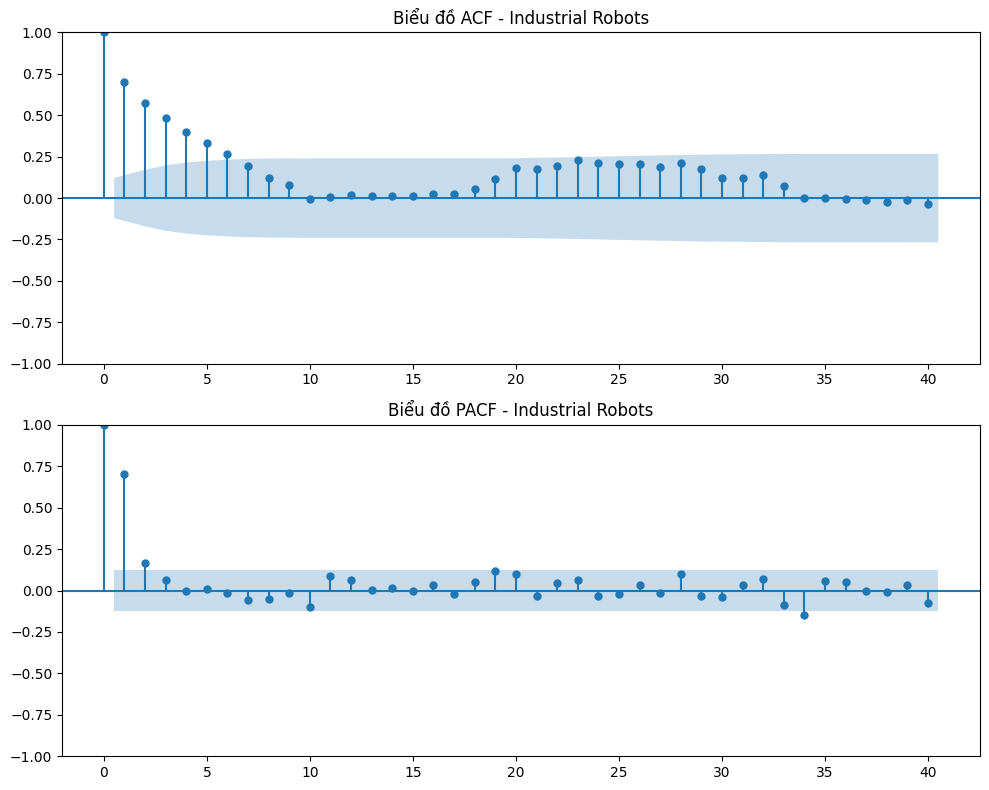


 Đang vẽ ACF & PACF cho: Smart grid and IoT


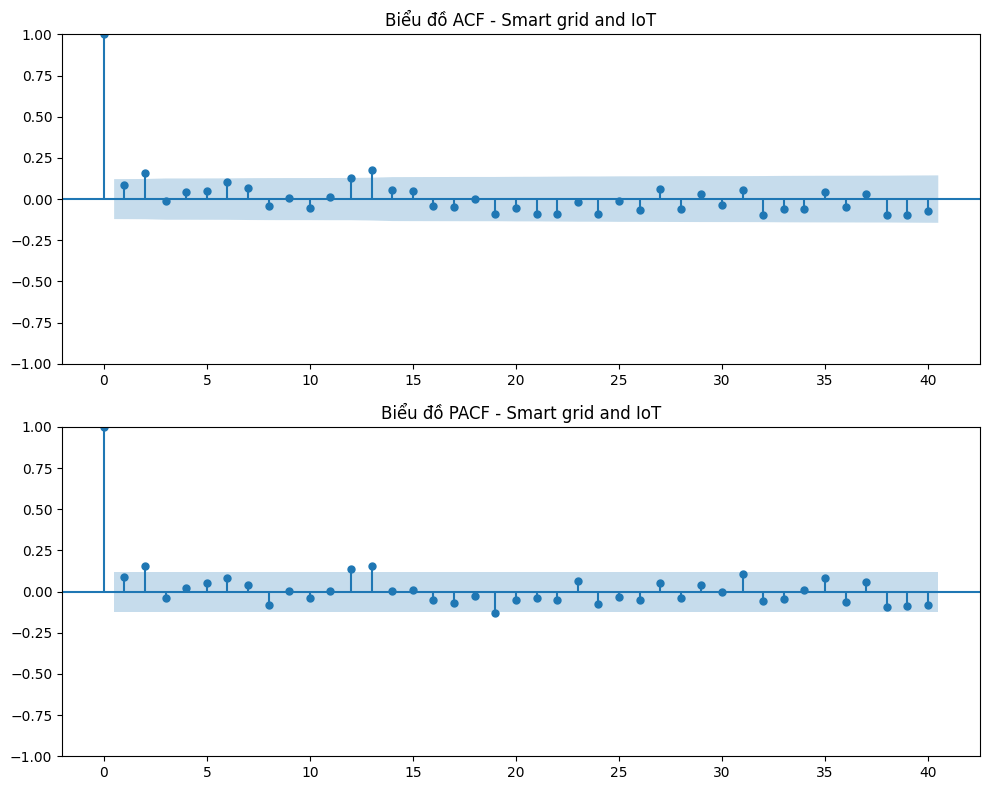


 Đang vẽ ACF & PACF cho: VR Headsets


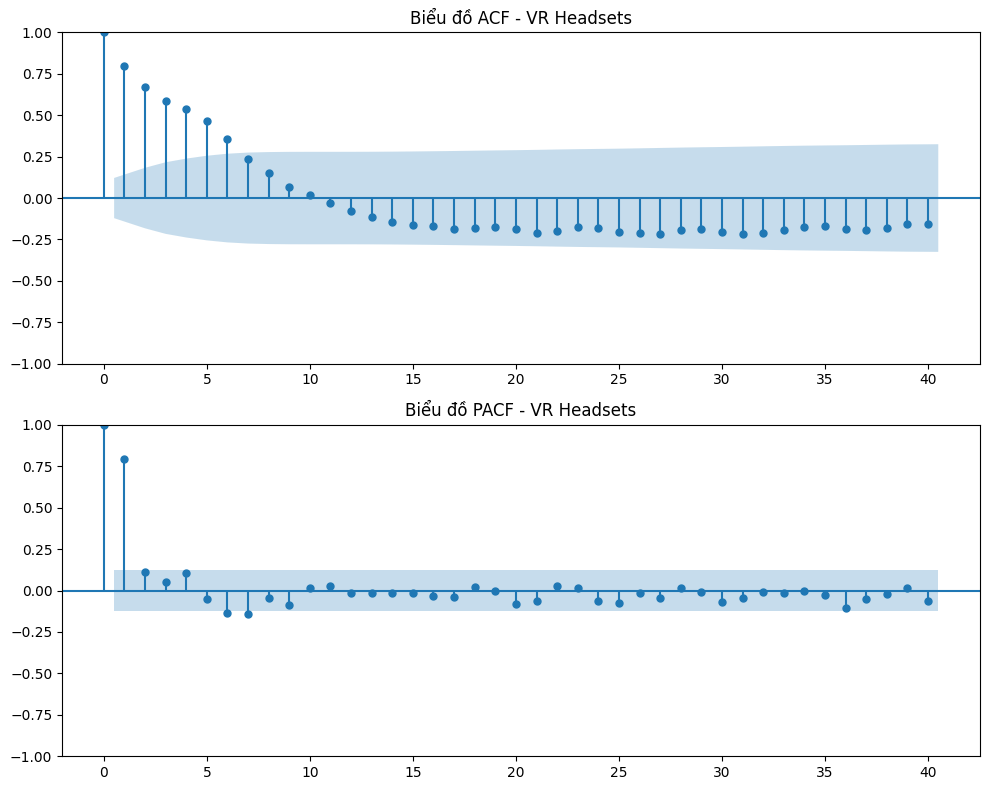


 Đang vẽ ACF & PACF cho: Quantum Cryptography


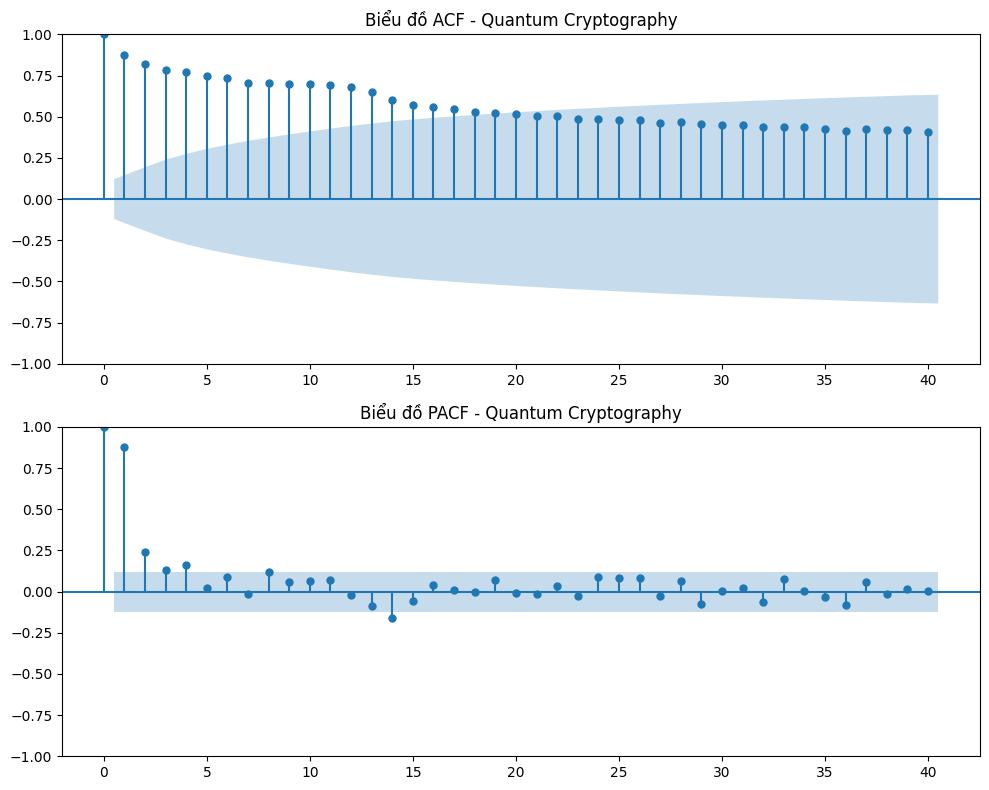


 Đang vẽ ACF & PACF cho: Augmented reality


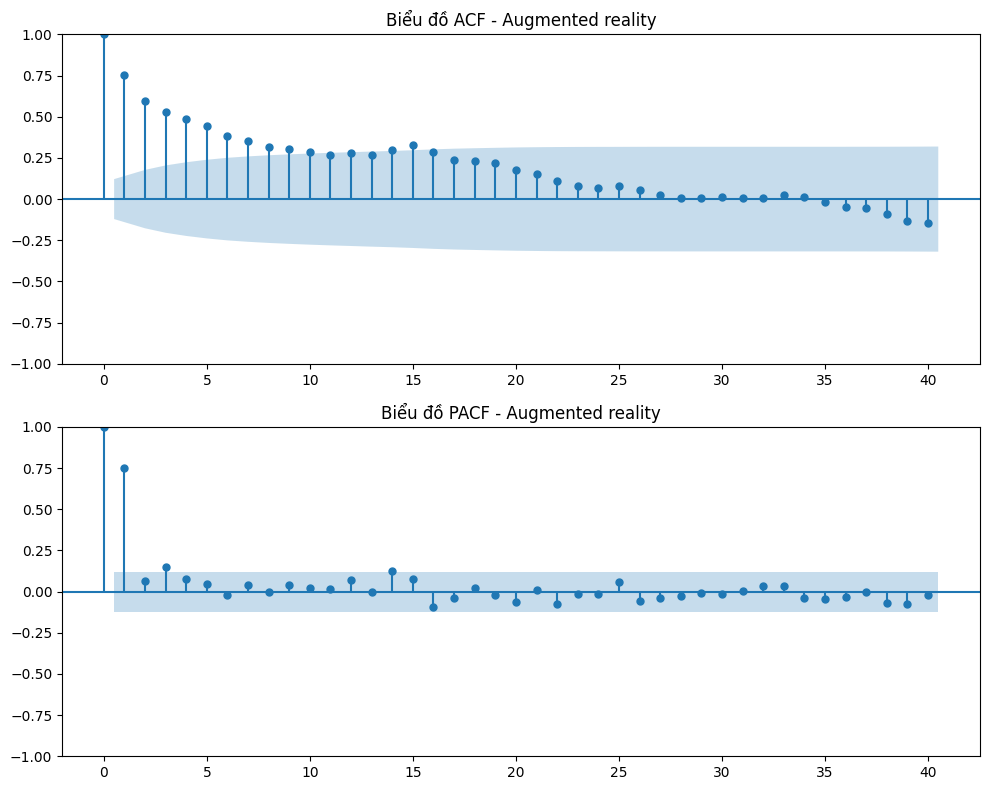


 Đang vẽ ACF & PACF cho: Small Satellites


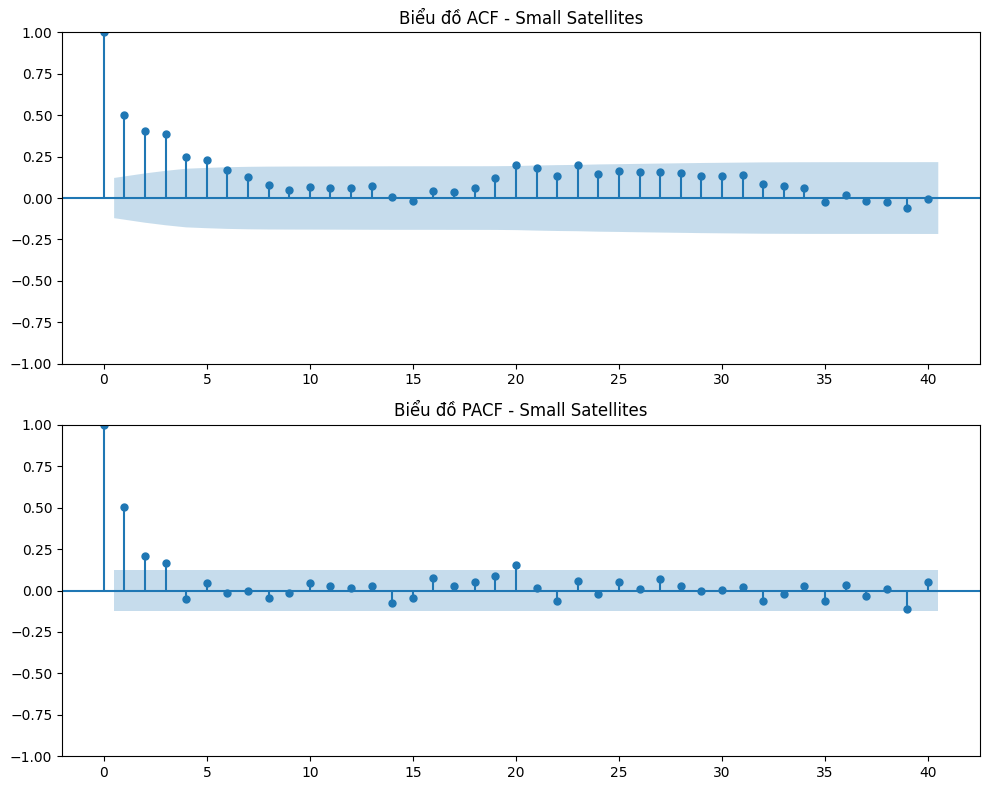


 Đang vẽ ACF & PACF cho: Computer vision


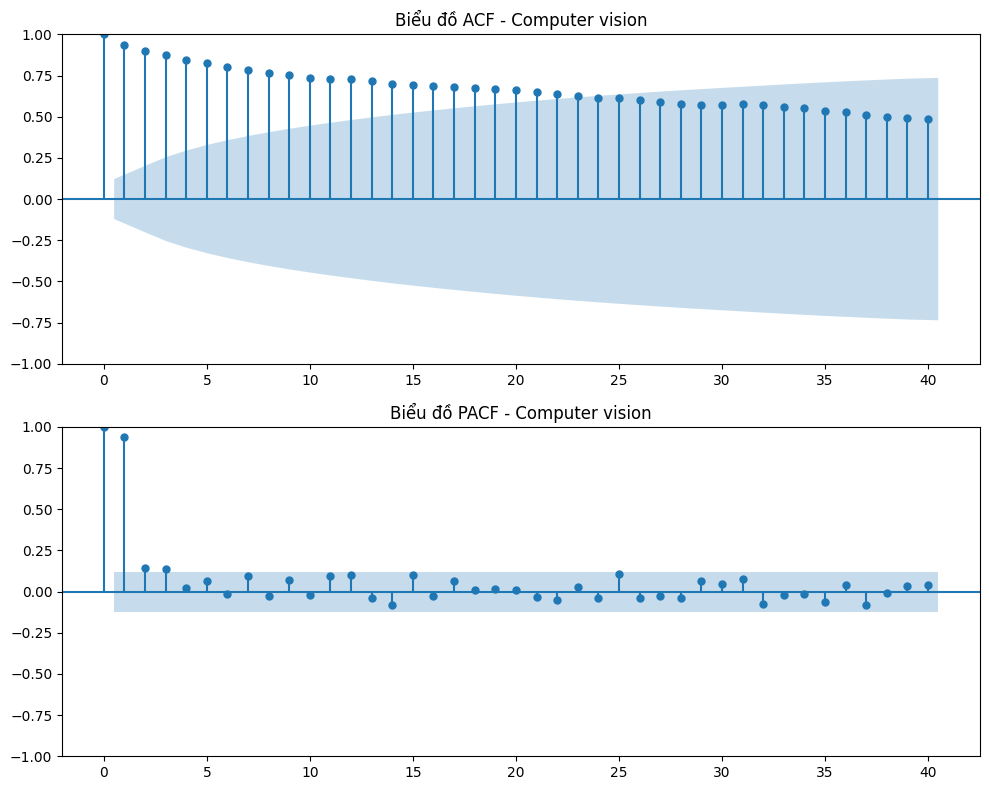


 Đang vẽ ACF & PACF cho: Cashless Payment


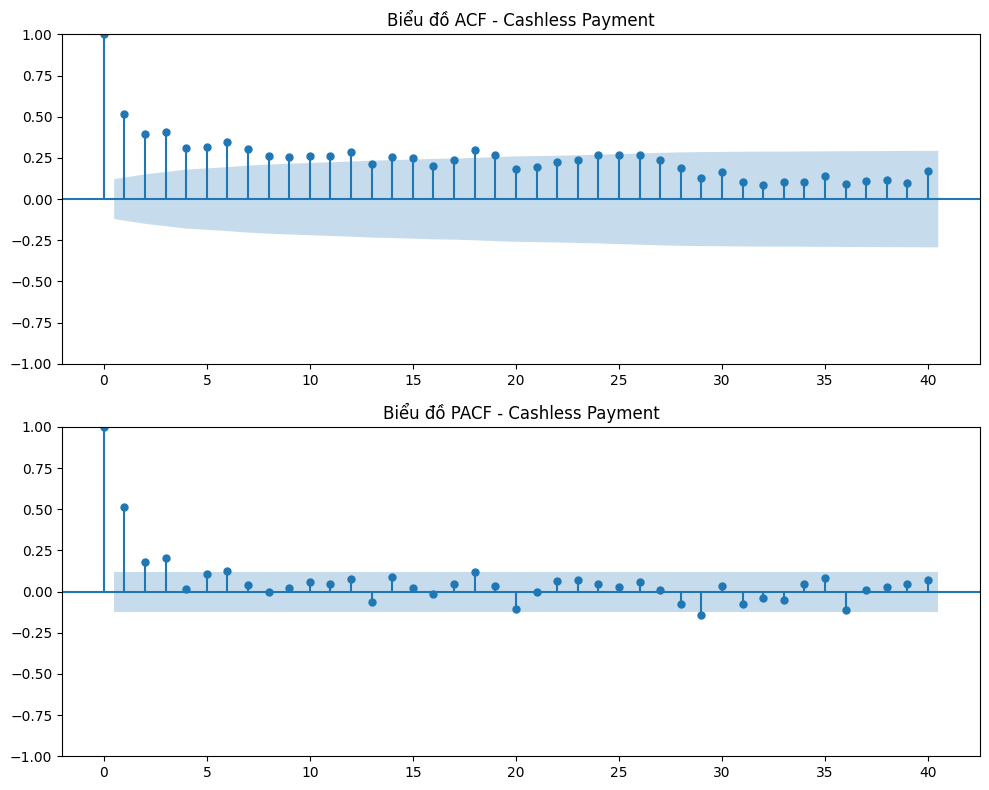


 Đang vẽ ACF & PACF cho: Edge AI


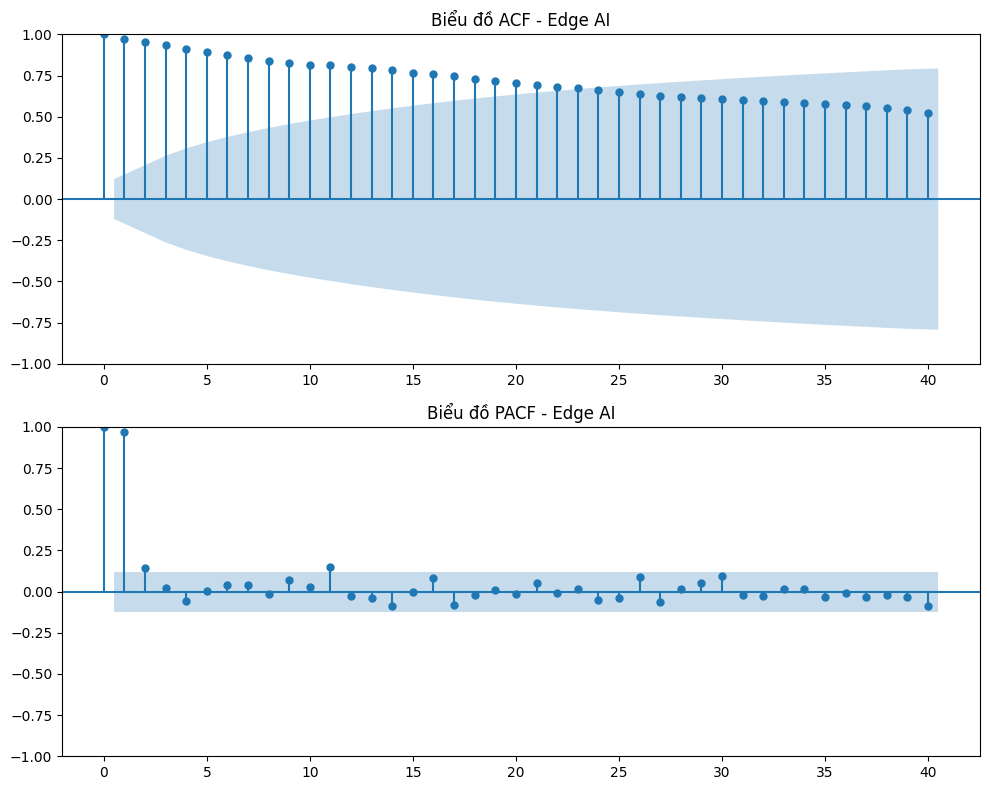


 Đang vẽ ACF & PACF cho: Adaptive learning


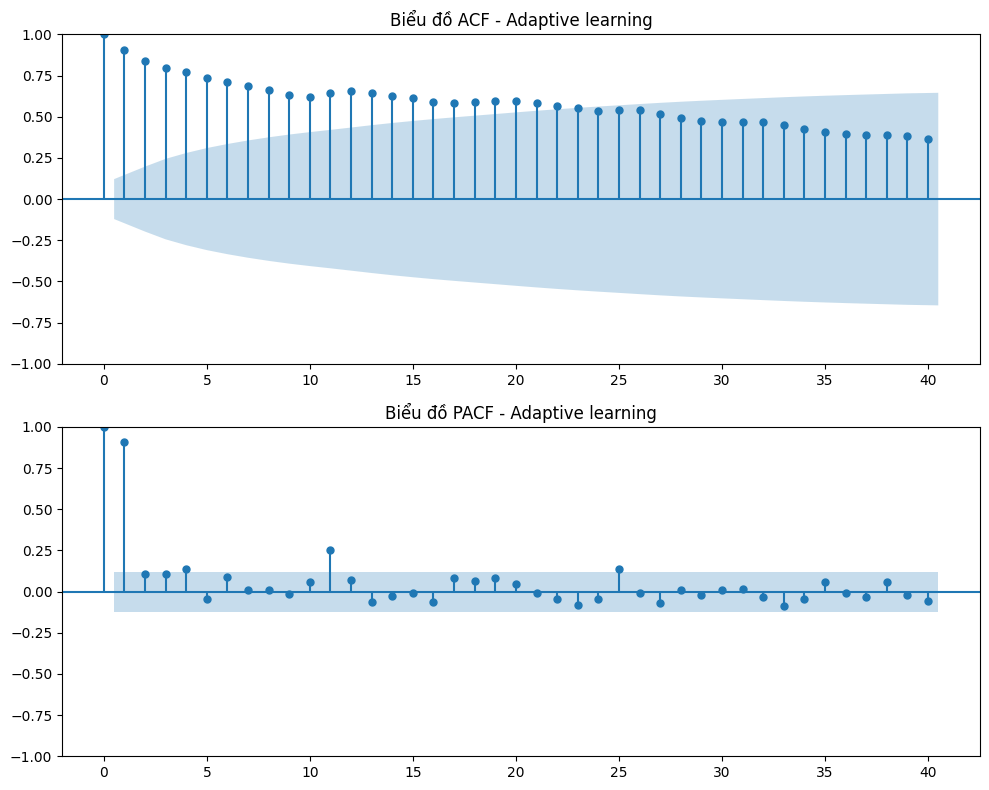


 Đang vẽ ACF & PACF cho: Virtual reality technology


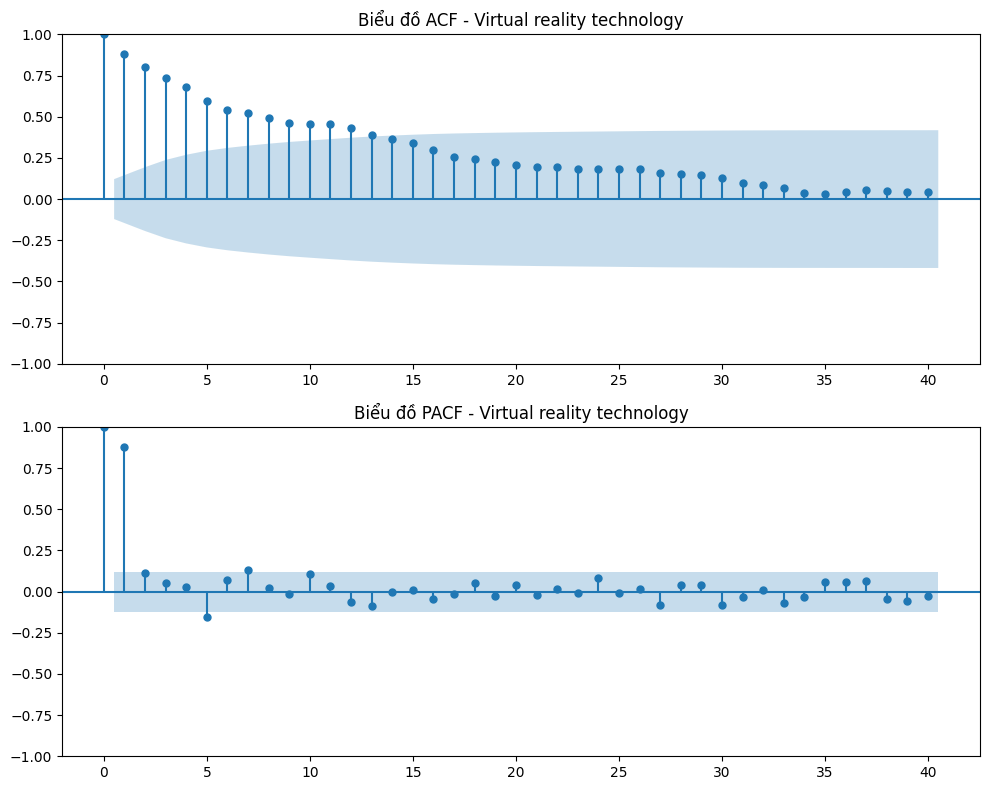


 Đang vẽ ACF & PACF cho: Super Apps


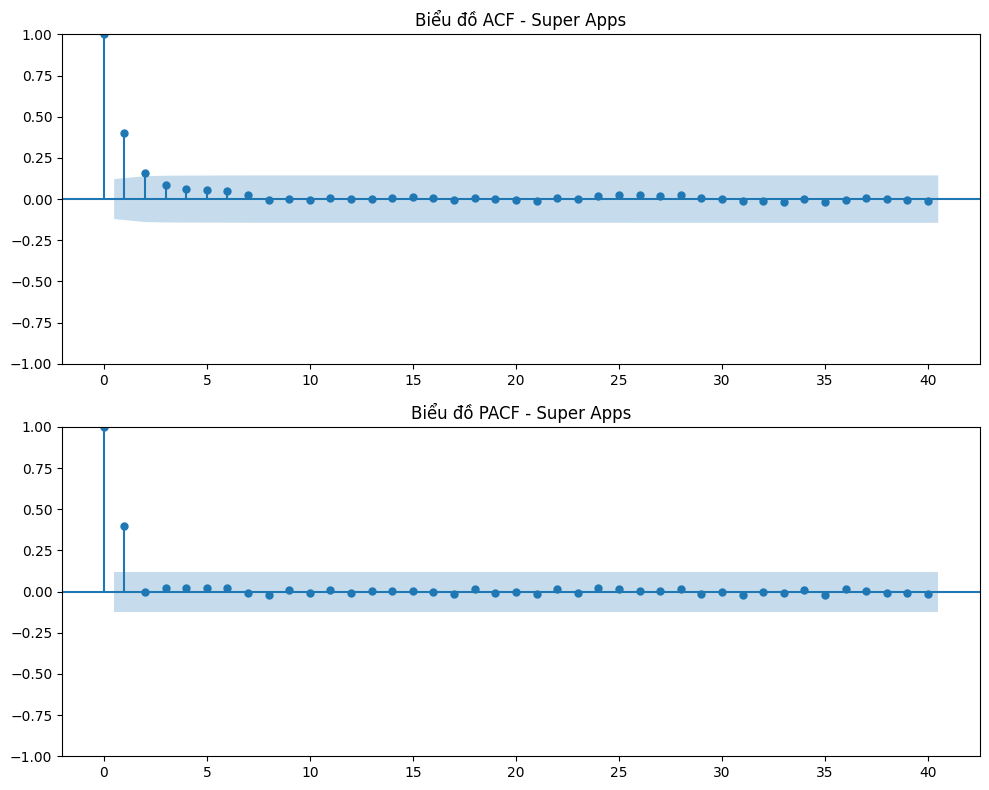


 Đang vẽ ACF & PACF cho: Qubits


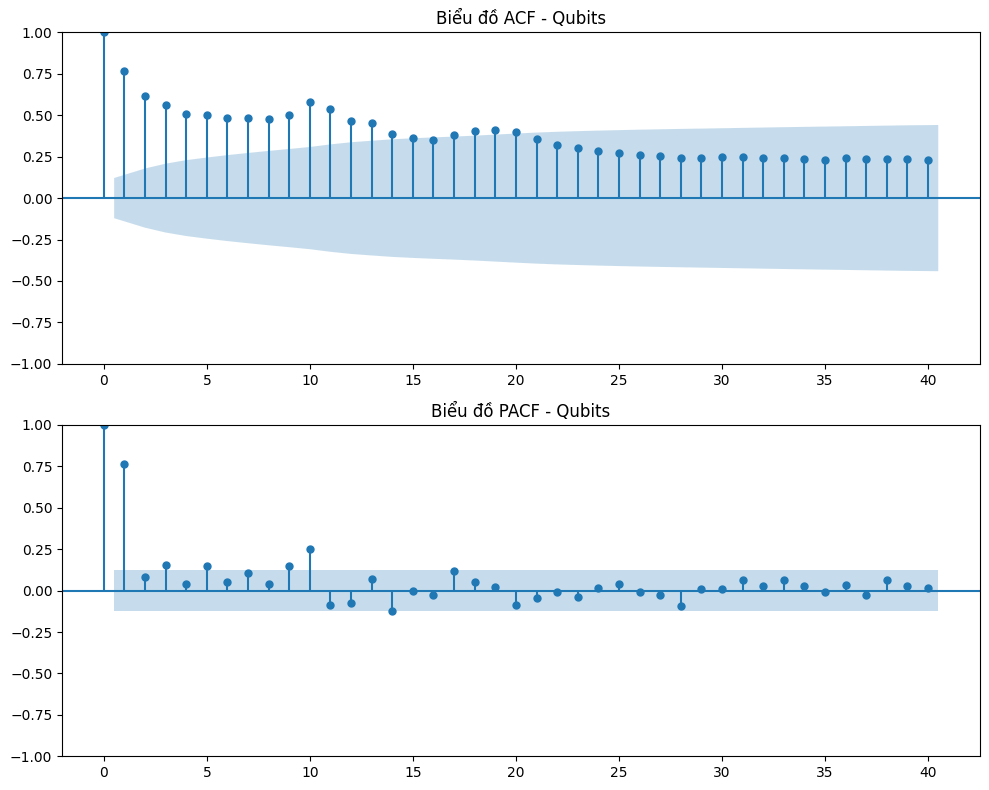


 Đang vẽ ACF & PACF cho: Generative AI


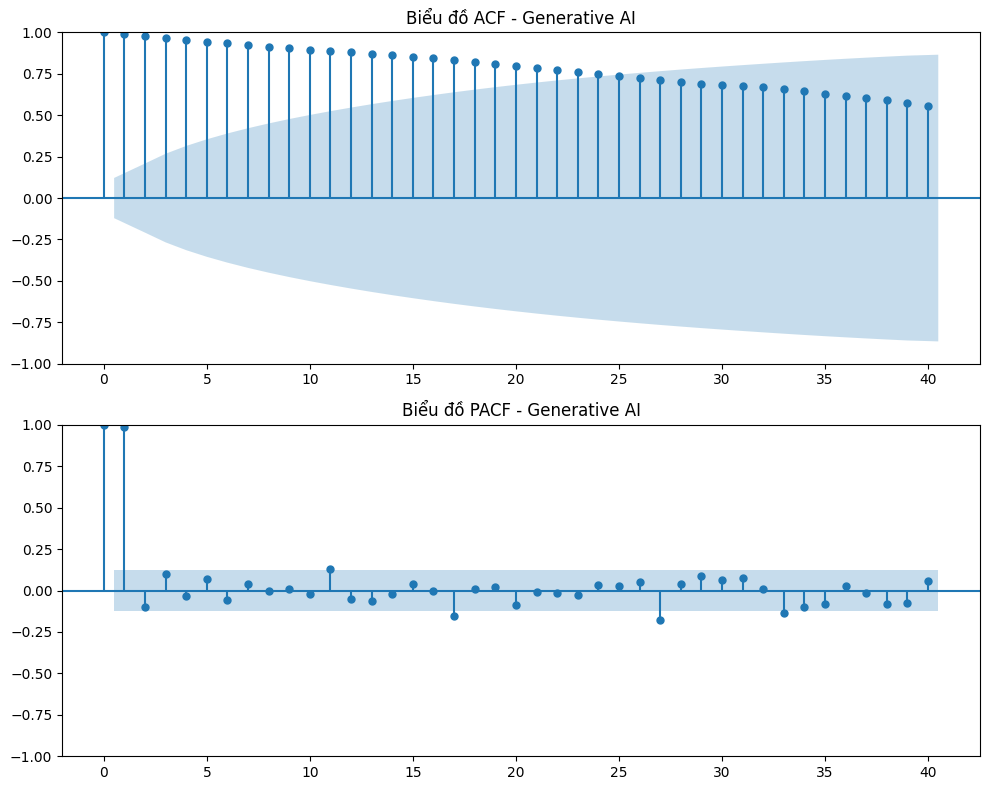


 Đang vẽ ACF & PACF cho: CRISPR


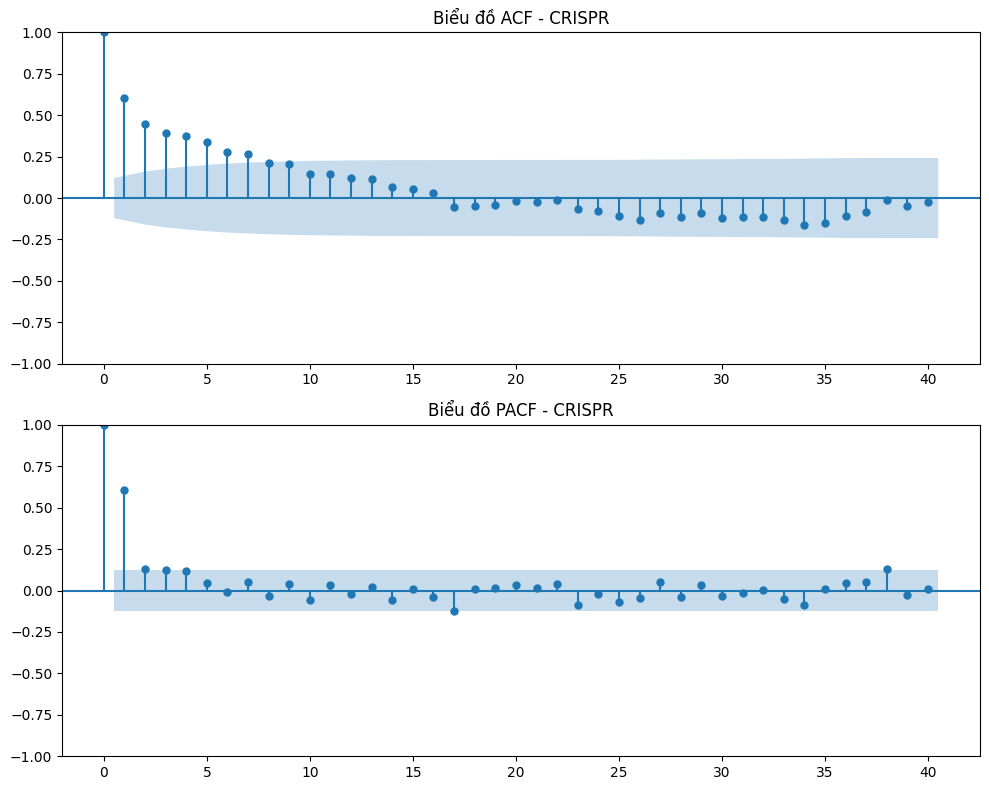


 Đang vẽ ACF & PACF cho: Telemedicine


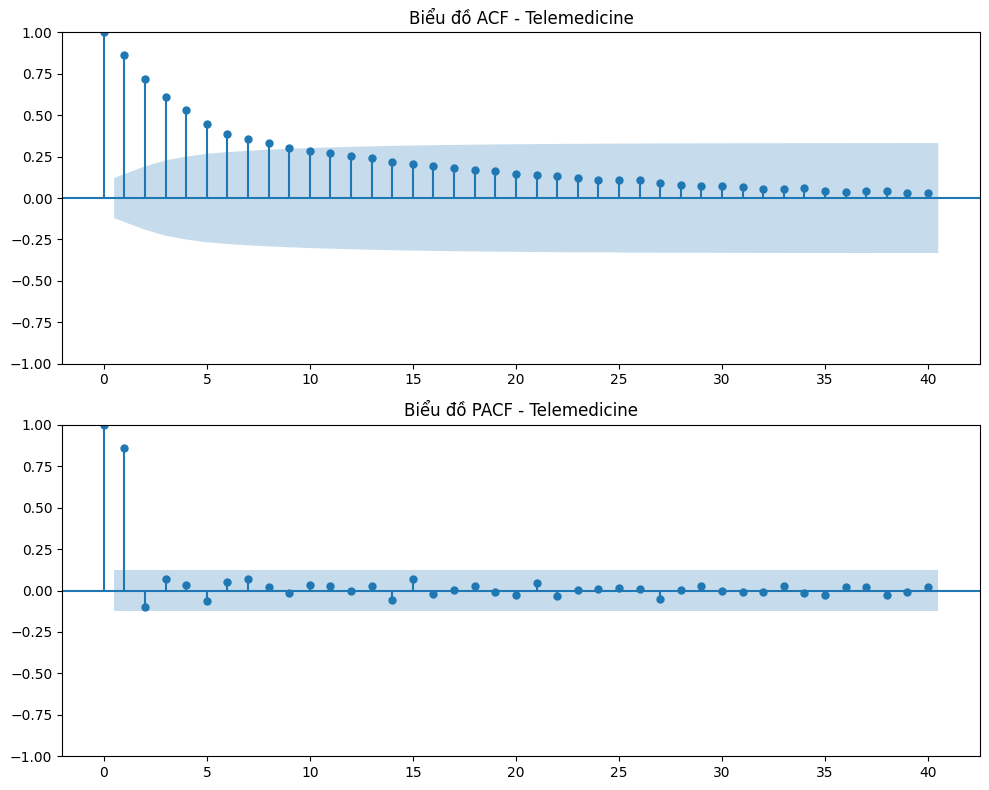


 Đang vẽ ACF & PACF cho: Lab-grown Meat


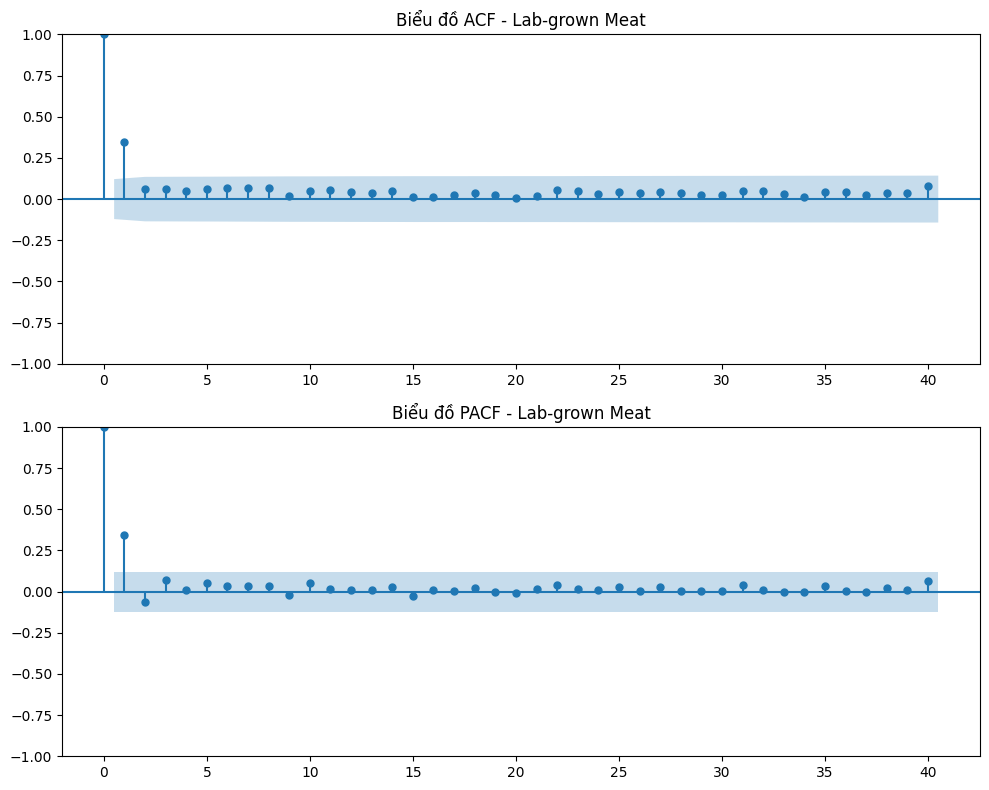


 Đang vẽ ACF & PACF cho: Chatbots


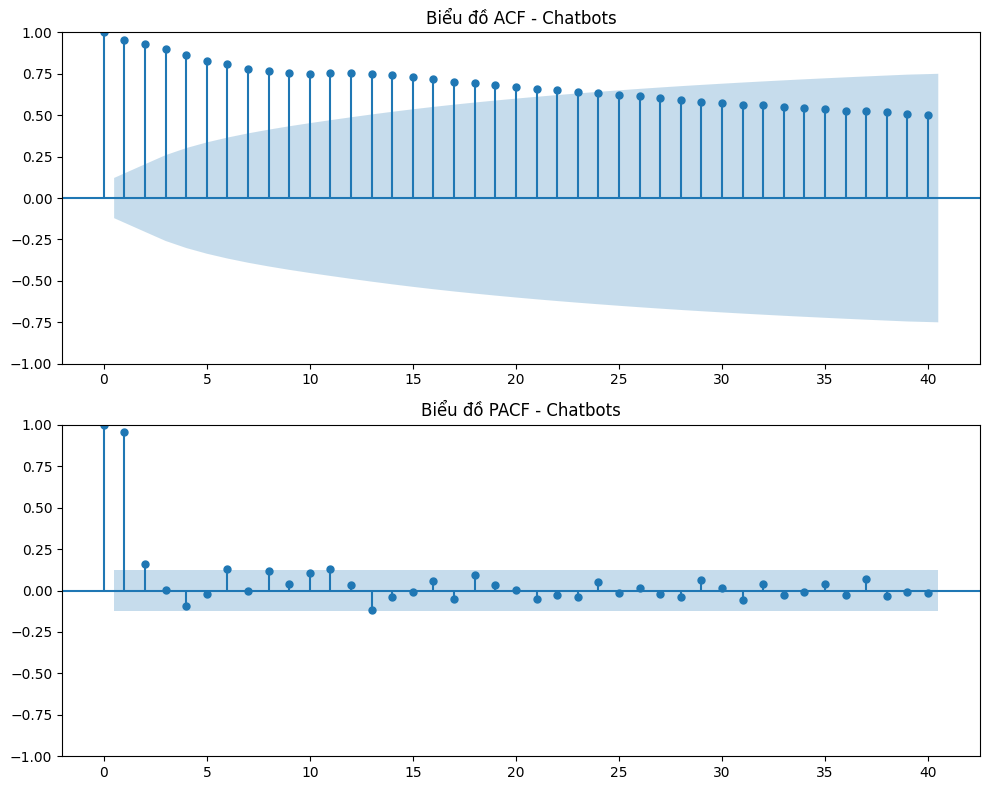


 Đang vẽ ACF & PACF cho: Green cloud computing


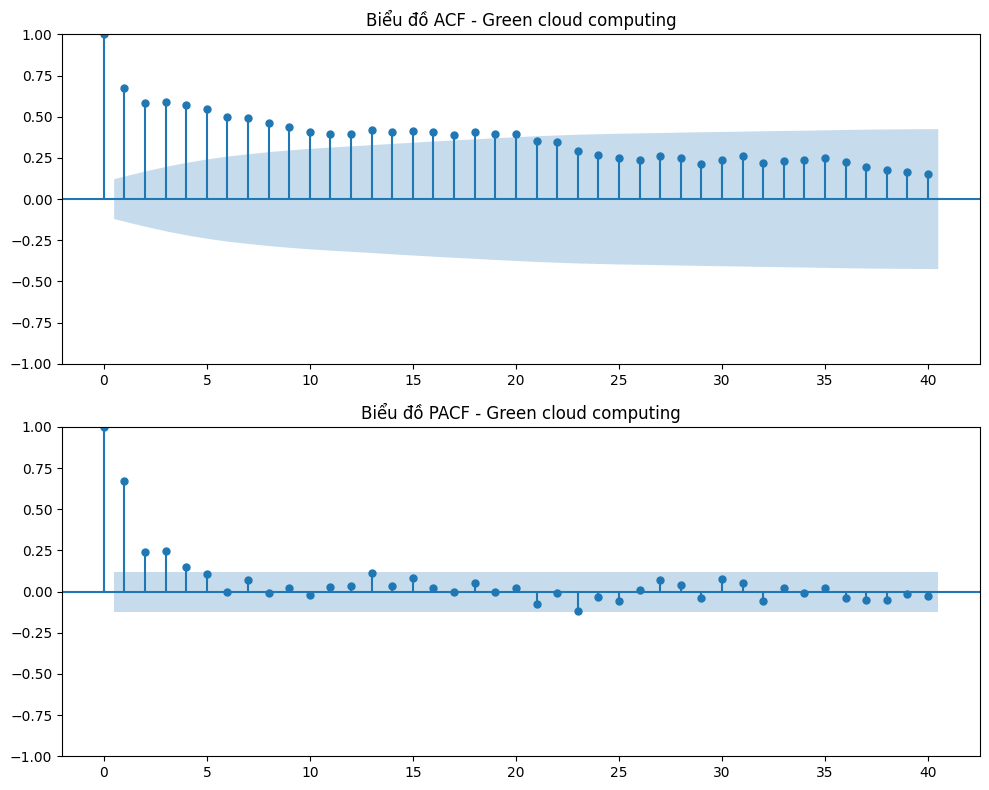


 Đang vẽ ACF & PACF cho: Reusable Rockets


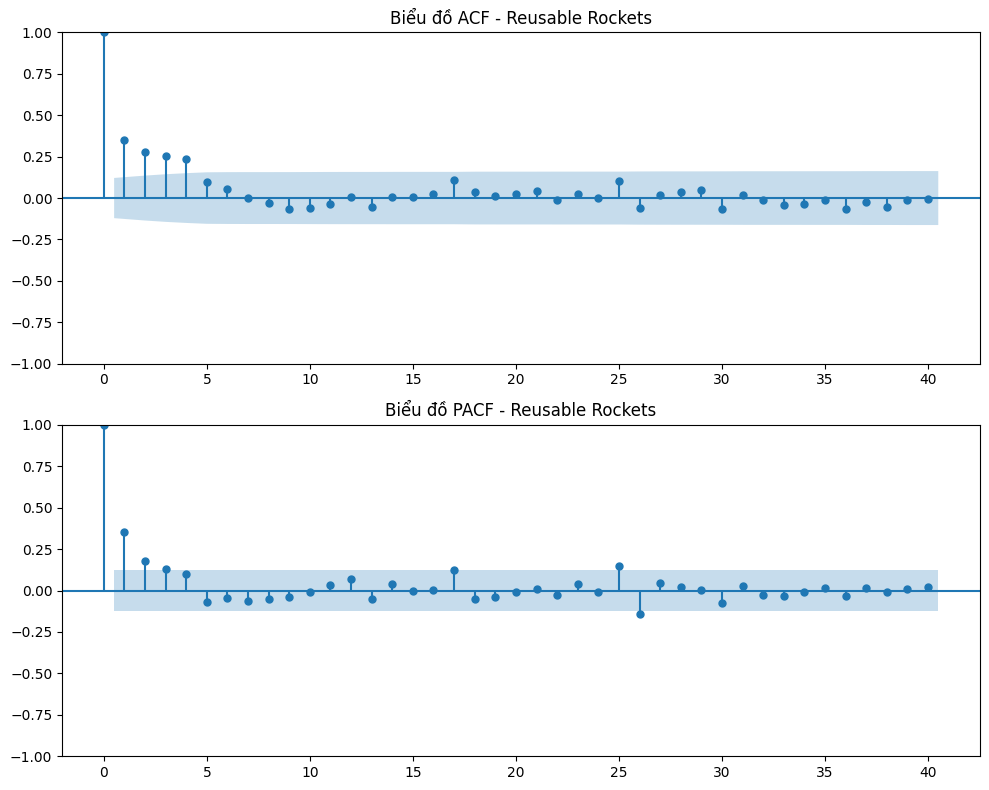


 Đang vẽ ACF & PACF cho: Cloud computing platforms


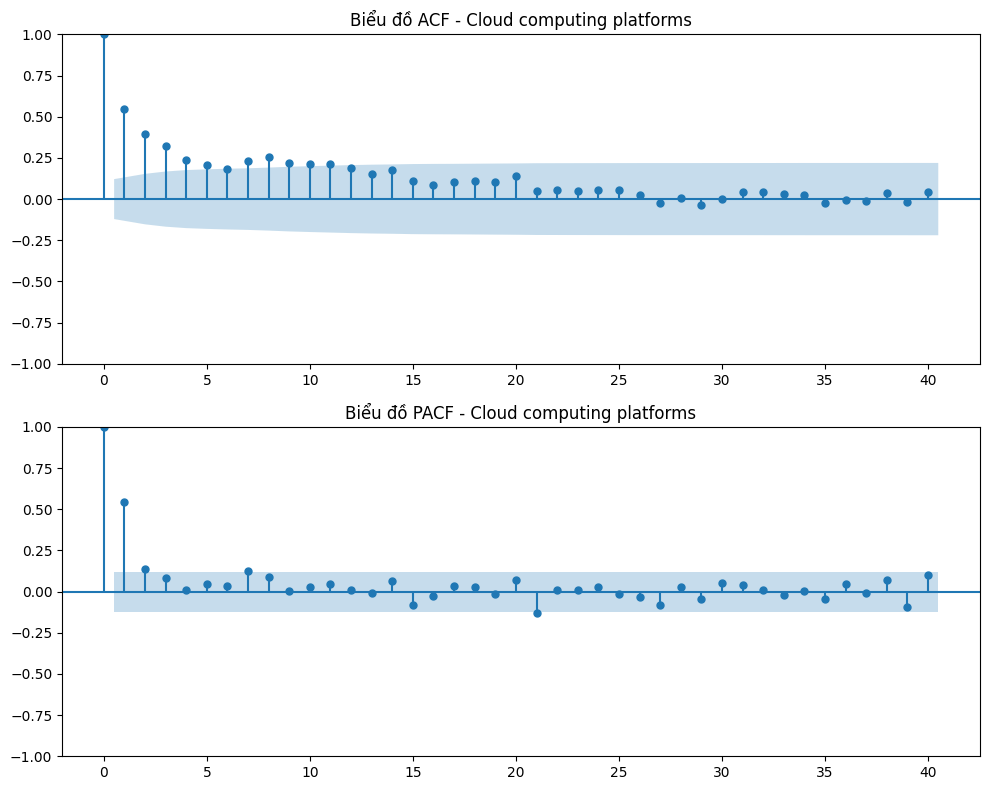


 Đang vẽ ACF & PACF cho: Synthetic Data


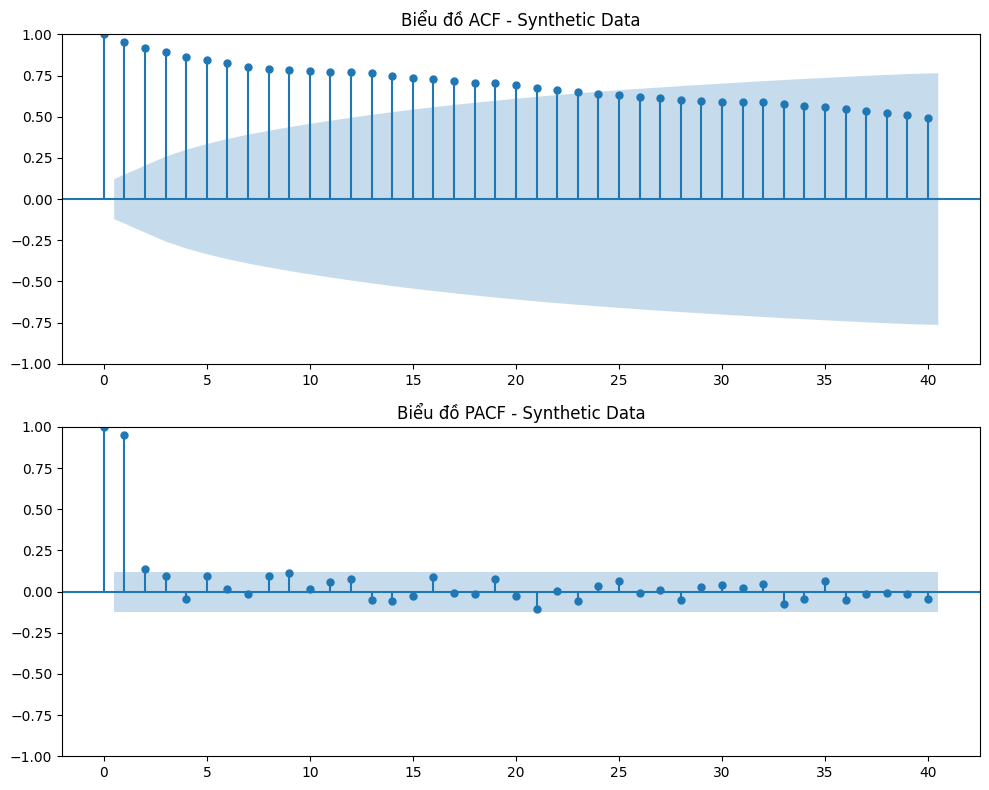


 Đang vẽ ACF & PACF cho: Carbon Capture


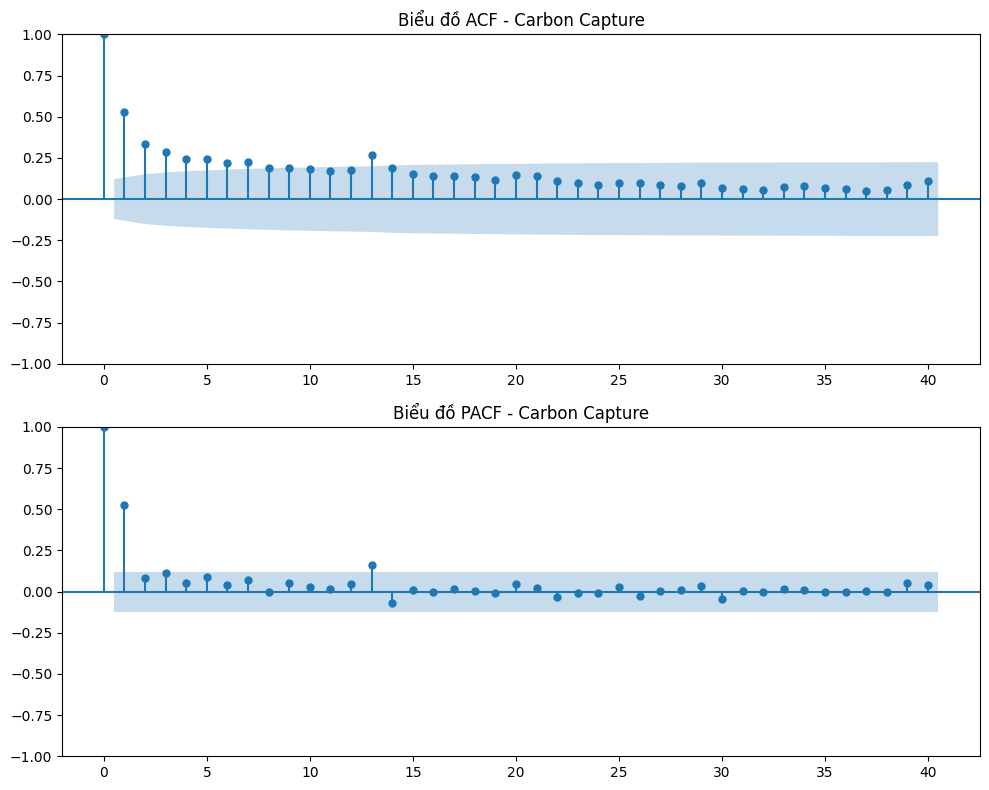


 Đang vẽ ACF & PACF cho: IoT security and trust


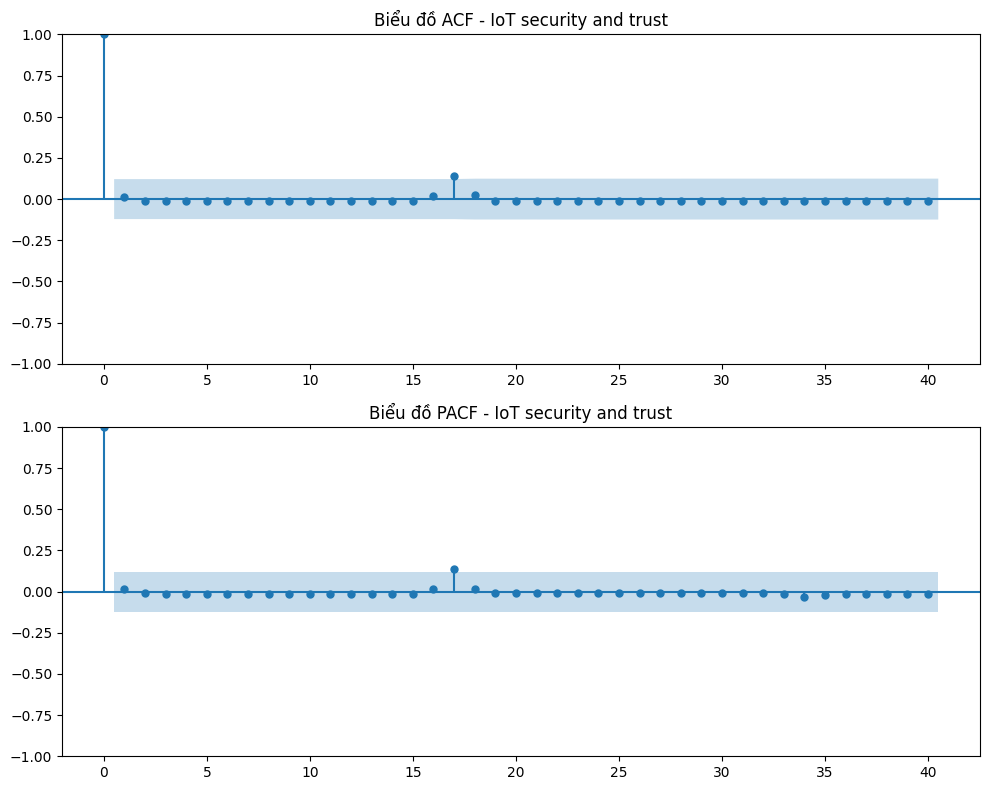


 Đang vẽ ACF & PACF cho: LiDAR


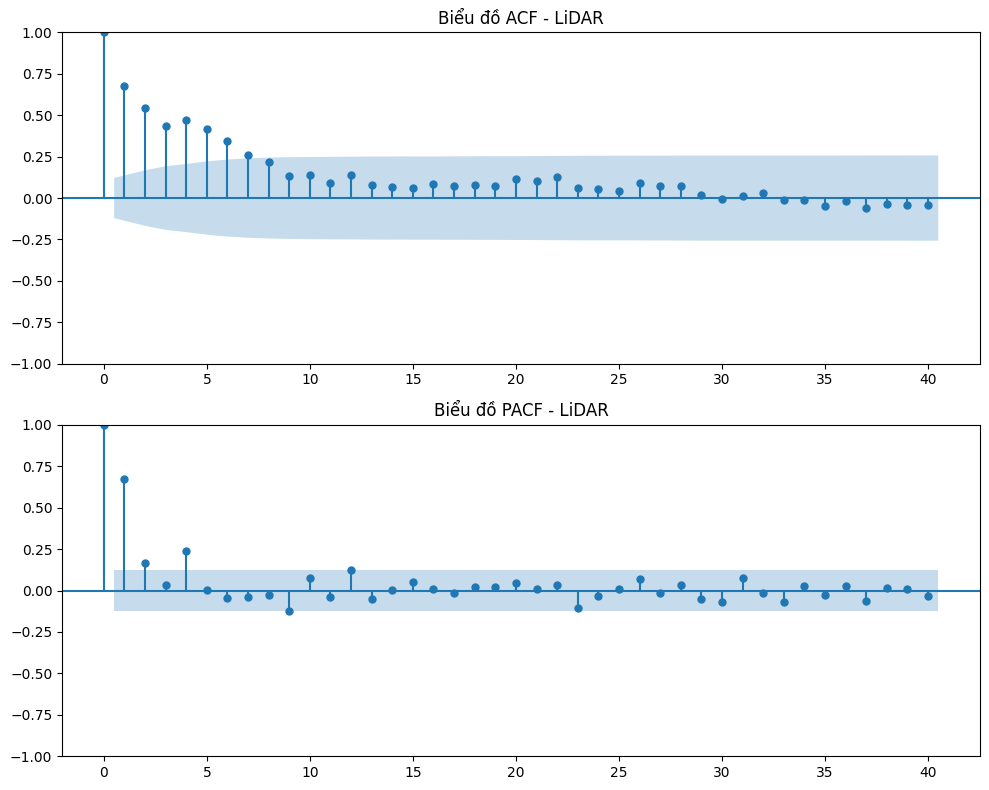


 Đang vẽ ACF & PACF cho: NLP


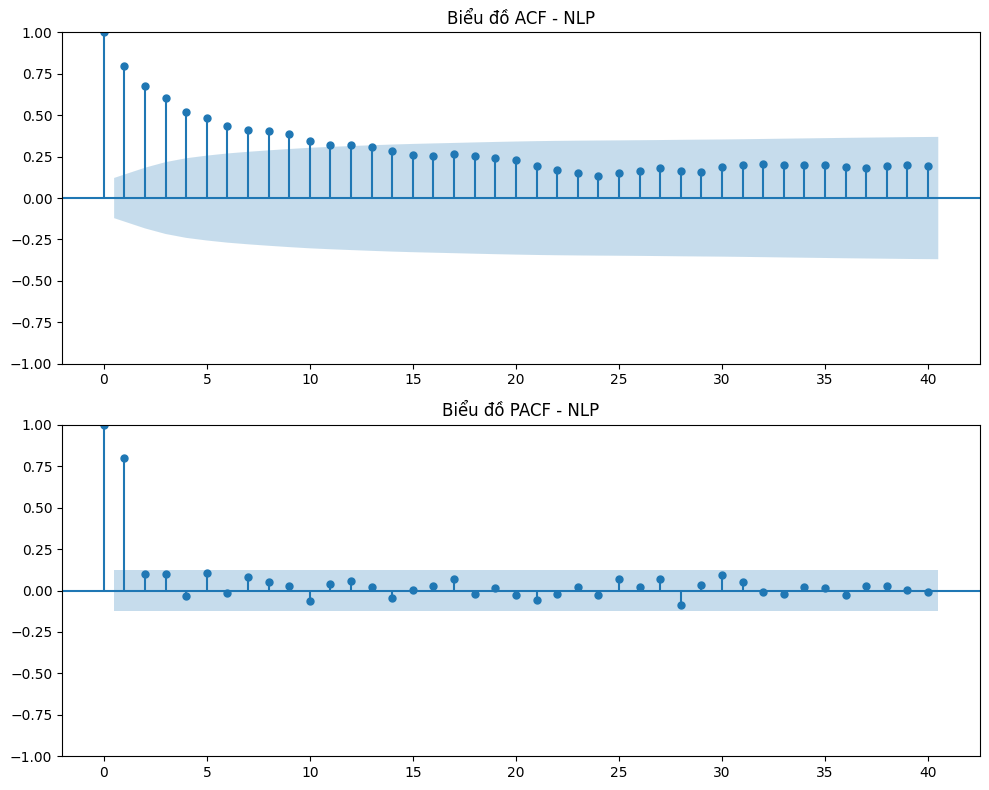


 Đang vẽ ACF & PACF cho: Network Slicing


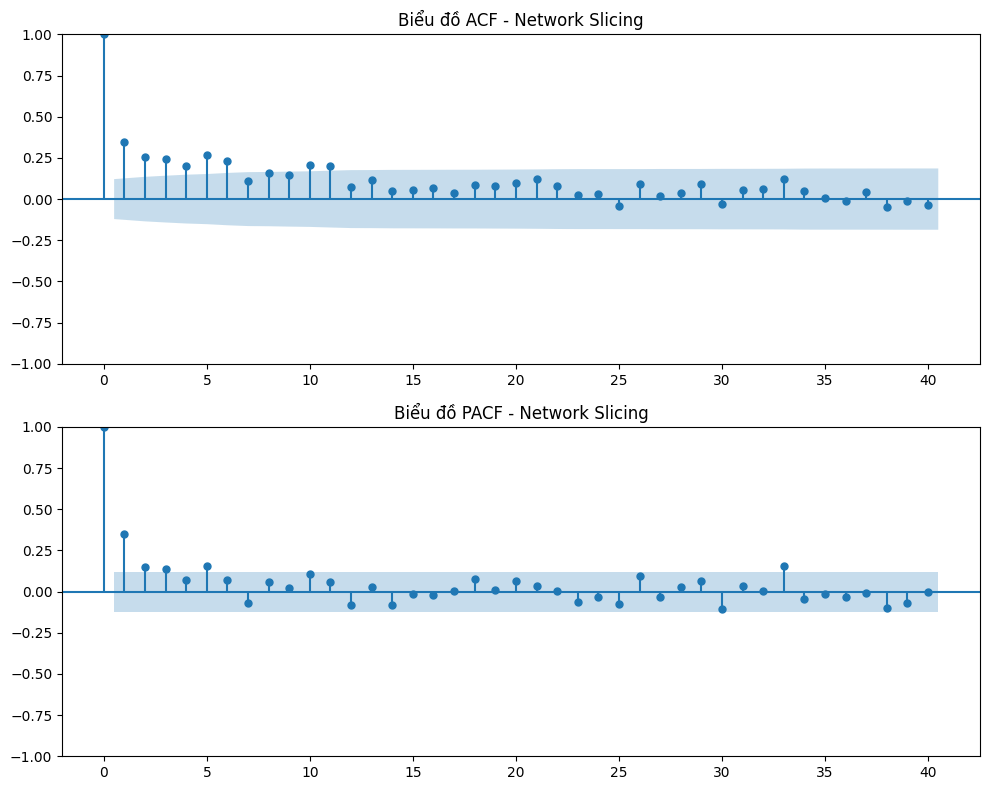


 Đang vẽ ACF & PACF cho: Vertical Farming


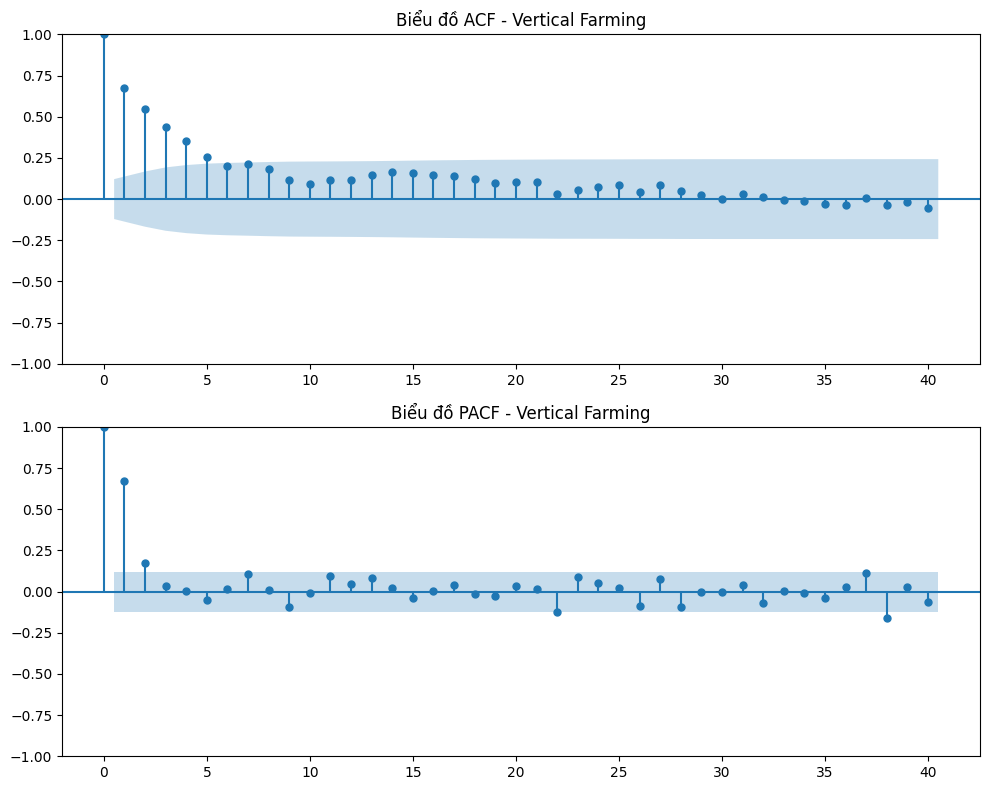


 Đang vẽ ACF & PACF cho: V2X


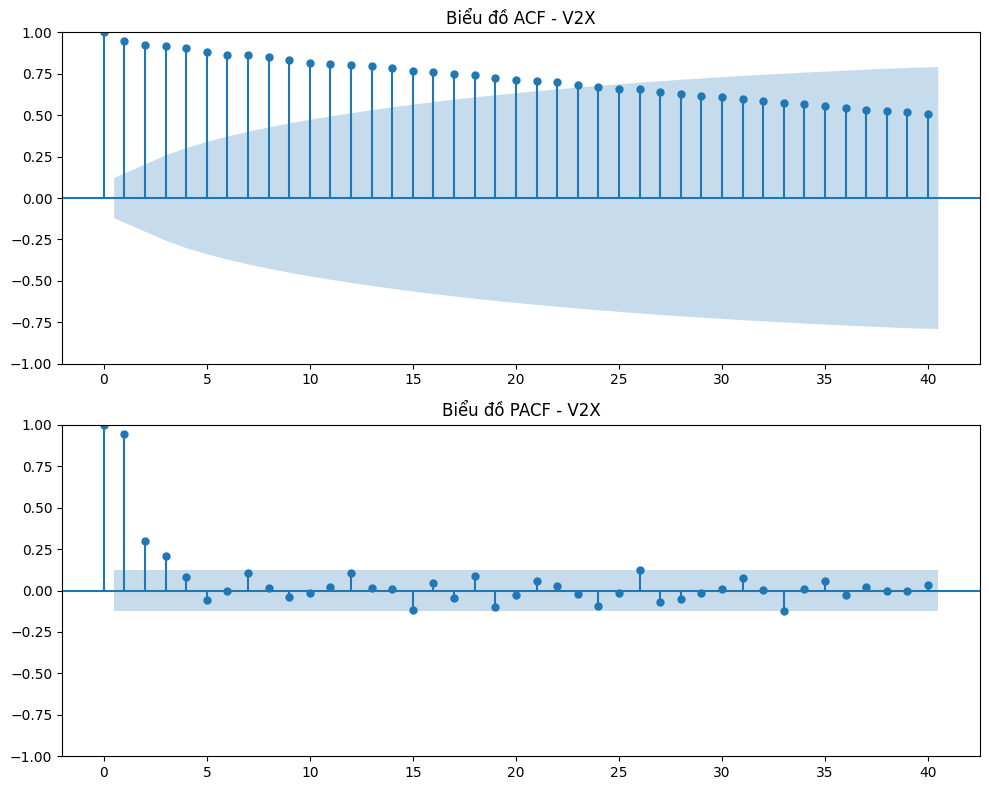


 Đang vẽ ACF & PACF cho: Zero Trust


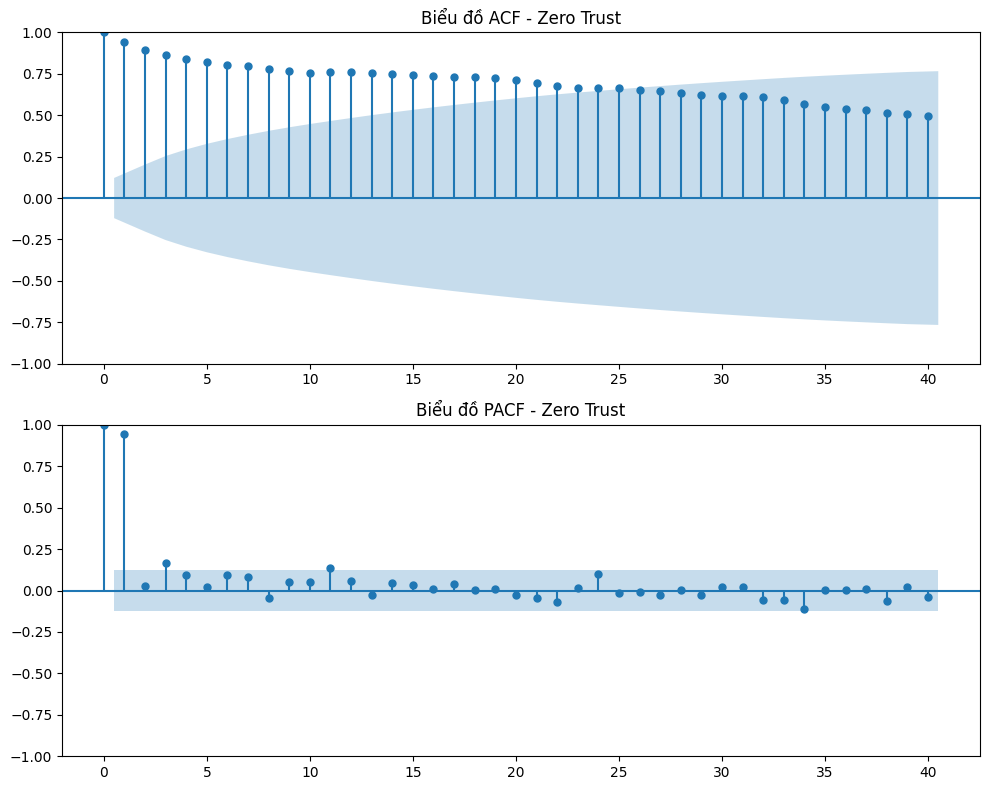


 Đang vẽ ACF & PACF cho: Nano robotics


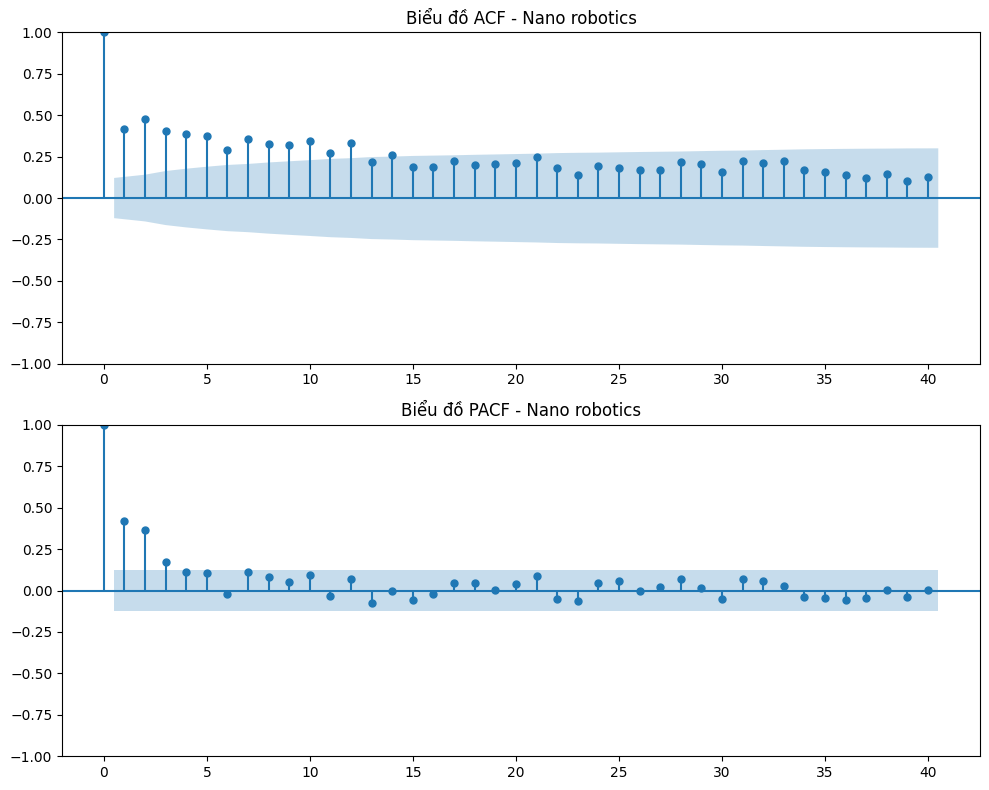


 Đang vẽ ACF & PACF cho: Applied AI


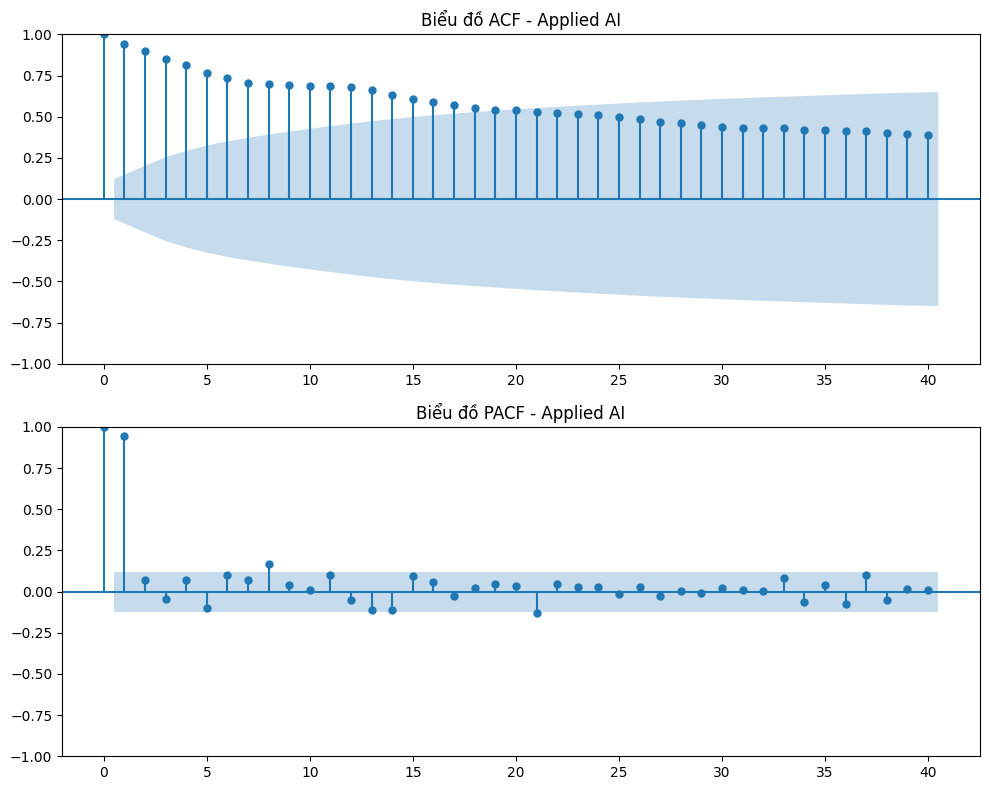


 Đang vẽ ACF & PACF cho: Bioprinting


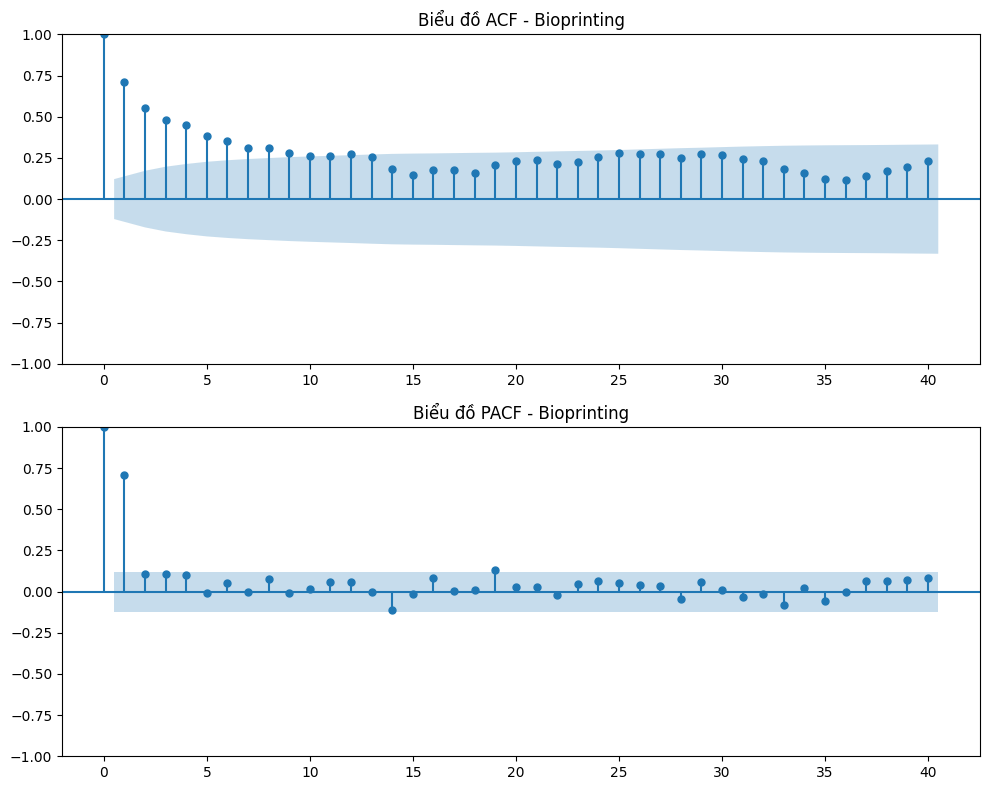


 Đang vẽ ACF & PACF cho: NFT


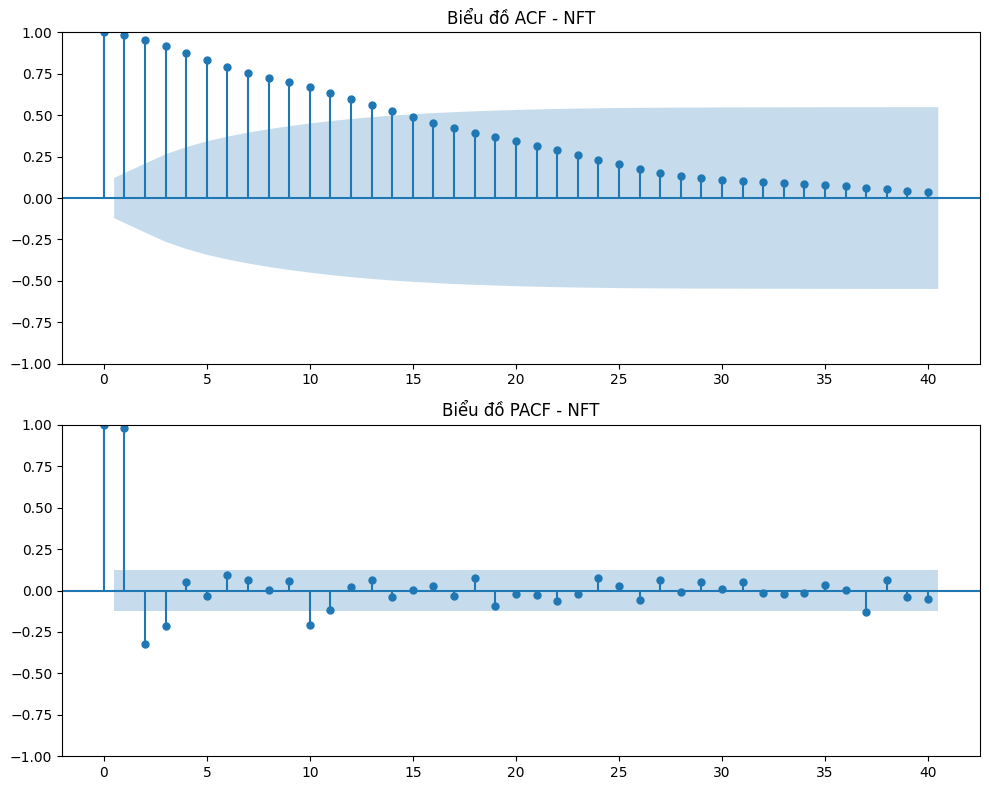


 Đang vẽ ACF & PACF cho: Metaverse


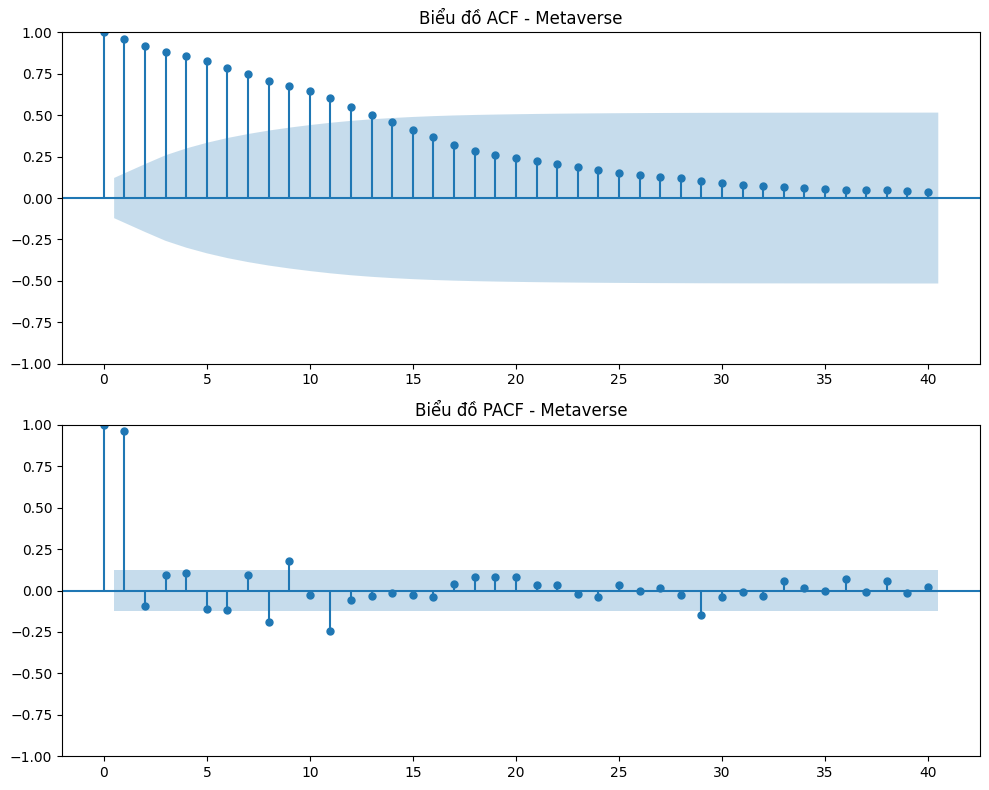


 Đang vẽ ACF & PACF cho: Reinforcement Learning


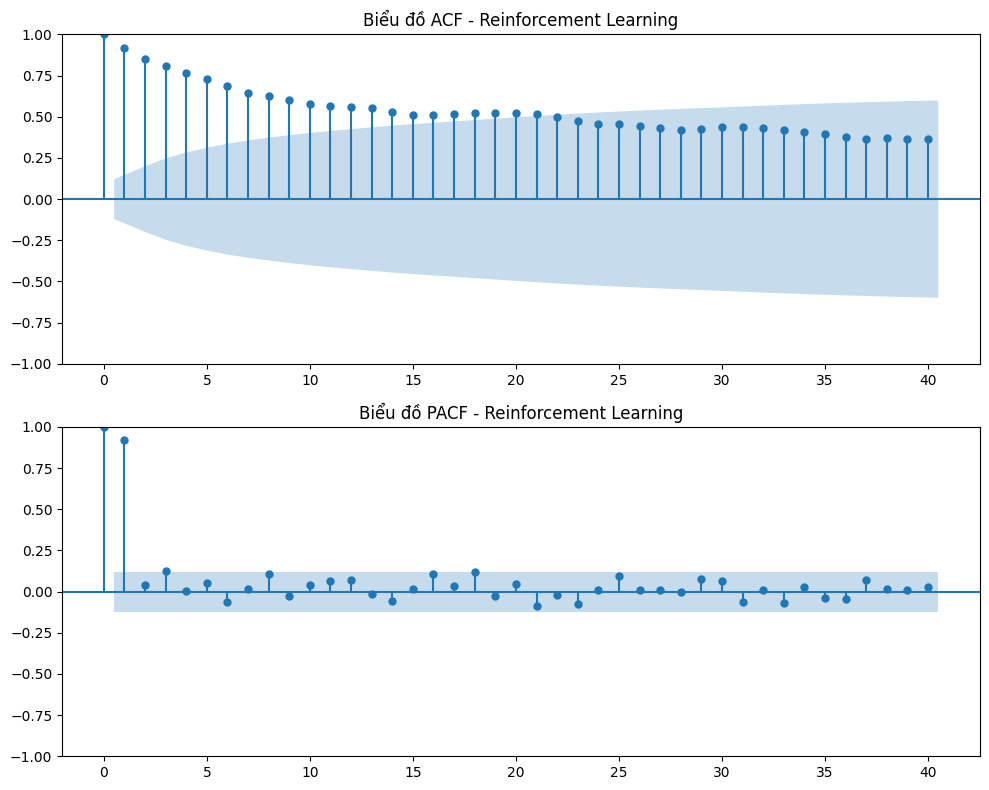


 Đang vẽ ACF & PACF cho: AR Glasses


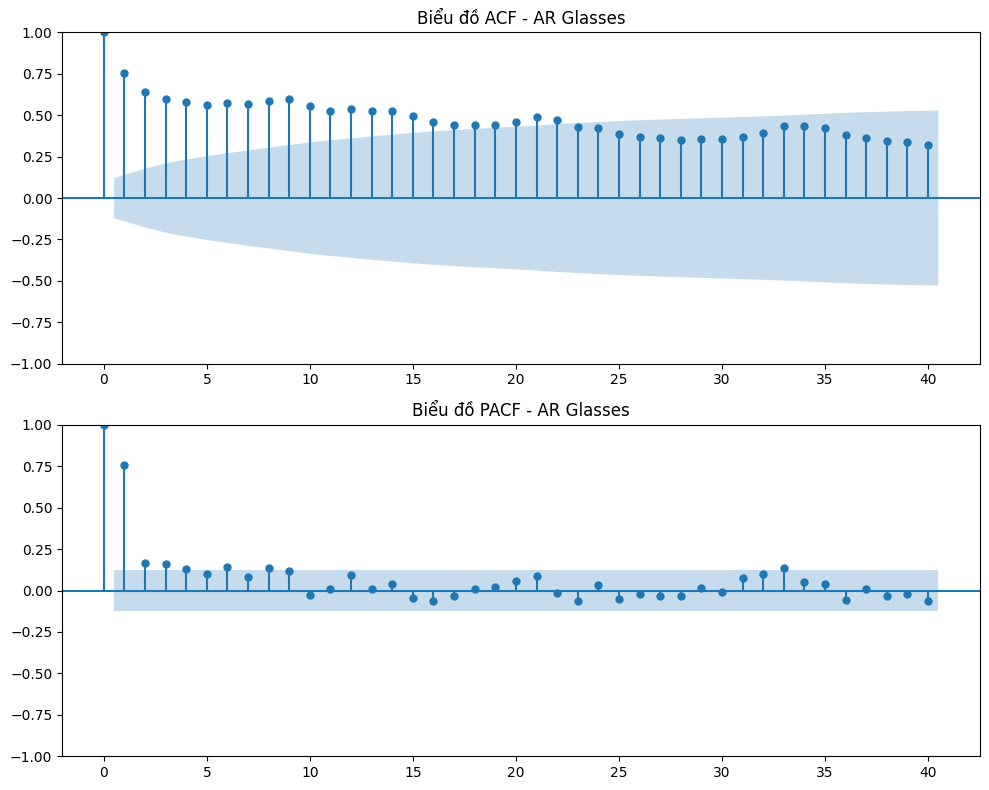

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
# Xác định danh sách từ khóa (bỏ cột "date" nếu có)
# Instead of using df.columns, use df_cleaned['keyword'].unique()
keywords = df_cleaned['keyword'].unique()

# Vẽ biểu đồ ACF & PACF cho từng từ khóa
for keyword in keywords:
    print(f"\n Đang vẽ ACF & PACF cho: {keyword}")

    # Lấy dữ liệu của từ khóa & loại bỏ giá trị NaN
    # Filter df_cleaned instead of df
    data = df_cleaned[df_cleaned['keyword'] == keyword]['interest_over_time'].dropna()

    # Tạo figure
    fig, axes = plt.subplots(2, 1, figsize=(10, 8))

    # Vẽ biểu đồ ACF
    plot_acf(data, lags=40, ax=axes[0])
    axes[0].set_title(f'Biểu đồ ACF - {keyword}')

    # Vẽ biểu đồ PACF
    plot_pacf(data, lags=40, ax=axes[1])
    axes[1].set_title(f'Biểu đồ PACF - {keyword}')

    plt.tight_layout()
    plt.show()

In [ ]:
# 🔍 Loại bỏ cột thời gian nếu có
if "date" in df.columns:
    df.set_index("date", inplace=True)

# 📊 Lặp qua từng từ khóa để huấn luyện mô hình ARIMA
for keyword in df_cleaned['keyword'].unique(): # Iterate over unique keywords from df_cleaned
    print(f"\n🔍 Huấn luyện mô hình ARIMA cho: {keyword}")

    # Kiểm định tính dừng bằng ADF Test
    # Access 'interest_over_time' column for numeric data
    result = adfuller(df_cleaned[df_cleaned['keyword'] == keyword]['interest_over_time'].dropna())
    print(f"ADF Statistic: {result[0]:.4f}")
    print(f"P-Value: {result[1]:.4f}")

    # Nếu chuỗi không dừng, lấy sai phân bậc 1
    if result[1] >= 0.05:
        print("⚠️ Chuỗi không dừng, thực hiện lấy sai phân bậc 1.")
        # Apply diff to 'interest_over_time' column
        df_train = df_cleaned[df_cleaned['keyword'] == keyword]['interest_over_time'].diff().dropna()
    else:
        print("✅ Chuỗi có tính dừng, sử dụng dữ liệu gốc.")
        # Use 'interest_over_time' column for training
        df_train = df_cleaned[df_cleaned['keyword'] == keyword]['interest_over_time']

    # 📈 Huấn luyện mô hình ARIMA
    try:
        model = ARIMA(df_train, order=(2, 1, 0))  # (p,d,q) có thể điều chỉnh
        model_fit = model.fit()

        # In tóm tắt kết quả
        print(model_fit.summary())

    except Exception as e:
        print(f"❌ Lỗi khi huấn luyện ARIMA cho {keyword}: {e}")


🔍 Huấn luyện mô hình ARIMA cho: AI Security
ADF Statistic: 2.9192
P-Value: 1.0000
⚠️ Chuỗi không dừng, thực hiện lấy sai phân bậc 1.


/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)


                               SARIMAX Results                                
Dep. Variable:     interest_over_time   No. Observations:                  260
Model:                 ARIMA(2, 1, 0)   Log Likelihood                -683.387
Date:                Fri, 14 Mar 2025   AIC                           1372.774
Time:                        20:19:16   BIC                           1383.444
Sample:                    03-22-2020   HQIC                          1377.064
                         - 03-09-2025                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.7064      0.021    -34.006      0.000      -0.747      -0.666
ar.L2         -0.5168      0.040    -12.911      0.000      -0.595      -0.438
sigma2        11.4260      0.435     26.261      0.0

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)


ADF Statistic: -3.1466
P-Value: 0.0233
✅ Chuỗi có tính dừng, sử dụng dữ liệu gốc.


/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)


                               SARIMAX Results                                
Dep. Variable:     interest_over_time   No. Observations:                  261
Model:                 ARIMA(2, 1, 0)   Log Likelihood                -962.440
Date:                Fri, 14 Mar 2025   AIC                           1930.881
Time:                        20:19:17   BIC                           1941.563
Sample:                    03-15-2020   HQIC                          1935.175
                         - 03-09-2025                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.5769      0.055    -10.411      0.000      -0.685      -0.468
ar.L2         -0.3433      0.057     -6.073      0.000      -0.454      -0.233
sigma2        95.9418      8.690     11.041      0.0

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)


ADF Statistic: -3.4134
P-Value: 0.0105
✅ Chuỗi có tính dừng, sử dụng dữ liệu gốc.


/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)


                               SARIMAX Results                                
Dep. Variable:     interest_over_time   No. Observations:                  261
Model:                 ARIMA(2, 1, 0)   Log Likelihood                -910.538
Date:                Fri, 14 Mar 2025   AIC                           1827.077
Time:                        20:19:18   BIC                           1837.759
Sample:                    03-15-2020   HQIC                          1831.371
                         - 03-09-2025                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.4347      0.015    -28.950      0.000      -0.464      -0.405
ar.L2         -0.2295      0.024     -9.630      0.000      -0.276      -0.183
sigma2        64.4135      1.158     55.605      0.0

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)


                               SARIMAX Results                                
Dep. Variable:     interest_over_time   No. Observations:                  260
Model:                 ARIMA(2, 1, 0)   Log Likelihood                -928.980
Date:                Fri, 14 Mar 2025   AIC                           1863.961
Time:                        20:19:18   BIC                           1874.631
Sample:                    03-22-2020   HQIC                          1868.251
                         - 03-09-2025                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.8315      0.058    -14.248      0.000      -0.946      -0.717
ar.L2         -0.5014      0.060     -8.300      0.000      -0.620      -0.383
sigma2        76.1012      6.938     10.970      0.0

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)


                               SARIMAX Results                                
Dep. Variable:     interest_over_time   No. Observations:                  260
Model:                 ARIMA(2, 1, 0)   Log Likelihood               -1178.960
Date:                Fri, 14 Mar 2025   AIC                           2363.919
Time:                        20:19:18   BIC                           2374.590
Sample:                    03-22-2020   HQIC                          2368.210
                         - 03-09-2025                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.9746      0.038    -25.426      0.000      -1.050      -0.900
ar.L2         -0.4783      0.052     -9.271      0.000      -0.579      -0.377
sigma2       524.1940     33.851     15.485      0.0

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  

ADF Statistic: 0.5270
P-Value: 0.9857
⚠️ Chuỗi không dừng, thực hiện lấy sai phân bậc 1.
                               SARIMAX Results                                
Dep. Variable:     interest_over_time   No. Observations:                  260
Model:                 ARIMA(2, 1, 0)   Log Likelihood                -838.974
Date:                Fri, 14 Mar 2025   AIC                           1683.948
Time:                        20:19:19   BIC                           1694.618
Sample:                    03-22-2020   HQIC                          1688.238
                         - 03-09-2025                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.6676      0.044    -15.271      0.000      -0.753      -0.582
ar.L2         -0.4531      0.046     -9.87

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  

                               SARIMAX Results                                
Dep. Variable:     interest_over_time   No. Observations:                  261
Model:                 ARIMA(2, 1, 0)   Log Likelihood                -975.786
Date:                Fri, 14 Mar 2025   AIC                           1957.572
Time:                        20:19:19   BIC                           1968.254
Sample:                    03-15-2020   HQIC                          1961.867
                         - 03-09-2025                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.3398      0.057     -5.975      0.000      -0.451      -0.228
ar.L2         -0.1685      0.057     -2.947      0.003      -0.281      -0.056
sigma2       106.4775      9.452     11.266      0.0

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  

                               SARIMAX Results                                
Dep. Variable:     interest_over_time   No. Observations:                  261
Model:                 ARIMA(2, 1, 0)   Log Likelihood                -853.034
Date:                Fri, 14 Mar 2025   AIC                           1712.069
Time:                        20:19:19   BIC                           1722.751
Sample:                    03-15-2020   HQIC                          1716.363
                         - 03-09-2025                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.2147      0.040     -5.412      0.000      -0.292      -0.137
ar.L2         -0.1259      0.046     -2.767      0.006      -0.215      -0.037
sigma2        41.4154      1.355     30.574      0.0

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  

                               SARIMAX Results                                
Dep. Variable:     interest_over_time   No. Observations:                  261
Model:                 ARIMA(2, 1, 0)   Log Likelihood                -825.608
Date:                Fri, 14 Mar 2025   AIC                           1657.216
Time:                        20:19:20   BIC                           1667.898
Sample:                    03-15-2020   HQIC                          1661.511
                         - 03-09-2025                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.2528      0.045     -5.627      0.000      -0.341      -0.165
ar.L2         -0.2710      0.042     -6.504      0.000      -0.353      -0.189
sigma2        33.5223      1.364     24.584      0.0

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  

                               SARIMAX Results                                
Dep. Variable:     interest_over_time   No. Observations:                  260
Model:                 ARIMA(2, 1, 0)   Log Likelihood                -831.448
Date:                Fri, 14 Mar 2025   AIC                           1668.896
Time:                        20:19:20   BIC                           1679.567
Sample:                    03-22-2020   HQIC                          1673.186
                         - 03-09-2025                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.7725      0.043    -17.981      0.000      -0.857      -0.688
ar.L2         -0.4302      0.048     -8.907      0.000      -0.525      -0.336
sigma2        35.8613      2.282     15.711      0.0

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  

                               SARIMAX Results                                
Dep. Variable:     interest_over_time   No. Observations:                  260
Model:                 ARIMA(2, 1, 0)   Log Likelihood                -764.402
Date:                Fri, 14 Mar 2025   AIC                           1534.805
Time:                        20:19:20   BIC                           1545.475
Sample:                    03-22-2020   HQIC                          1539.095
                         - 03-09-2025                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.7515      0.038    -19.822      0.000      -0.826      -0.677
ar.L2         -0.4269      0.040    -10.577      0.000      -0.506      -0.348
sigma2        21.3710      1.015     21.061      0.0

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  

                               SARIMAX Results                                
Dep. Variable:     interest_over_time   No. Observations:                  260
Model:                 ARIMA(2, 1, 0)   Log Likelihood                -895.040
Date:                Fri, 14 Mar 2025   AIC                           1796.081
Time:                        20:19:20   BIC                           1806.751
Sample:                    03-22-2020   HQIC                          1800.371
                         - 03-09-2025                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.7471      0.053    -14.125      0.000      -0.851      -0.643
ar.L2         -0.3769      0.055     -6.905      0.000      -0.484      -0.270
sigma2        58.6210      3.619     16.198      0.0

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  

                               SARIMAX Results                                
Dep. Variable:     interest_over_time   No. Observations:                  260
Model:                 ARIMA(2, 1, 0)   Log Likelihood                -925.972
Date:                Fri, 14 Mar 2025   AIC                           1857.943
Time:                        20:19:21   BIC                           1868.614
Sample:                    03-22-2020   HQIC                          1862.234
                         - 03-09-2025                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.7213      0.017    -43.578      0.000      -0.754      -0.689
ar.L2         -0.4620      0.025    -18.778      0.000      -0.510      -0.414
sigma2        74.4068      1.960     37.959      0.0

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/stattools.py:1431: RuntimeWarning: divide by zero encountered in divide
  test_statistic = numer_squared_sum / denom_squared_sum
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(date

                               SARIMAX Results                                
Dep. Variable:     interest_over_time   No. Observations:                  261
Model:                 ARIMA(2, 1, 0)   Log Likelihood                -863.743
Date:                Fri, 14 Mar 2025   AIC                           1733.487
Time:                        20:19:21   BIC                           1744.169
Sample:                    03-15-2020   HQIC                          1737.781
                         - 03-09-2025                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.3767      0.027    -13.951      0.000      -0.430      -0.324
ar.L2         -0.2397      0.037     -6.472      0.000      -0.312      -0.167
sigma2        44.9458      0.885     50.792      0.0

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  

                               SARIMAX Results                                
Dep. Variable:     interest_over_time   No. Observations:                  261
Model:                 ARIMA(2, 1, 0)   Log Likelihood                -876.929
Date:                Fri, 14 Mar 2025   AIC                           1759.859
Time:                        20:19:21   BIC                           1770.541
Sample:                    03-15-2020   HQIC                          1764.153
                         - 03-09-2025                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.3738      0.011    -34.602      0.000      -0.395      -0.353
ar.L2         -0.3195      0.014    -22.431      0.000      -0.347      -0.292
sigma2        49.7287      0.718     69.236      0.0

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  

ADF Statistic: -4.9427
P-Value: 0.0000
✅ Chuỗi có tính dừng, sử dụng dữ liệu gốc.
                               SARIMAX Results                                
Dep. Variable:     interest_over_time   No. Observations:                  261
Model:                 ARIMA(2, 1, 0)   Log Likelihood               -1054.448
Date:                Fri, 14 Mar 2025   AIC                           2114.896
Time:                        20:19:21   BIC                           2125.578
Sample:                    03-15-2020   HQIC                          2119.190
                         - 03-09-2025                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.5727      0.036    -15.943      0.000      -0.643      -0.502
ar.L2         -0.2935      0.036     -8.110      

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  

                               SARIMAX Results                                
Dep. Variable:     interest_over_time   No. Observations:                  261
Model:                 ARIMA(2, 1, 0)   Log Likelihood               -1081.800
Date:                Fri, 14 Mar 2025   AIC                           2169.600
Time:                        20:19:22   BIC                           2180.282
Sample:                    03-15-2020   HQIC                          2173.895
                         - 03-09-2025                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.4258      0.054     -7.954      0.000      -0.531      -0.321
ar.L2         -0.2306      0.057     -4.034      0.000      -0.343      -0.119
sigma2       240.5114     19.059     12.619      0.0

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  

                               SARIMAX Results                                
Dep. Variable:     interest_over_time   No. Observations:                  261
Model:                 ARIMA(2, 1, 0)   Log Likelihood                -889.311
Date:                Fri, 14 Mar 2025   AIC                           1784.621
Time:                        20:19:22   BIC                           1795.304
Sample:                    03-15-2020   HQIC                          1788.916
                         - 03-09-2025                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.3806      0.024    -15.802      0.000      -0.428      -0.333
ar.L2         -0.2637      0.023    -11.381      0.000      -0.309      -0.218
sigma2        54.7103      0.743     73.607      0.0

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/stattools.py:1431: RuntimeWarning: divide by zero encountered in divide
  test_statistic = numer_squared_sum / denom_squared_sum
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(date

                               SARIMAX Results                                
Dep. Variable:     interest_over_time   No. Observations:                  261
Model:                 ARIMA(2, 1, 0)   Log Likelihood                -801.698
Date:                Fri, 14 Mar 2025   AIC                           1609.395
Time:                        20:19:22   BIC                           1620.077
Sample:                    03-15-2020   HQIC                          1613.689
                         - 03-09-2025                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.3304      0.039     -8.506      0.000      -0.406      -0.254
ar.L2         -0.1255      0.040     -3.114      0.002      -0.204      -0.047
sigma2        27.8983      0.664     42.035      0.0

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  

                               SARIMAX Results                                
Dep. Variable:     interest_over_time   No. Observations:                  261
Model:                 ARIMA(2, 1, 0)   Log Likelihood                -973.833
Date:                Fri, 14 Mar 2025   AIC                           1953.665
Time:                        20:19:22   BIC                           1964.347
Sample:                    03-15-2020   HQIC                          1957.960
                         - 03-09-2025                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.5620      0.043    -12.940      0.000      -0.647      -0.477
ar.L2         -0.3053      0.061     -4.977      0.000      -0.426      -0.185
sigma2       104.7525      6.049     17.317      0.0

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  

                               SARIMAX Results                                
Dep. Variable:     interest_over_time   No. Observations:                  260
Model:                 ARIMA(2, 1, 0)   Log Likelihood                -865.352
Date:                Fri, 14 Mar 2025   AIC                           1736.704
Time:                        20:19:22   BIC                           1747.375
Sample:                    03-22-2020   HQIC                          1740.995
                         - 03-09-2025                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.9406      0.049    -19.360      0.000      -1.036      -0.845
ar.L2         -0.5030      0.052     -9.648      0.000      -0.605      -0.401
sigma2        46.5350      3.783     12.301      0.0

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  

                               SARIMAX Results                                
Dep. Variable:     interest_over_time   No. Observations:                  260
Model:                 ARIMA(2, 1, 0)   Log Likelihood               -1267.361
Date:                Fri, 14 Mar 2025   AIC                           2540.721
Time:                        20:19:23   BIC                           2551.392
Sample:                    03-22-2020   HQIC                          2545.012
                         - 03-09-2025                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -1.0668      0.049    -21.836      0.000      -1.163      -0.971
ar.L2         -0.4959      0.048    -10.235      0.000      -0.591      -0.401
sigma2      1036.6628     83.252     12.452      0.0

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)


                               SARIMAX Results                                
Dep. Variable:     interest_over_time   No. Observations:                  260
Model:                 ARIMA(2, 1, 0)   Log Likelihood                -810.516
Date:                Fri, 14 Mar 2025   AIC                           1627.033
Time:                        20:19:23   BIC                           1637.703
Sample:                    03-22-2020   HQIC                          1631.323
                         - 03-09-2025                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.7194      0.035    -20.318      0.000      -0.789      -0.650
ar.L2         -0.2716      0.037     -7.330      0.000      -0.344      -0.199
sigma2        30.5346      2.012     15.177      0.0

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)


                               SARIMAX Results                                
Dep. Variable:     interest_over_time   No. Observations:                  261
Model:                 ARIMA(2, 1, 0)   Log Likelihood                -932.934
Date:                Fri, 14 Mar 2025   AIC                           1871.867
Time:                        20:19:24   BIC                           1882.549
Sample:                    03-15-2020   HQIC                          1876.161
                         - 03-09-2025                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.2863      0.031     -9.353      0.000      -0.346      -0.226
ar.L2         -0.2043      0.053     -3.876      0.000      -0.308      -0.101
sigma2        76.5527      3.246     23.581      0.0

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  

                               SARIMAX Results                                
Dep. Variable:     interest_over_time   No. Observations:                  260
Model:                 ARIMA(2, 1, 0)   Log Likelihood                -853.565
Date:                Fri, 14 Mar 2025   AIC                           1713.129
Time:                        20:19:24   BIC                           1723.800
Sample:                    03-22-2020   HQIC                          1717.419
                         - 03-09-2025                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.5113      0.016    -32.850      0.000      -0.542      -0.481
ar.L2         -0.2906      0.022    -13.008      0.000      -0.334      -0.247
sigma2        42.6068      1.103     38.618      0.0

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)


                               SARIMAX Results                                
Dep. Variable:     interest_over_time   No. Observations:                  260
Model:                 ARIMA(2, 1, 0)   Log Likelihood                -870.196
Date:                Fri, 14 Mar 2025   AIC                           1746.392
Time:                        20:19:25   BIC                           1757.063
Sample:                    03-22-2020   HQIC                          1750.683
                         - 03-09-2025                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.6497      0.044    -14.686      0.000      -0.736      -0.563
ar.L2         -0.3891      0.050     -7.741      0.000      -0.488      -0.291
sigma2        48.4031      2.863     16.909      0.0

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)


                               SARIMAX Results                                
Dep. Variable:     interest_over_time   No. Observations:                  260
Model:                 ARIMA(2, 1, 0)   Log Likelihood                -982.281
Date:                Fri, 14 Mar 2025   AIC                           1970.562
Time:                        20:19:25   BIC                           1981.232
Sample:                    03-22-2020   HQIC                          1974.852
                         - 03-09-2025                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.7761      0.020    -37.990      0.000      -0.816      -0.736
ar.L2         -0.4140      0.038    -10.821      0.000      -0.489      -0.339
sigma2       114.9465      3.738     30.754      0.0


🔍 Đang xử lý từ khóa: AI Security


/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)


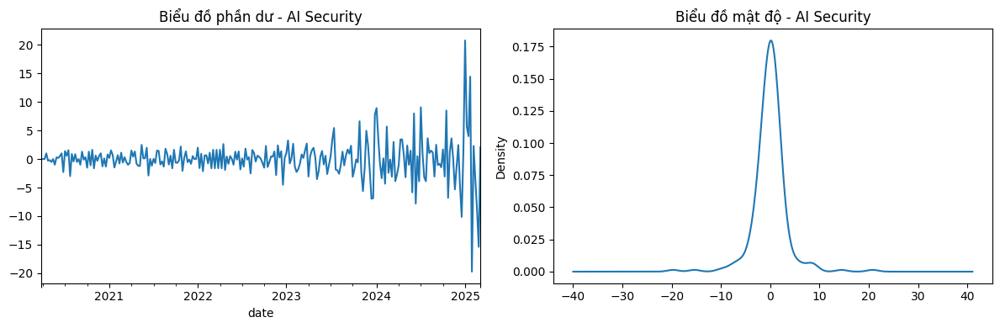


🔍 Đang xử lý từ khóa: FDM


/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)


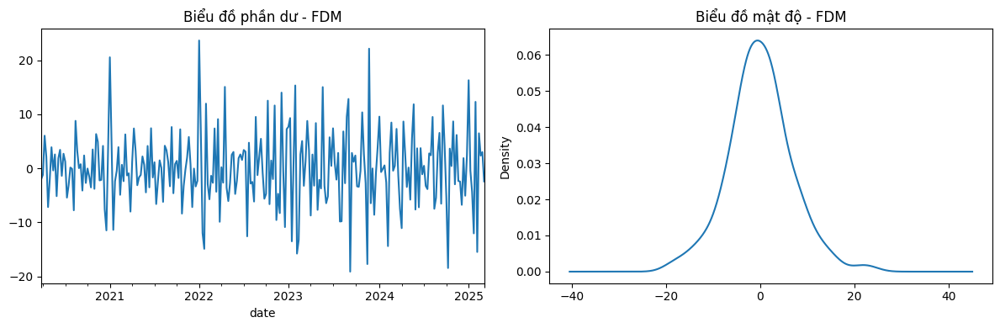


🔍 Đang xử lý từ khóa: RPA Software


/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)


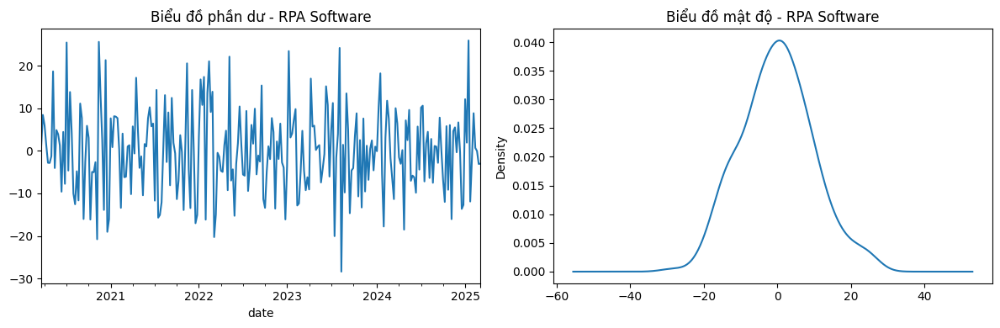


🔍 Đang xử lý từ khóa: Distributed Cloud


/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)


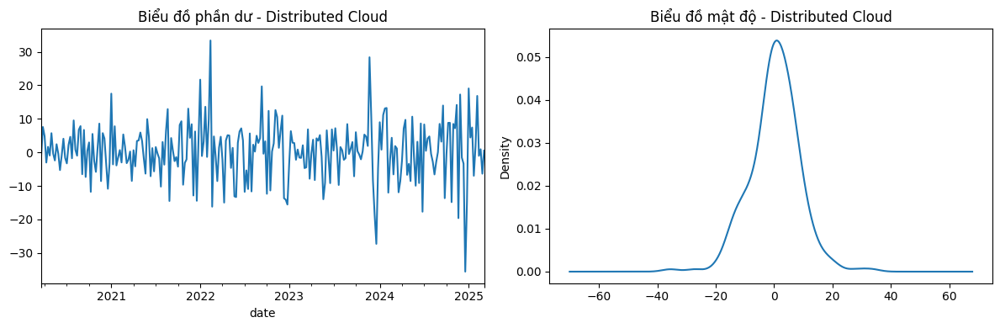


🔍 Đang xử lý từ khóa: Smart Contracts


/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)


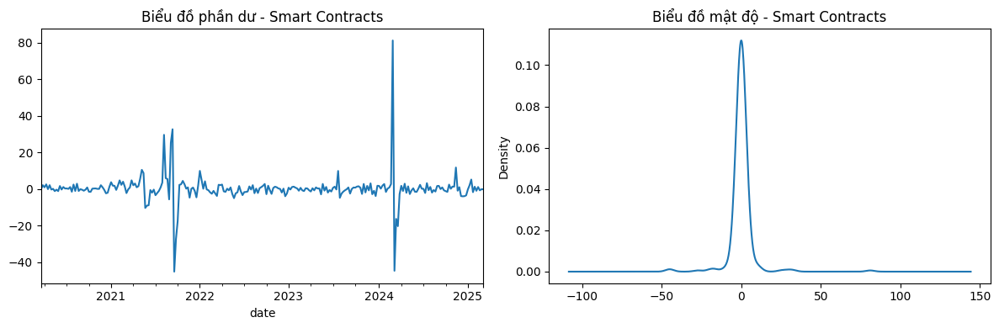


🔍 Đang xử lý từ khóa: Smart Sensors


/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)


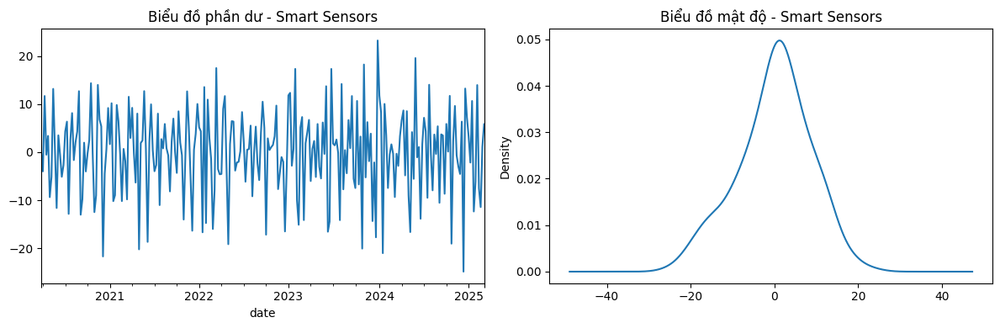


🔍 Đang xử lý từ khóa: Cloud computing for IoT


/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)


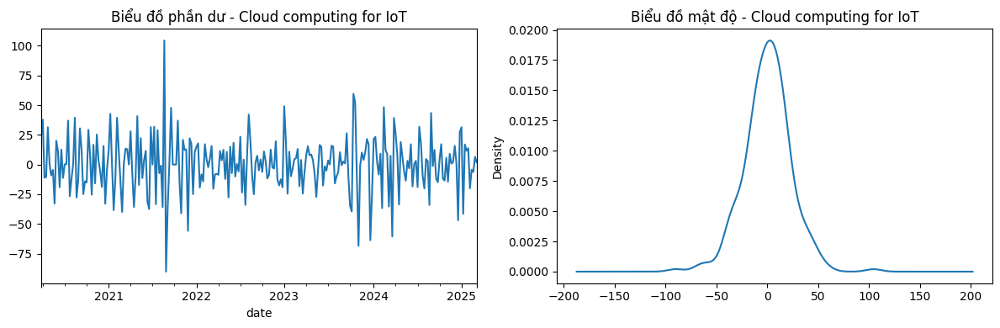


🔍 Đang xử lý từ khóa: Quantum computing


/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)


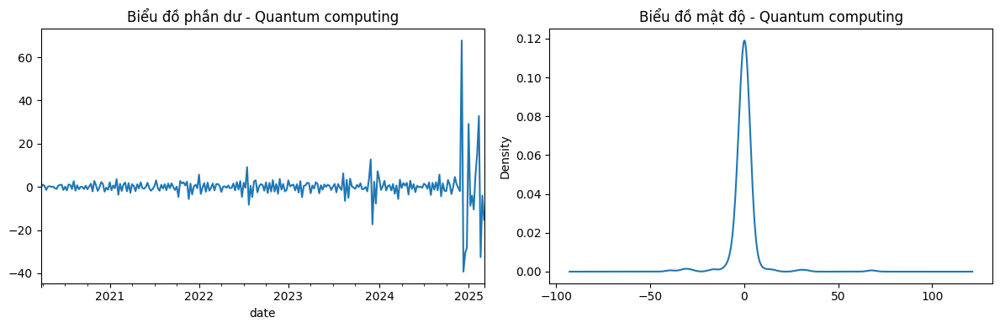


🔍 Đang xử lý từ khóa: Green Hydrogen


/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)


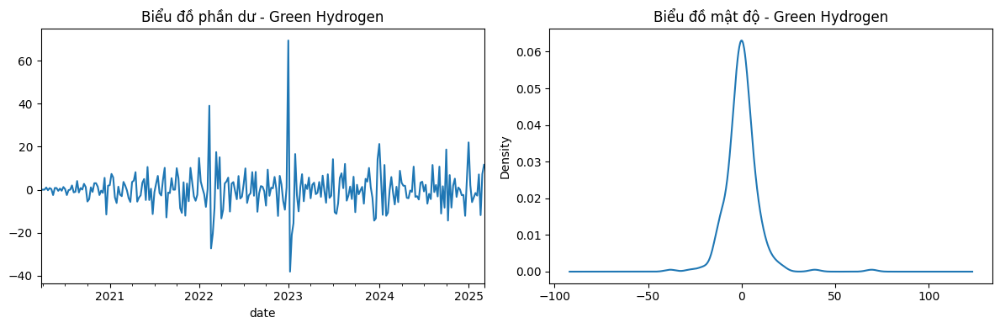


🔍 Đang xử lý từ khóa: Public Cloud


/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)


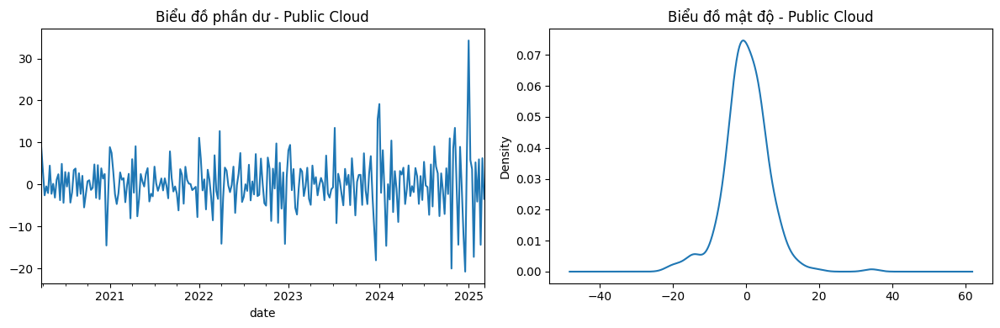


🔍 Đang xử lý từ khóa: Industrial Robots


/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)


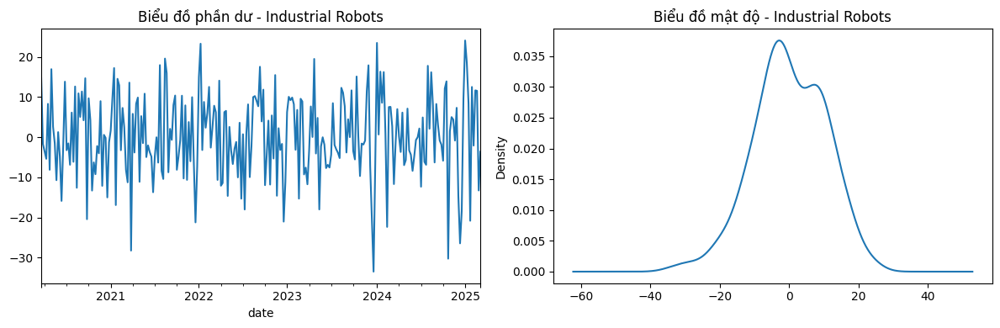


🔍 Đang xử lý từ khóa: Smart grid and IoT


/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)


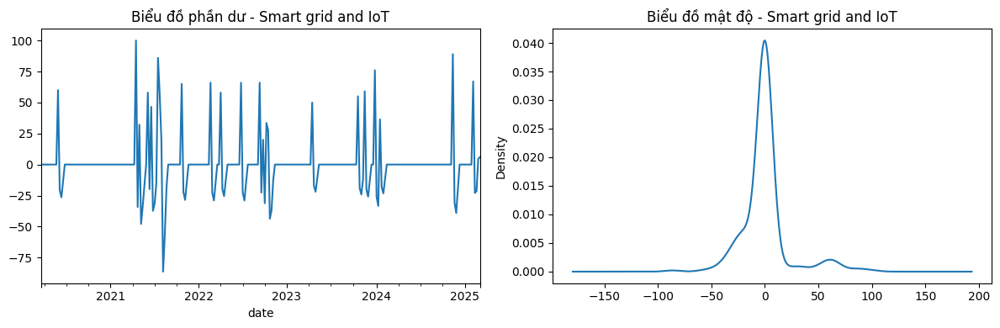


🔍 Đang xử lý từ khóa: VR Headsets


/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)


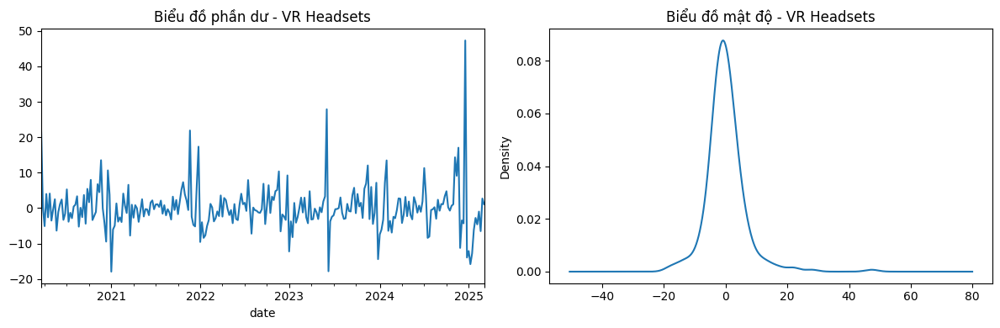


🔍 Đang xử lý từ khóa: Quantum Cryptography


/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)


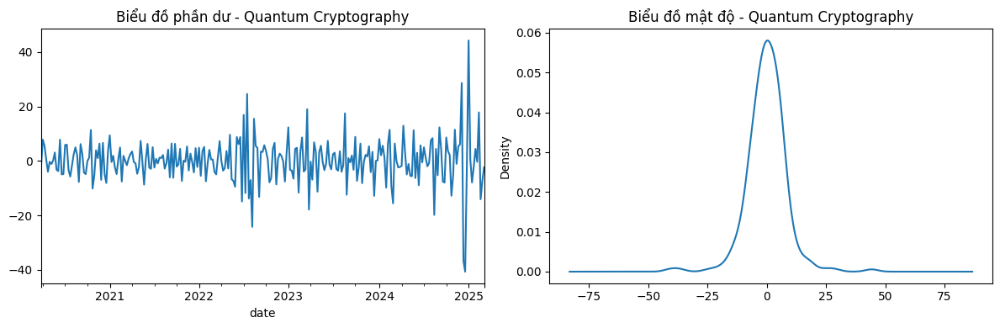


🔍 Đang xử lý từ khóa: Augmented reality


/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)


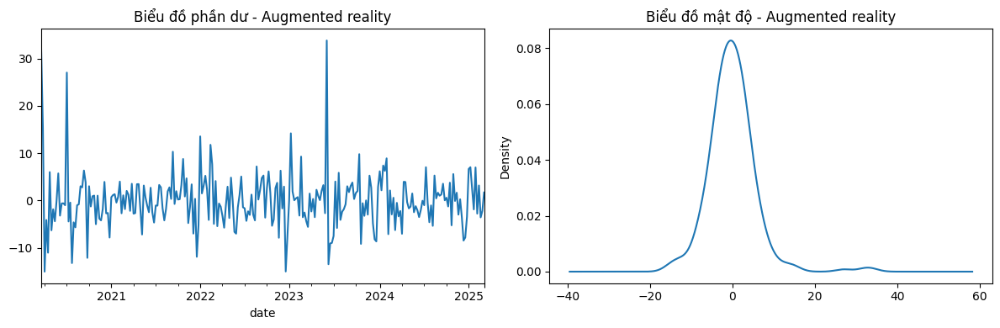


🔍 Đang xử lý từ khóa: Small Satellites


/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)


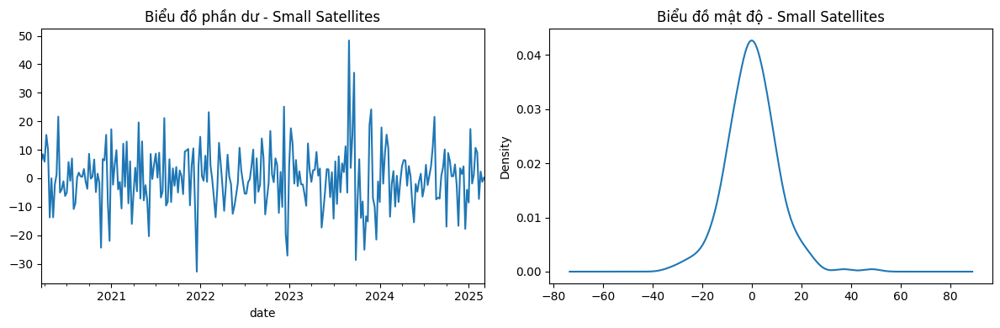


🔍 Đang xử lý từ khóa: Computer vision


/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)


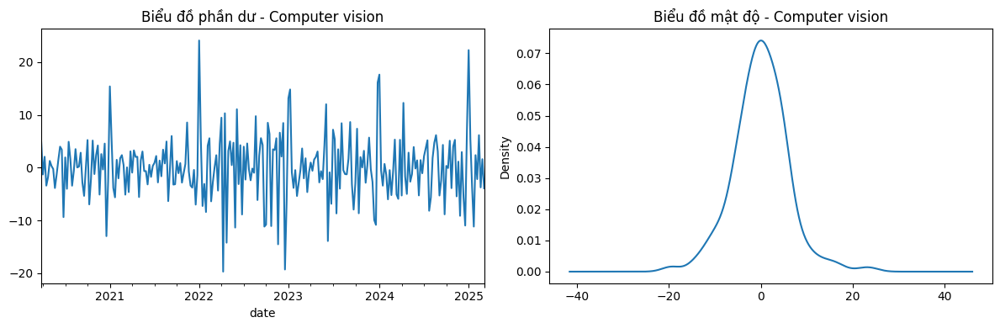


🔍 Đang xử lý từ khóa: Cashless Payment


/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)


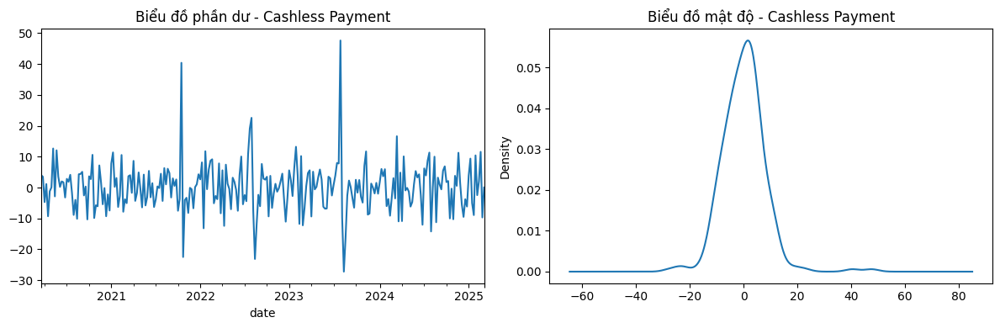


🔍 Đang xử lý từ khóa: Edge AI


/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)


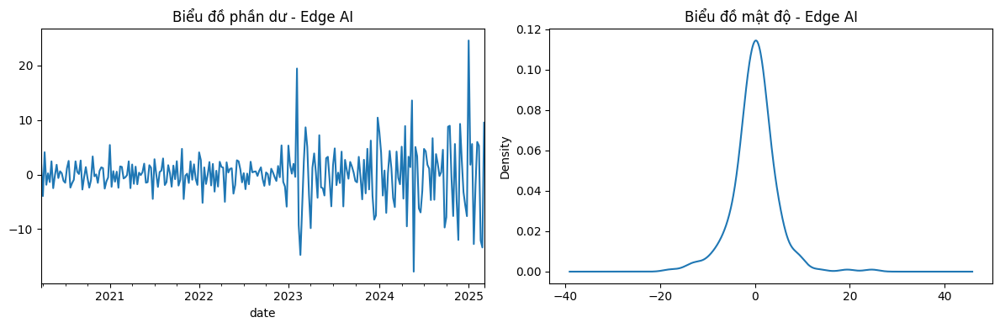


🔍 Đang xử lý từ khóa: Adaptive learning


/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)


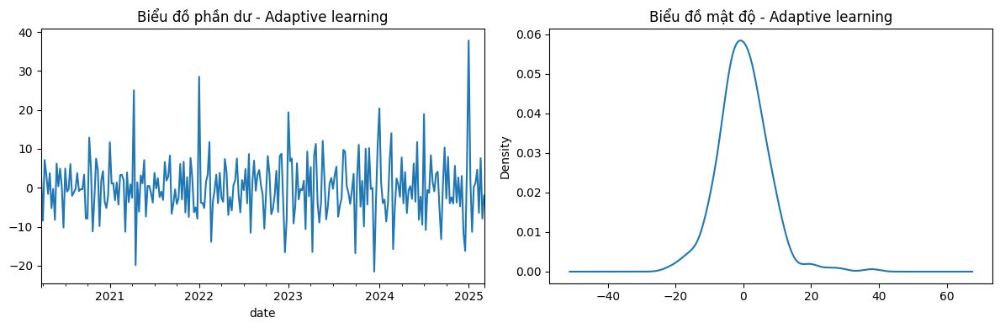


🔍 Đang xử lý từ khóa: Virtual reality technology


/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)


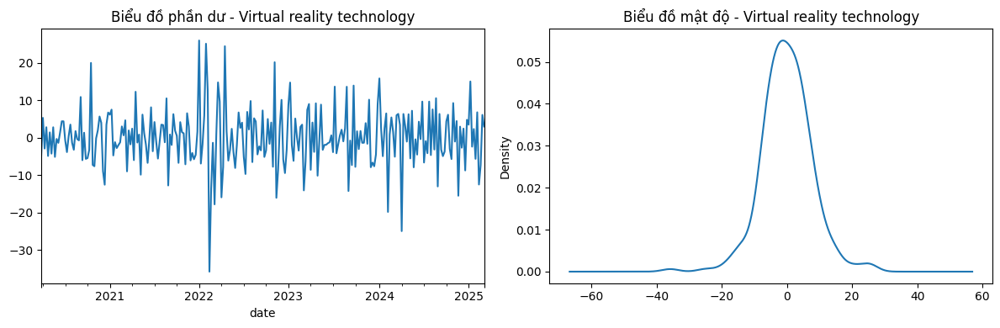


🔍 Đang xử lý từ khóa: Super Apps


/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)


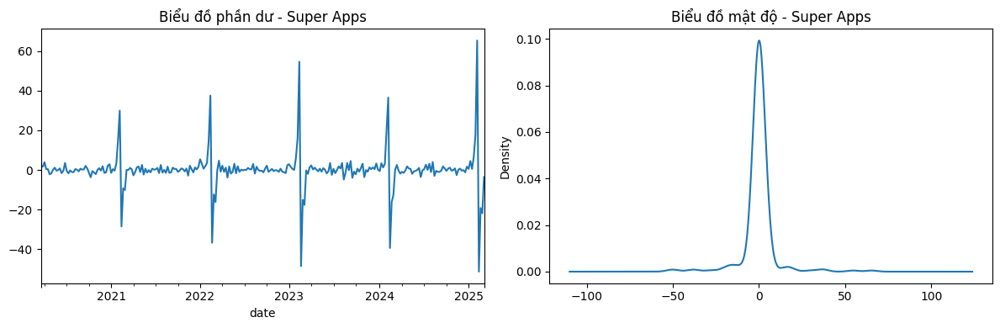


🔍 Đang xử lý từ khóa: Qubits


/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)


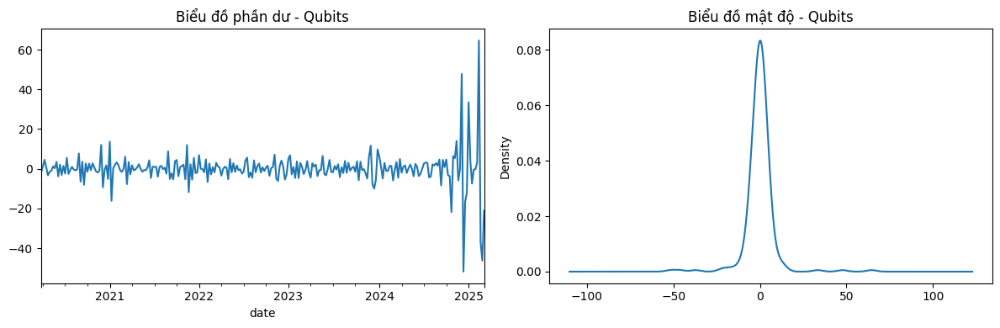


🔍 Đang xử lý từ khóa: Generative AI


/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)


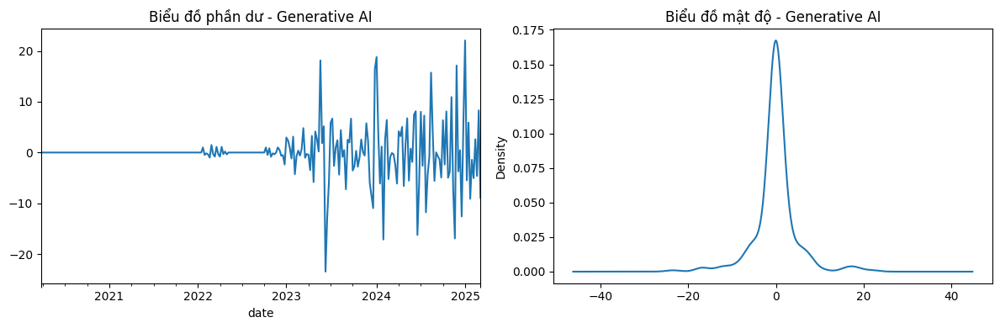


🔍 Đang xử lý từ khóa: CRISPR


/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)


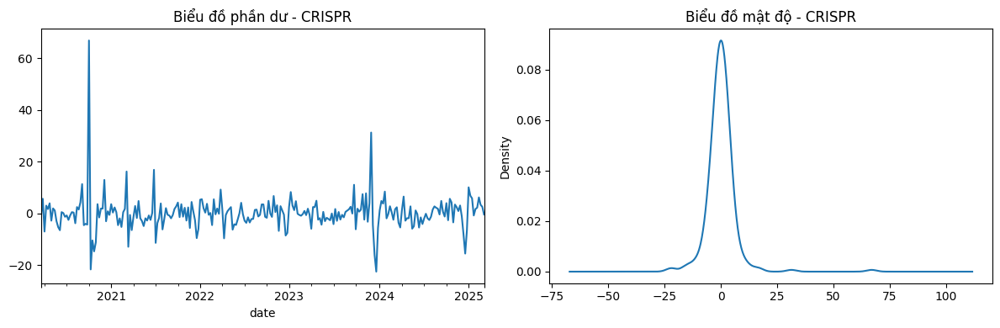


🔍 Đang xử lý từ khóa: Telemedicine


/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)


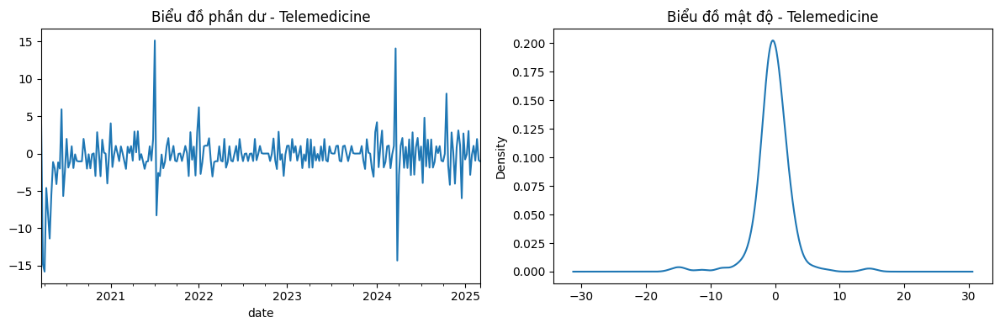


🔍 Đang xử lý từ khóa: Lab-grown Meat


/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)


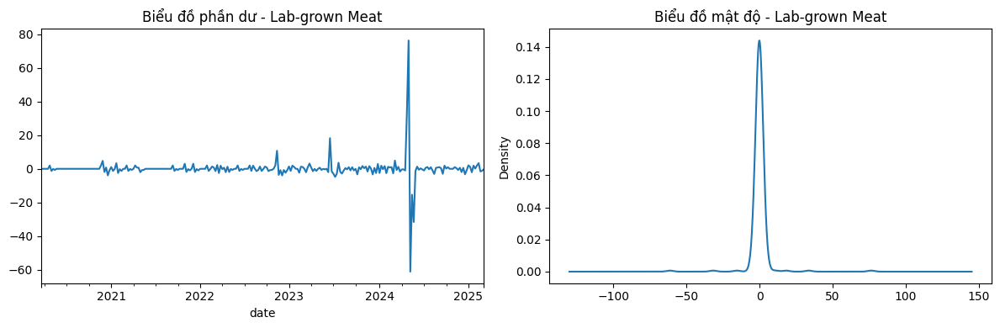


🔍 Đang xử lý từ khóa: Chatbots


/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)


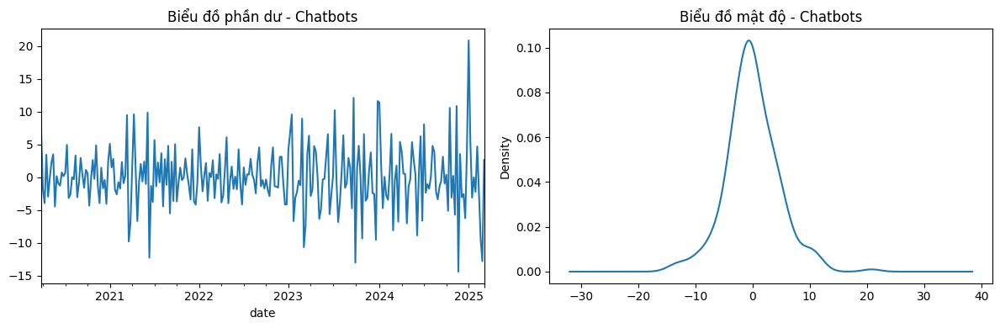


🔍 Đang xử lý từ khóa: Green cloud computing


/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)


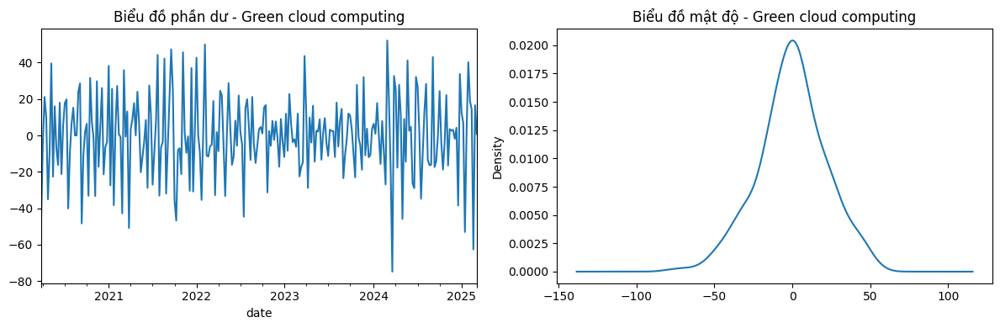


🔍 Đang xử lý từ khóa: Reusable Rockets


/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)


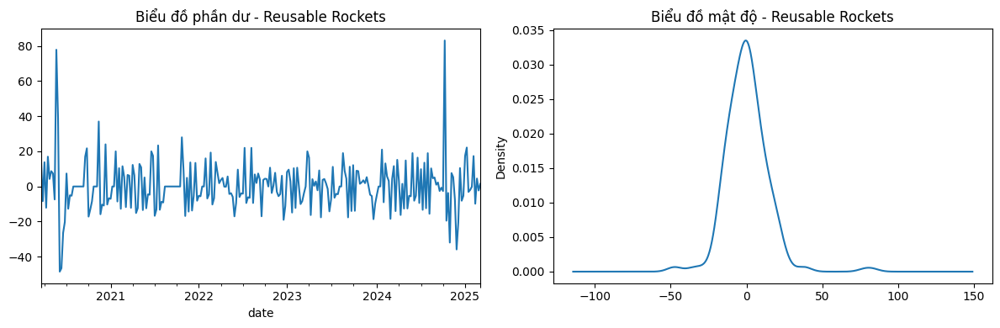


🔍 Đang xử lý từ khóa: Cloud computing platforms


/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)


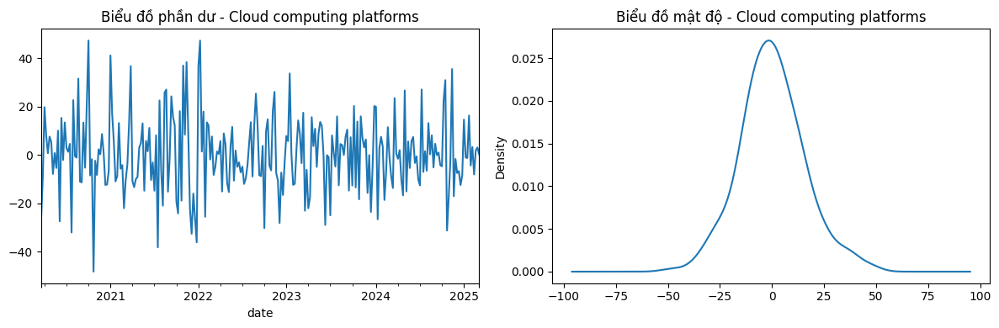


🔍 Đang xử lý từ khóa: Synthetic Data


/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)


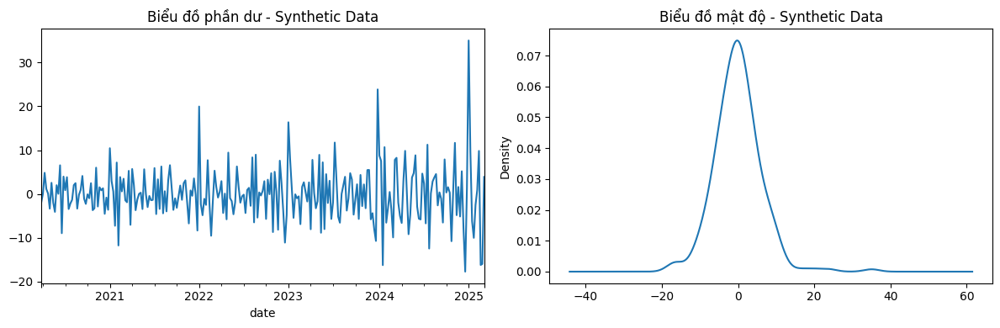


🔍 Đang xử lý từ khóa: Carbon Capture


/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)


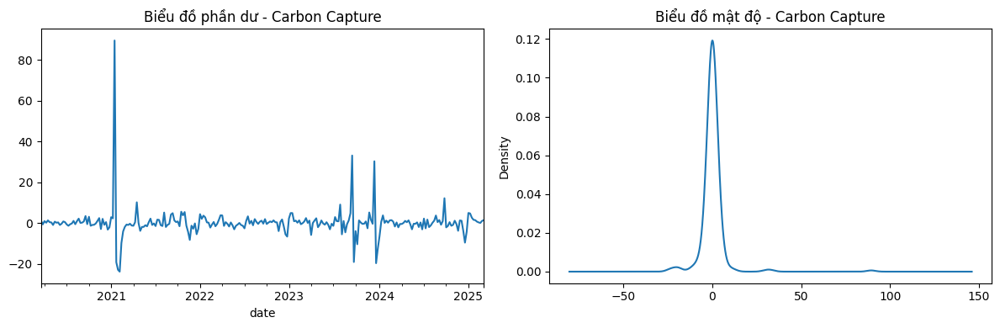


🔍 Đang xử lý từ khóa: IoT security and trust


/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)


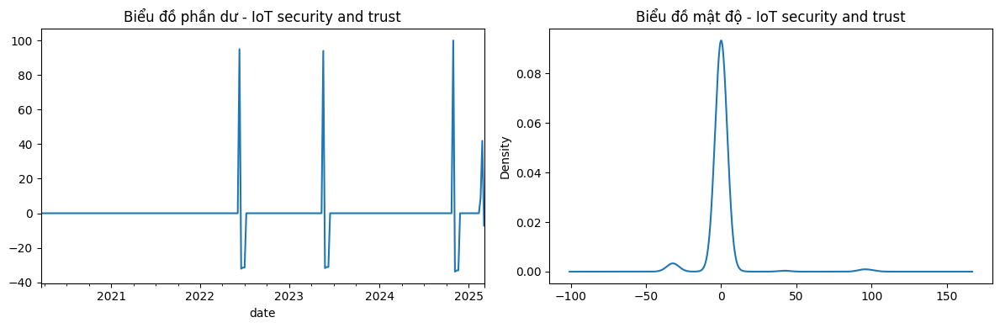


🔍 Đang xử lý từ khóa: LiDAR


/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)


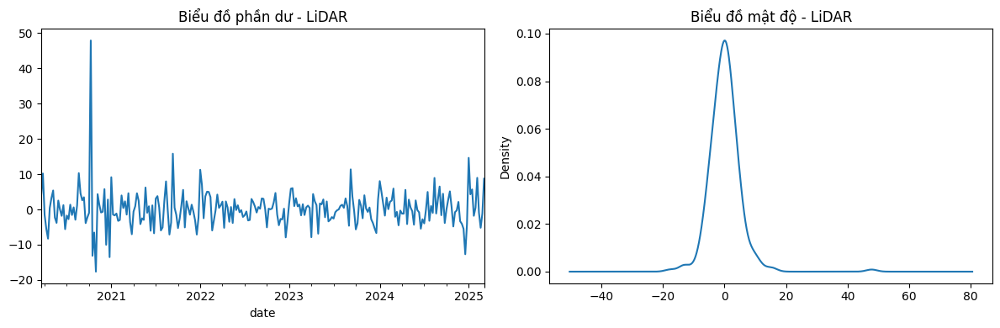


🔍 Đang xử lý từ khóa: NLP


/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)


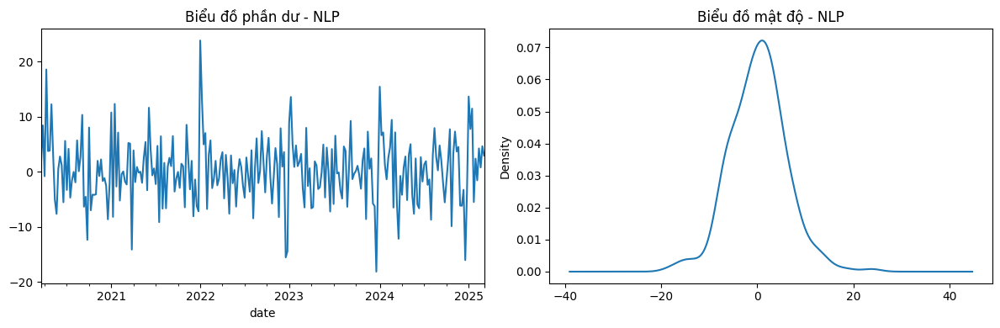


🔍 Đang xử lý từ khóa: Network Slicing


/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)


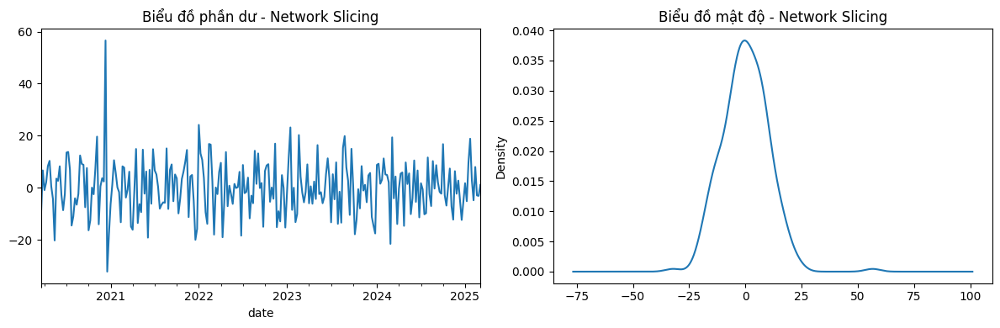


🔍 Đang xử lý từ khóa: Vertical Farming


/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)


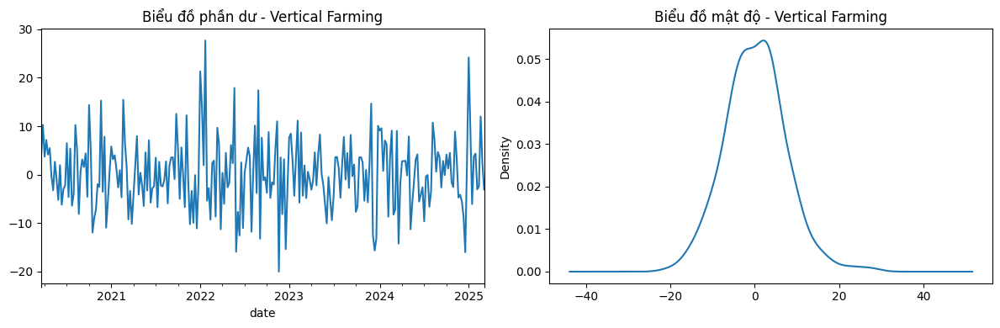


🔍 Đang xử lý từ khóa: V2X


/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)


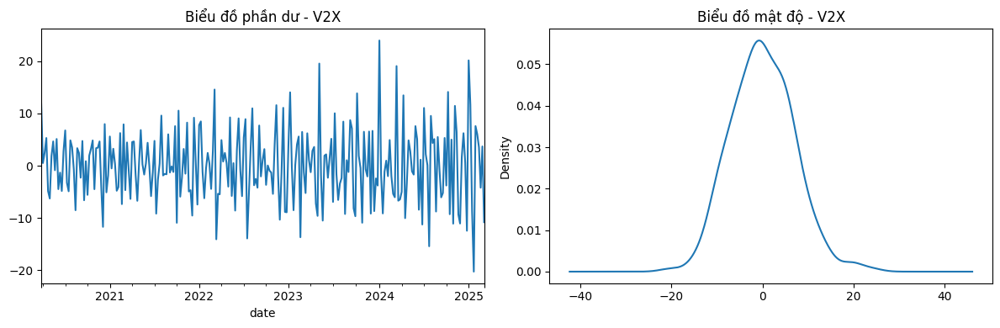


🔍 Đang xử lý từ khóa: Zero Trust


/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)


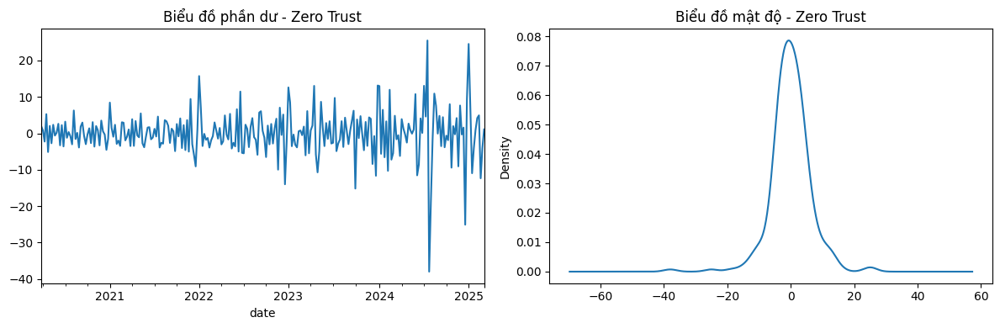


🔍 Đang xử lý từ khóa: Nano robotics


/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)


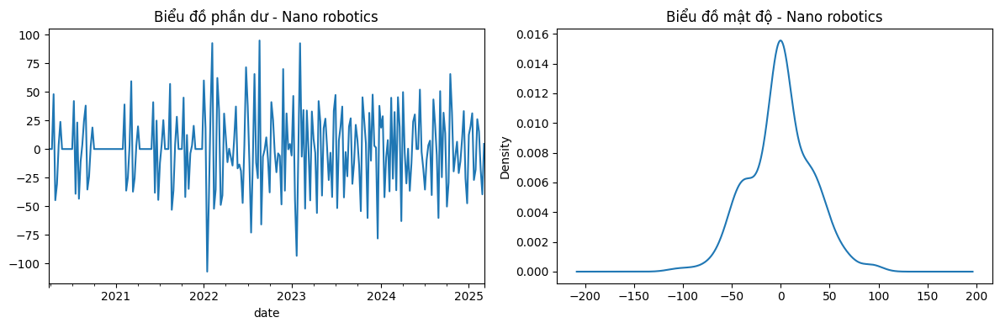


🔍 Đang xử lý từ khóa: Applied AI


/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)


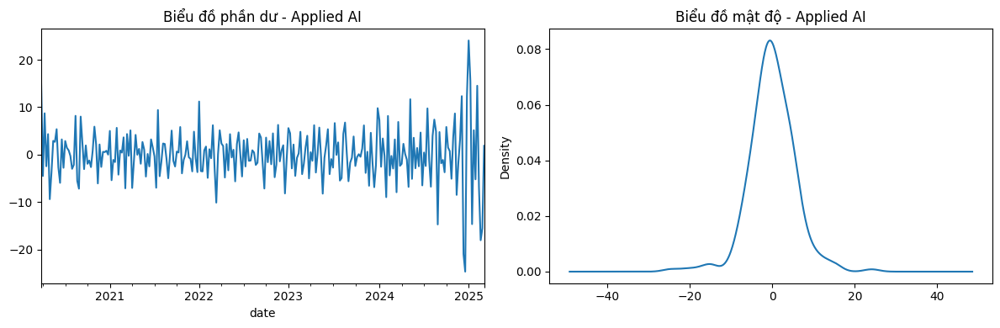


🔍 Đang xử lý từ khóa: Bioprinting


/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)


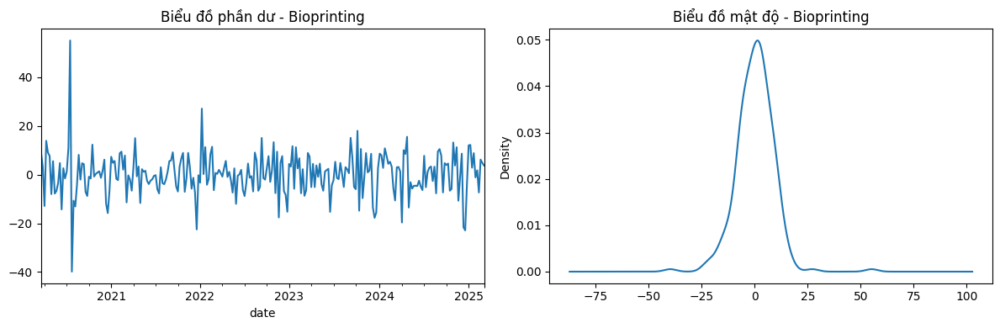


🔍 Đang xử lý từ khóa: NFT


/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)


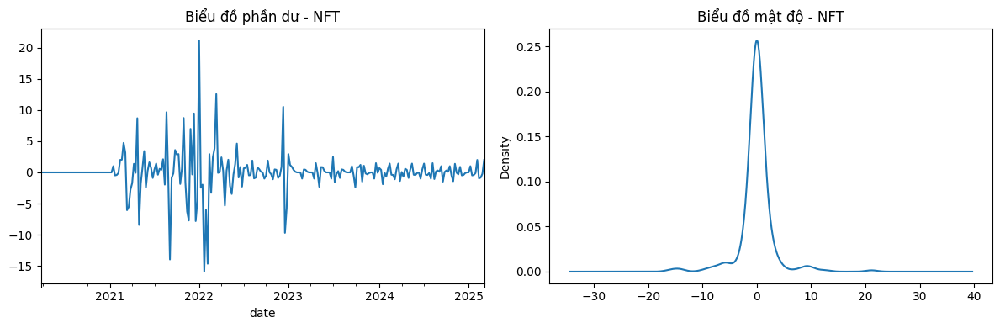


🔍 Đang xử lý từ khóa: Metaverse


/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)


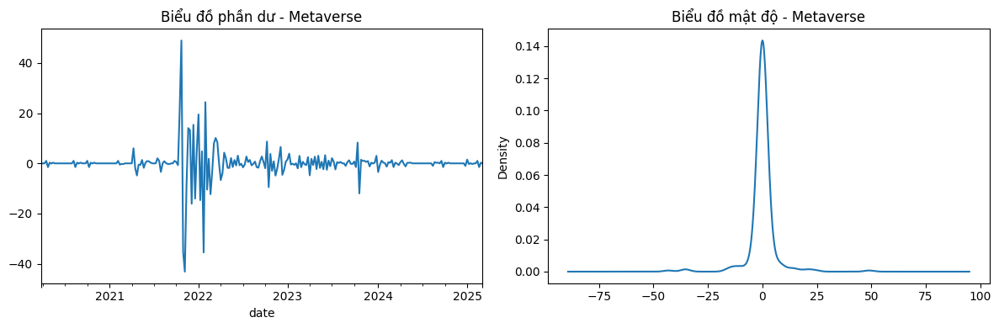


🔍 Đang xử lý từ khóa: Reinforcement Learning


/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)


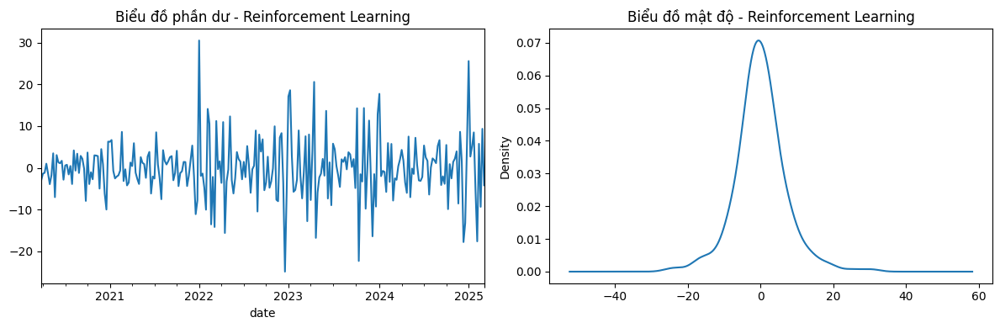


🔍 Đang xử lý từ khóa: AR Glasses


/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)


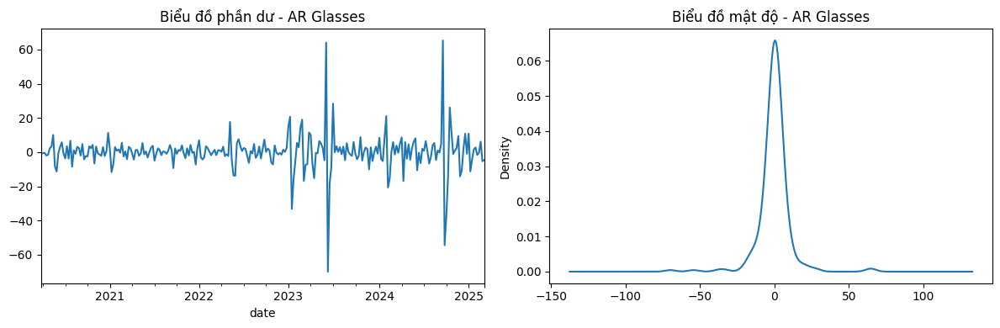

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.tsa.stattools import adfuller

# 🔍 Loại bỏ cột thời gian nếu có
if "date" in df.columns:
    df.set_index("date", inplace=True)

# 📊 Lặp qua từng từ khóa để kiểm tra phần dư
for keyword in df_cleaned['keyword'].unique():  # Iterate over unique keywords
    print(f"\n🔍 Đang xử lý từ khóa: {keyword}")

    # Kiểm định tính dừng bằng ADF Test using 'interest_over_time' column
    result = adfuller(df_cleaned[df_cleaned['keyword'] == keyword]['interest_over_time'].dropna())

    # Nếu chuỗi không dừng, lấy sai phân bậc 1
    if result[1] >= 0.05:
        df_train = df_cleaned[df_cleaned['keyword'] == keyword]['interest_over_time'].diff().dropna()
    else:
        df_train = df_cleaned[df_cleaned['keyword'] == keyword]['interest_over_time']

    # 📈 Huấn luyện mô hình ARIMA
    try:
        model = ARIMA(df_train, order=(2, 1, 0))  # Có thể điều chỉnh p,d,q
        model_fit = model.fit()

        # 📉 Tính phần dư
        residuals = model_fit.resid[1:]

        # 🎨 Vẽ biểu đồ phần dư và mật độ
        fig, ax = plt.subplots(1, 2, figsize=(12, 4))

        residuals.plot(title=f'Biểu đồ phần dư - {keyword}', ax=ax[0])
        residuals.plot(title=f'Biểu đồ mật độ - {keyword}', kind='kde', ax=ax[1])

        plt.tight_layout()
        plt.show()

    except Exception as e:
        print(f"❌ Lỗi khi xử lý {keyword}: {e}")

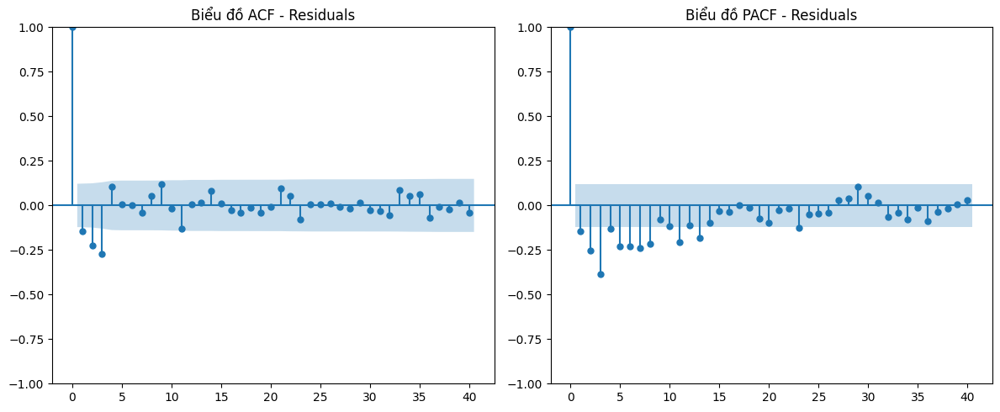

In [ ]:
import matplotlib.pyplot as plt
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

# Kiểm tra residuals từ mô hình ARIMA
residuals = model_fit.resid

# Vẽ biểu đồ ACF và PACF cho phần dư
fig, axes = plt.subplots(1, 2, figsize=(12, 5))

plot_acf(residuals, lags=40, ax=axes[0])
axes[0].set_title("Biểu đồ ACF - Residuals")

plot_pacf(residuals, lags=40, ax=axes[1])
axes[1].set_title("Biểu đồ PACF - Residuals")

plt.tight_layout()
plt.show()


/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)


Kết quả mô hình ARIMA cho từ khóa 'AI Security':
                               SARIMAX Results                                
Dep. Variable:     interest_over_time   No. Observations:                  208
Model:                 ARIMA(2, 1, 0)   Log Likelihood                -391.397
Date:                Fri, 14 Mar 2025   AIC                            788.795
Time:                        20:15:22   BIC                            798.793
Sample:                    03-15-2020   HQIC                           792.838
                         - 03-03-2024                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1       7.158e-06      0.047      0.000      1.000      -0.092       0.092
ar.L2         -0.1423      0.041     -3.507      0.000      -0.222      -0.063
sig

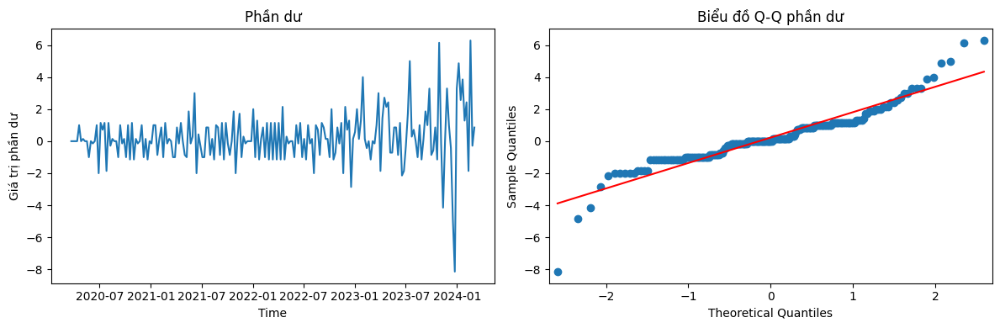

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)


Kết quả mô hình ARIMA cho từ khóa 'FDM':
                               SARIMAX Results                                
Dep. Variable:     interest_over_time   No. Observations:                  208
Model:                 ARIMA(2, 1, 0)   Log Likelihood                -632.199
Date:                Fri, 14 Mar 2025   AIC                           1270.398
Time:                        20:15:24   BIC                           1280.397
Sample:                    03-15-2020   HQIC                          1274.442
                         - 03-03-2024                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.4611      0.051     -9.032      0.000      -0.561      -0.361
ar.L2         -0.3057      0.069     -4.406      0.000      -0.442      -0.170
sigma2     

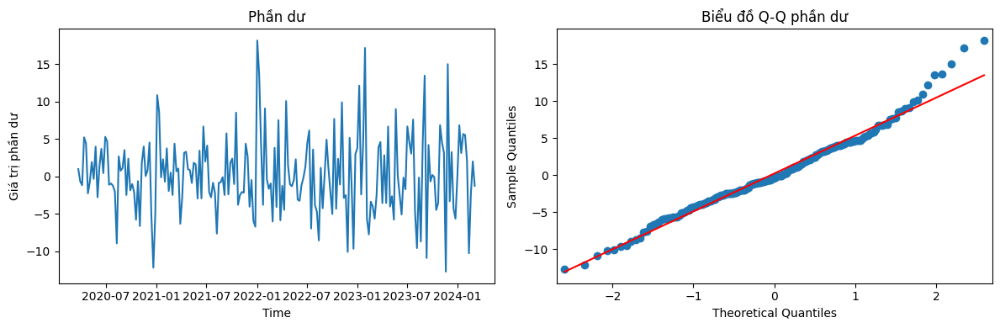

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)


Kết quả mô hình ARIMA cho từ khóa 'RPA Software':
                               SARIMAX Results                                
Dep. Variable:     interest_over_time   No. Observations:                  208
Model:                 ARIMA(2, 1, 0)   Log Likelihood                -773.356
Date:                Fri, 14 Mar 2025   AIC                           1552.712
Time:                        20:15:25   BIC                           1562.710
Sample:                    03-15-2020   HQIC                          1556.755
                         - 03-03-2024                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.5527      0.063     -8.794      0.000      -0.676      -0.430
ar.L2         -0.3485      0.066     -5.284      0.000      -0.478      -0.219
si

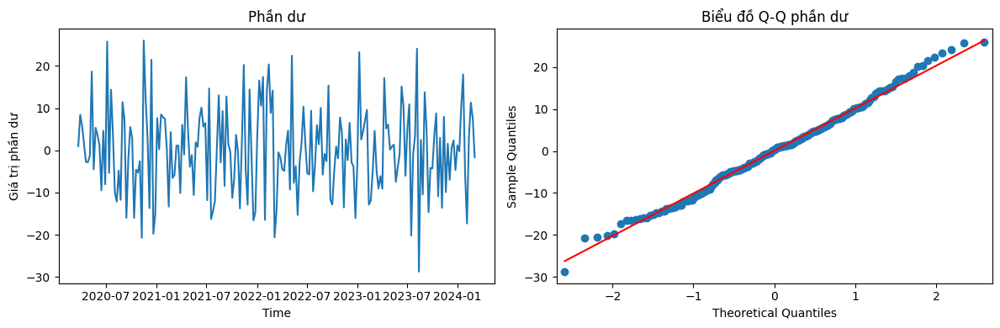

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)


Kết quả mô hình ARIMA cho từ khóa 'Distributed Cloud':
                               SARIMAX Results                                
Dep. Variable:     interest_over_time   No. Observations:                  208
Model:                 ARIMA(2, 1, 0)   Log Likelihood                -722.689
Date:                Fri, 14 Mar 2025   AIC                           1451.378
Time:                        20:15:26   BIC                           1461.376
Sample:                    03-15-2020   HQIC                          1455.421
                         - 03-03-2024                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.4813      0.060     -8.017      0.000      -0.599      -0.364
ar.L2         -0.2052      0.061     -3.372      0.001      -0.324      -0.0

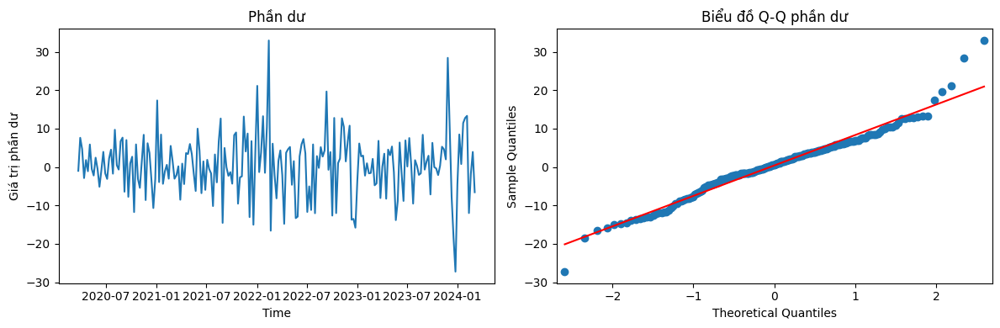

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)


Kết quả mô hình ARIMA cho từ khóa 'Smart Contracts':
                               SARIMAX Results                                
Dep. Variable:     interest_over_time   No. Observations:                  208
Model:                 ARIMA(2, 1, 0)   Log Likelihood                -722.415
Date:                Fri, 14 Mar 2025   AIC                           1450.830
Time:                        20:15:28   BIC                           1460.828
Sample:                    03-15-2020   HQIC                          1454.873
                         - 03-03-2024                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.1172      0.056     -2.110      0.035      -0.226      -0.008
ar.L2         -0.2392      0.046     -5.196      0.000      -0.329      -0.149

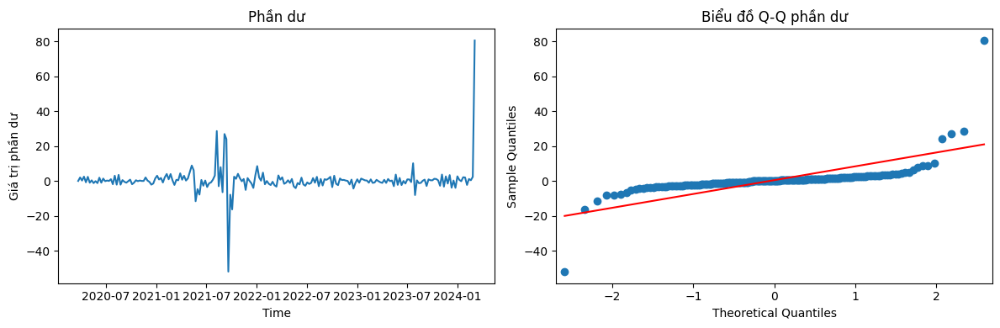

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)


Kết quả mô hình ARIMA cho từ khóa 'Smart Sensors':
                               SARIMAX Results                                
Dep. Variable:     interest_over_time   No. Observations:                  208
Model:                 ARIMA(2, 1, 0)   Log Likelihood                -684.581
Date:                Fri, 14 Mar 2025   AIC                           1375.162
Time:                        20:15:31   BIC                           1385.160
Sample:                    03-15-2020   HQIC                          1379.205
                         - 03-03-2024                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.3893      0.067     -5.834      0.000      -0.520      -0.259
ar.L2         -0.3009      0.067     -4.507      0.000      -0.432      -0.170
s

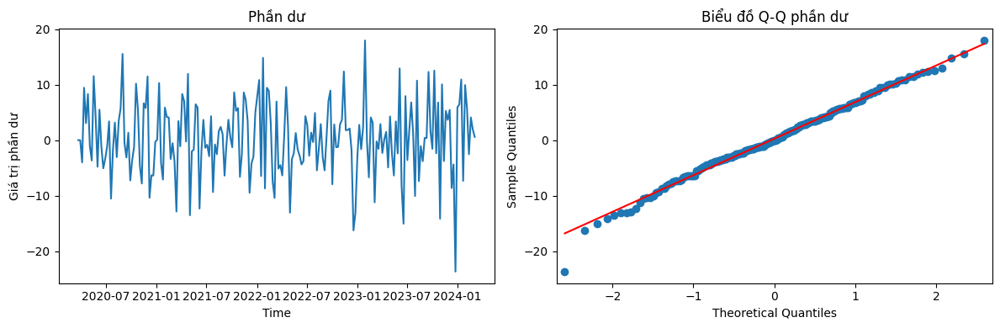

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)


Kết quả mô hình ARIMA cho từ khóa 'Cloud computing for IoT':
                               SARIMAX Results                                
Dep. Variable:     interest_over_time   No. Observations:                  208
Model:                 ARIMA(2, 1, 0)   Log Likelihood                -886.080
Date:                Fri, 14 Mar 2025   AIC                           1778.159
Time:                        20:15:33   BIC                           1788.157
Sample:                    03-15-2020   HQIC                          1782.202
                         - 03-03-2024                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.5782      0.048    -12.149      0.000      -0.672      -0.485
ar.L2         -0.2665      0.058     -4.582      0.000      -0.381    

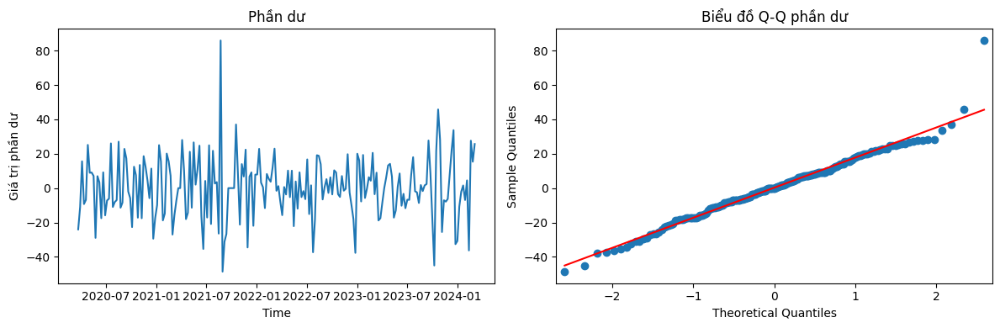

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)


Kết quả mô hình ARIMA cho từ khóa 'Quantum computing':
                               SARIMAX Results                                
Dep. Variable:     interest_over_time   No. Observations:                  208
Model:                 ARIMA(2, 1, 0)   Log Likelihood                -421.603
Date:                Fri, 14 Mar 2025   AIC                            849.207
Time:                        20:15:33   BIC                            859.205
Sample:                    03-15-2020   HQIC                           853.250
                         - 03-03-2024                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.3205      0.034     -9.484      0.000      -0.387      -0.254
ar.L2         -0.2776      0.040     -6.889      0.000      -0.357      -0.1

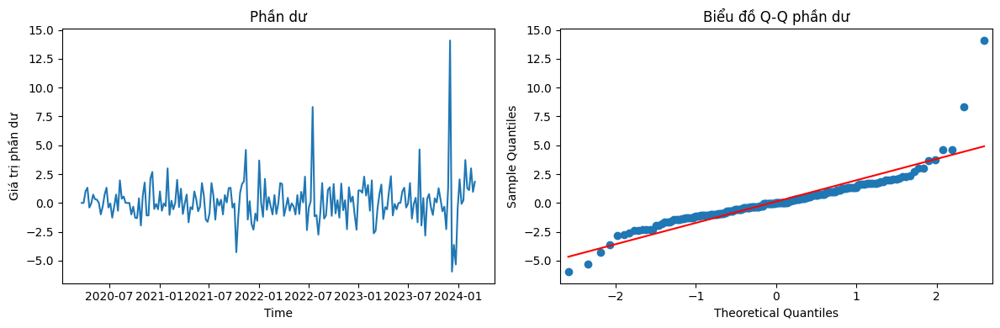

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)


Kết quả mô hình ARIMA cho từ khóa 'Green Hydrogen':
                               SARIMAX Results                                
Dep. Variable:     interest_over_time   No. Observations:                  208
Model:                 ARIMA(2, 1, 0)   Log Likelihood                -701.044
Date:                Fri, 14 Mar 2025   AIC                           1408.088
Time:                        20:15:35   BIC                           1418.086
Sample:                    03-15-2020   HQIC                          1412.131
                         - 03-03-2024                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.2861      0.071     -4.003      0.000      -0.426      -0.146
ar.L2         -0.3296      0.089     -3.683      0.000      -0.505      -0.154


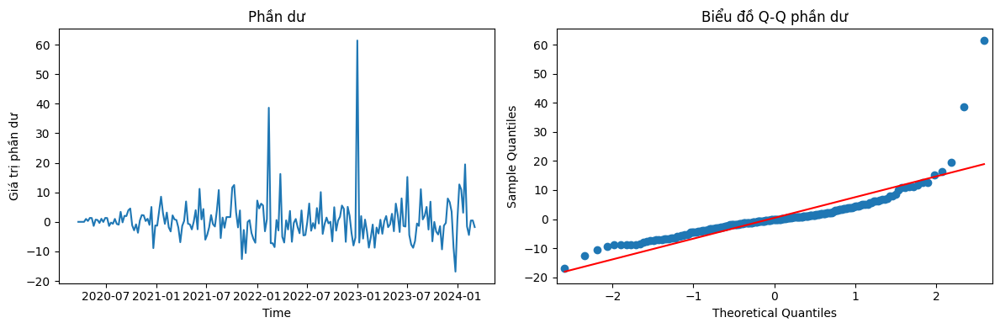

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)


Kết quả mô hình ARIMA cho từ khóa 'Public Cloud':
                               SARIMAX Results                                
Dep. Variable:     interest_over_time   No. Observations:                  208
Model:                 ARIMA(2, 1, 0)   Log Likelihood                -589.675
Date:                Fri, 14 Mar 2025   AIC                           1185.350
Time:                        20:15:36   BIC                           1195.348
Sample:                    03-15-2020   HQIC                          1189.393
                         - 03-03-2024                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.2707      0.059     -4.609      0.000      -0.386      -0.156
ar.L2         -0.2991      0.054     -5.492      0.000      -0.406      -0.192
si

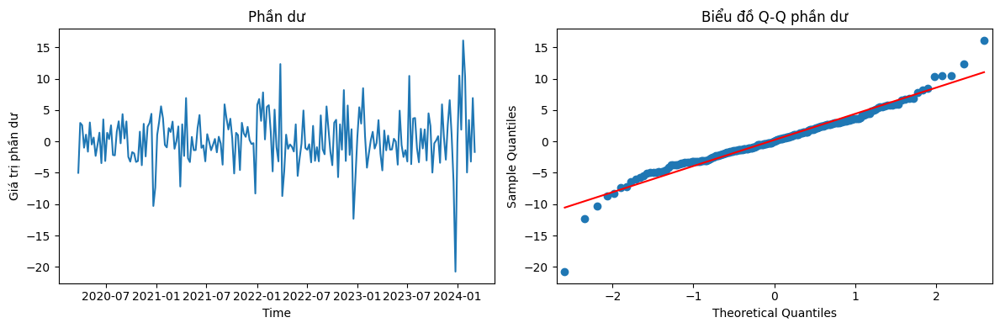

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)


Kết quả mô hình ARIMA cho từ khóa 'Industrial Robots':
                               SARIMAX Results                                
Dep. Variable:     interest_over_time   No. Observations:                  208
Model:                 ARIMA(2, 1, 0)   Log Likelihood                -773.514
Date:                Fri, 14 Mar 2025   AIC                           1553.028
Time:                        20:15:37   BIC                           1563.027
Sample:                    03-15-2020   HQIC                          1557.072
                         - 03-03-2024                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.3720      0.066     -5.597      0.000      -0.502      -0.242
ar.L2         -0.1538      0.065     -2.374      0.018      -0.281      -0.0

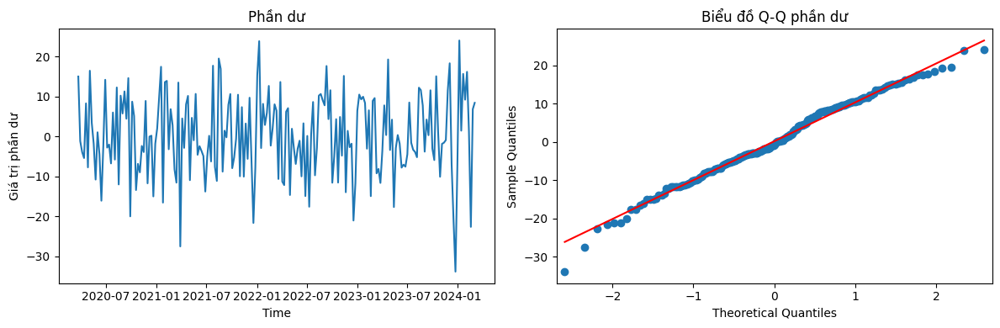

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)


Kết quả mô hình ARIMA cho từ khóa 'Smart grid and IoT':
                               SARIMAX Results                                
Dep. Variable:     interest_over_time   No. Observations:                  208
Model:                 ARIMA(2, 1, 0)   Log Likelihood                -940.702
Date:                Fri, 14 Mar 2025   AIC                           1887.404
Time:                        20:15:37   BIC                           1897.403
Sample:                    03-15-2020   HQIC                          1891.448
                         - 03-03-2024                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.6478      0.051    -12.819      0.000      -0.747      -0.549
ar.L2         -0.1918      0.060     -3.181      0.001      -0.310      -0.

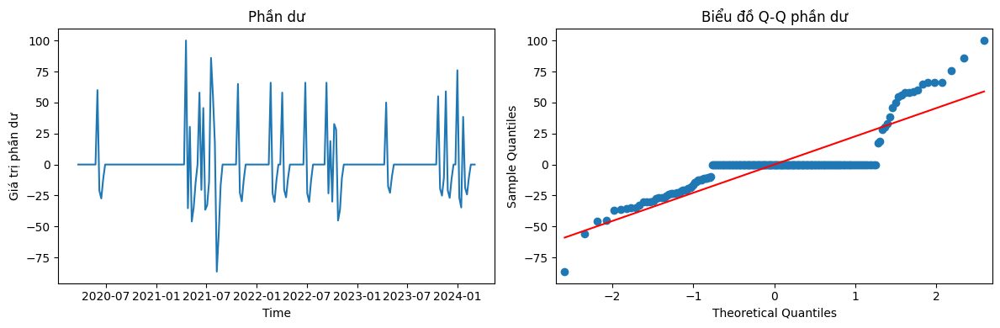

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)


Kết quả mô hình ARIMA cho từ khóa 'VR Headsets':
                               SARIMAX Results                                
Dep. Variable:     interest_over_time   No. Observations:                  208
Model:                 ARIMA(2, 1, 0)   Log Likelihood                -650.233
Date:                Fri, 14 Mar 2025   AIC                           1306.466
Time:                        20:15:38   BIC                           1316.464
Sample:                    03-15-2020   HQIC                          1310.509
                         - 03-03-2024                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.2518      0.049     -5.114      0.000      -0.348      -0.155
ar.L2         -0.1522      0.065     -2.344      0.019      -0.279      -0.025
sig

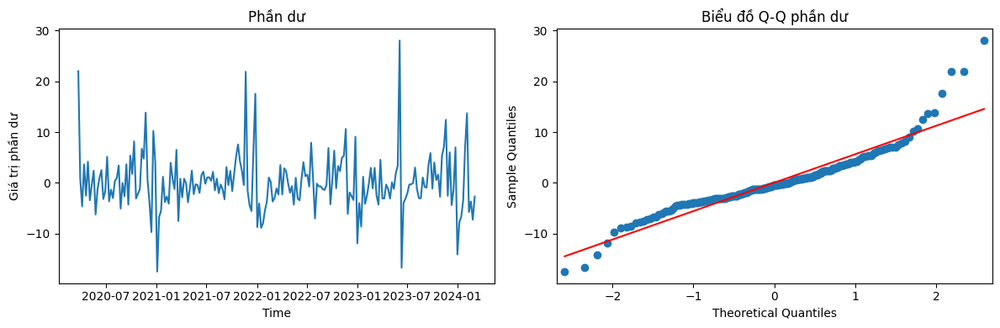

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)


Kết quả mô hình ARIMA cho từ khóa 'Quantum Cryptography':
                               SARIMAX Results                                
Dep. Variable:     interest_over_time   No. Observations:                  208
Model:                 ARIMA(2, 1, 0)   Log Likelihood                -624.544
Date:                Fri, 14 Mar 2025   AIC                           1255.088
Time:                        20:15:38   BIC                           1265.086
Sample:                    03-15-2020   HQIC                          1259.131
                         - 03-03-2024                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.5453      0.072     -7.593      0.000      -0.686      -0.405
ar.L2         -0.1954      0.063     -3.112      0.002      -0.319      -

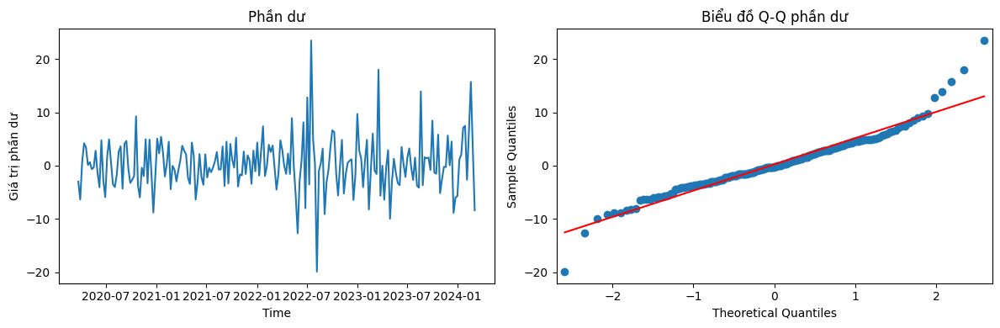

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)


Kết quả mô hình ARIMA cho từ khóa 'Augmented reality':
                               SARIMAX Results                                
Dep. Variable:     interest_over_time   No. Observations:                  208
Model:                 ARIMA(2, 1, 0)   Log Likelihood                -671.525
Date:                Fri, 14 Mar 2025   AIC                           1349.049
Time:                        20:15:39   BIC                           1359.047
Sample:                    03-15-2020   HQIC                          1353.092
                         - 03-03-2024                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.2666      0.053     -5.040      0.000      -0.370      -0.163
ar.L2         -0.2915      0.048     -6.037      0.000      -0.386      -0.1

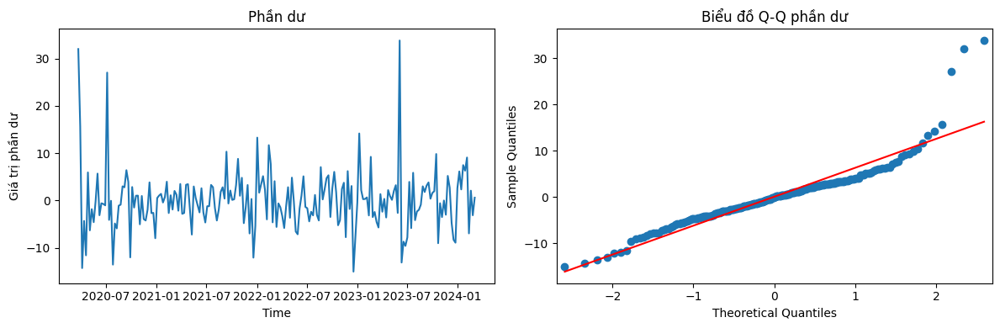

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)


Kết quả mô hình ARIMA cho từ khóa 'Small Satellites':
                               SARIMAX Results                                
Dep. Variable:     interest_over_time   No. Observations:                  208
Model:                 ARIMA(2, 1, 0)   Log Likelihood                -787.795
Date:                Fri, 14 Mar 2025   AIC                           1581.590
Time:                        20:15:40   BIC                           1591.588
Sample:                    03-15-2020   HQIC                          1585.633
                         - 03-03-2024                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.5245      0.059     -8.964      0.000      -0.639      -0.410
ar.L2         -0.2863      0.061     -4.726      0.000      -0.405      -0.16

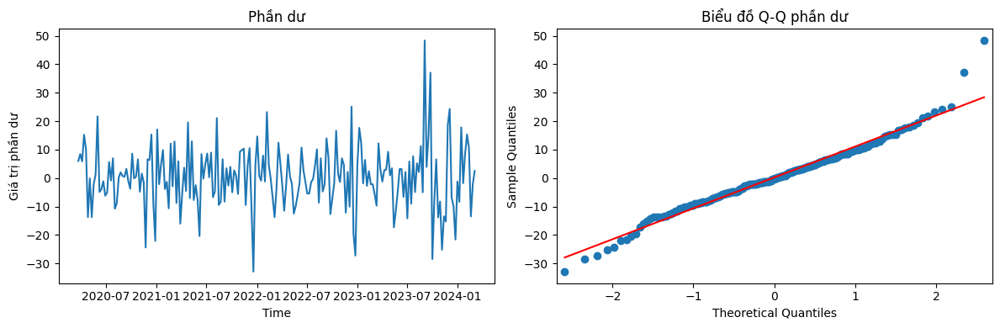

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)


Kết quả mô hình ARIMA cho từ khóa 'Computer vision':
                               SARIMAX Results                                
Dep. Variable:     interest_over_time   No. Observations:                  208
Model:                 ARIMA(2, 1, 0)   Log Likelihood                -619.034
Date:                Fri, 14 Mar 2025   AIC                           1244.068
Time:                        20:15:40   BIC                           1254.066
Sample:                    03-15-2020   HQIC                          1248.111
                         - 03-03-2024                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.2782      0.049     -5.716      0.000      -0.374      -0.183
ar.L2         -0.1872      0.056     -3.325      0.001      -0.298      -0.077

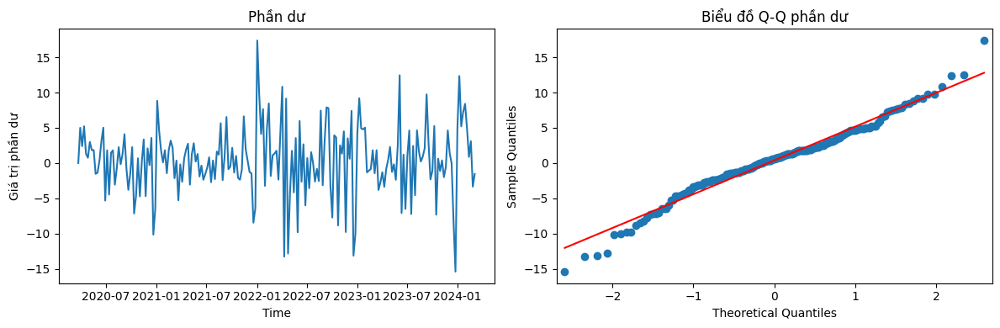

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)


Kết quả mô hình ARIMA cho từ khóa 'Cashless Payment':
                               SARIMAX Results                                
Dep. Variable:     interest_over_time   No. Observations:                  208
Model:                 ARIMA(2, 1, 0)   Log Likelihood                -726.079
Date:                Fri, 14 Mar 2025   AIC                           1458.158
Time:                        20:15:41   BIC                           1468.156
Sample:                    03-15-2020   HQIC                          1462.201
                         - 03-03-2024                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.4499      0.040    -11.242      0.000      -0.528      -0.371
ar.L2         -0.3184      0.047     -6.753      0.000      -0.411      -0.22

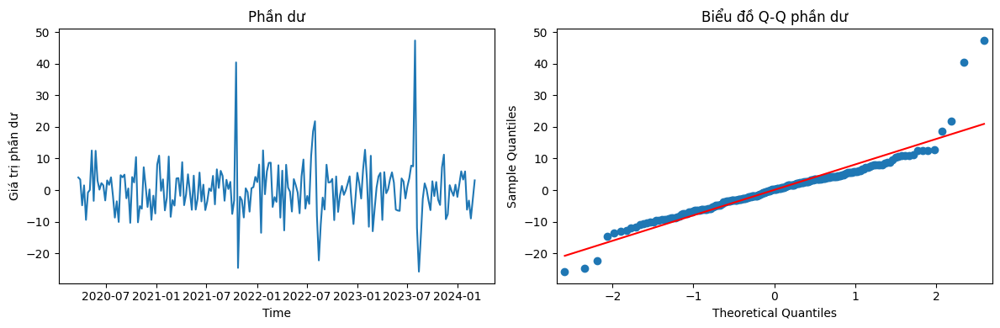

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)


Kết quả mô hình ARIMA cho từ khóa 'Edge AI':
                               SARIMAX Results                                
Dep. Variable:     interest_over_time   No. Observations:                  208
Model:                 ARIMA(2, 1, 0)   Log Likelihood                -501.115
Date:                Fri, 14 Mar 2025   AIC                           1008.229
Time:                        20:15:42   BIC                           1018.227
Sample:                    03-15-2020   HQIC                          1012.272
                         - 03-03-2024                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.1823      0.069     -2.642      0.008      -0.318      -0.047
ar.L2         -0.1856      0.055     -3.402      0.001      -0.293      -0.079
sigma2 

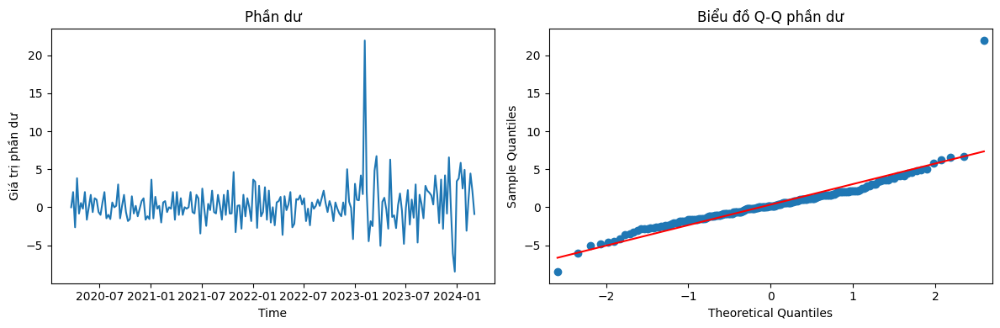

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)


Kết quả mô hình ARIMA cho từ khóa 'Adaptive learning':
                               SARIMAX Results                                
Dep. Variable:     interest_over_time   No. Observations:                  208
Model:                 ARIMA(2, 1, 0)   Log Likelihood                -647.599
Date:                Fri, 14 Mar 2025   AIC                           1301.197
Time:                        20:15:42   BIC                           1311.195
Sample:                    03-15-2020   HQIC                          1305.240
                         - 03-03-2024                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.2591      0.058     -4.431      0.000      -0.374      -0.144
ar.L2         -0.2161      0.074     -2.911      0.004      -0.362      -0.0

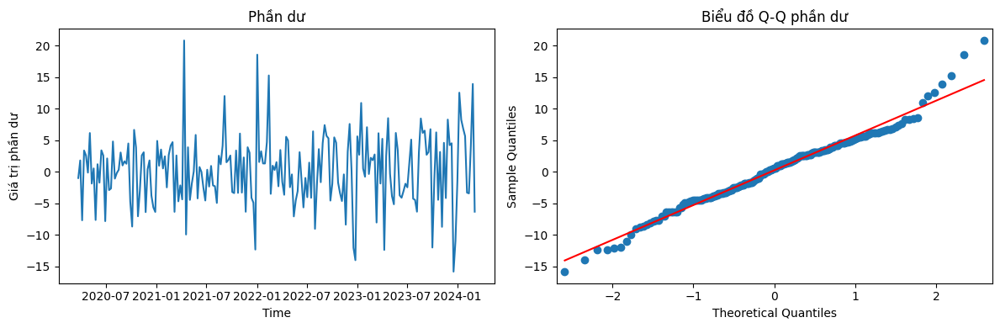

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)


Kết quả mô hình ARIMA cho từ khóa 'Virtual reality technology':
                               SARIMAX Results                                
Dep. Variable:     interest_over_time   No. Observations:                  208
Model:                 ARIMA(2, 1, 0)   Log Likelihood                -678.100
Date:                Fri, 14 Mar 2025   AIC                           1362.199
Time:                        20:15:43   BIC                           1372.197
Sample:                    03-15-2020   HQIC                          1366.242
                         - 03-03-2024                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.1318      0.056     -2.375      0.018      -0.241      -0.023
ar.L2         -0.1401      0.076     -1.836      0.066      -0.290 

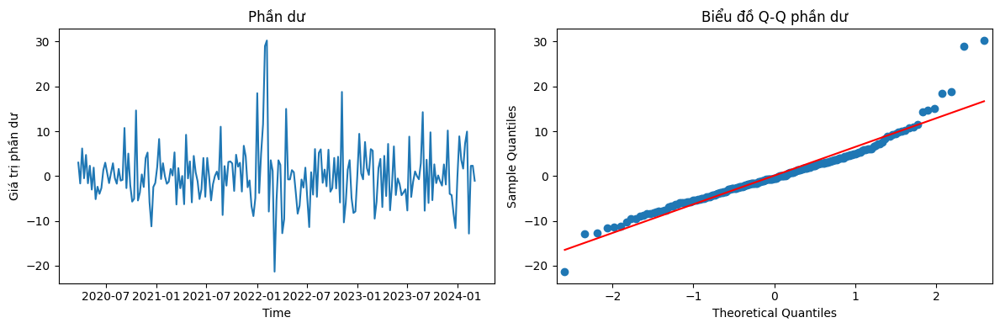

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)


Kết quả mô hình ARIMA cho từ khóa 'Super Apps':
                               SARIMAX Results                                
Dep. Variable:     interest_over_time   No. Observations:                  208
Model:                 ARIMA(2, 1, 0)   Log Likelihood                -743.881
Date:                Fri, 14 Mar 2025   AIC                           1493.762
Time:                        20:15:44   BIC                           1503.760
Sample:                    03-15-2020   HQIC                          1497.805
                         - 03-03-2024                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.3609      0.024    -15.215      0.000      -0.407      -0.314
ar.L2         -0.2558      0.035     -7.366      0.000      -0.324      -0.188
sigm

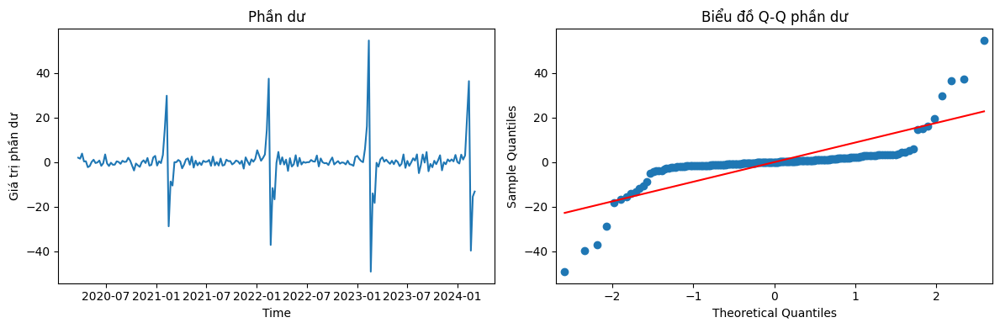

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)


Kết quả mô hình ARIMA cho từ khóa 'Qubits':
                               SARIMAX Results                                
Dep. Variable:     interest_over_time   No. Observations:                  208
Model:                 ARIMA(2, 1, 0)   Log Likelihood                -513.718
Date:                Fri, 14 Mar 2025   AIC                           1033.435
Time:                        20:15:44   BIC                           1043.433
Sample:                    03-15-2020   HQIC                          1037.478
                         - 03-03-2024                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.5473      0.052    -10.491      0.000      -0.650      -0.445
ar.L2         -0.3001      0.056     -5.372      0.000      -0.410      -0.191
sigma2  

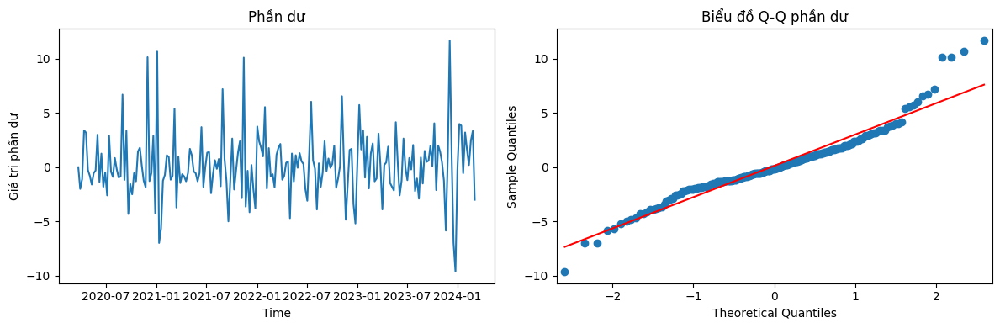

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/stattools.py:1431: RuntimeWarning: divide by zero encountered in divide
  test_statistic = numer_squared_sum / denom_squared_sum


Kết quả mô hình ARIMA cho từ khóa 'Generative AI':
                               SARIMAX Results                                
Dep. Variable:     interest_over_time   No. Observations:                  208
Model:                 ARIMA(2, 1, 0)   Log Likelihood                -532.118
Date:                Fri, 14 Mar 2025   AIC                           1070.236
Time:                        20:15:45   BIC                           1080.234
Sample:                    03-15-2020   HQIC                          1074.279
                         - 03-03-2024                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.3644      0.030     12.160      0.000       0.306       0.423
ar.L2         -0.0948      0.028     -3.362      0.001      -0.150      -0.040
s

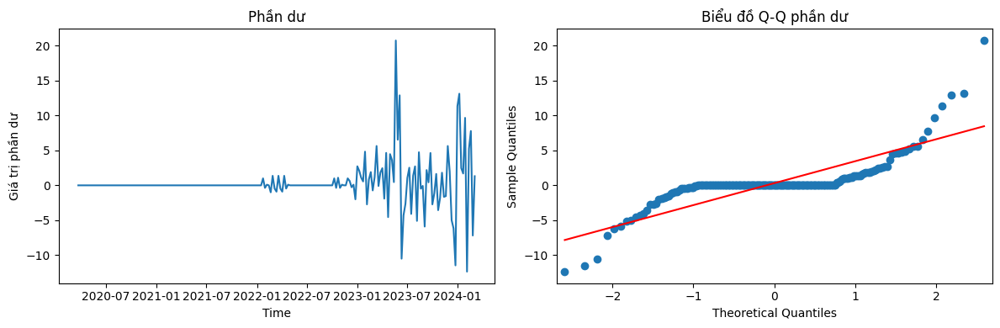

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)


Kết quả mô hình ARIMA cho từ khóa 'CRISPR':
                               SARIMAX Results                                
Dep. Variable:     interest_over_time   No. Observations:                  208
Model:                 ARIMA(2, 1, 0)   Log Likelihood                -701.957
Date:                Fri, 14 Mar 2025   AIC                           1409.914
Time:                        20:15:45   BIC                           1419.912
Sample:                    03-15-2020   HQIC                          1413.957
                         - 03-03-2024                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.4095      0.034    -12.188      0.000      -0.475      -0.344
ar.L2         -0.2464      0.041     -6.034      0.000      -0.326      -0.166
sigma2  

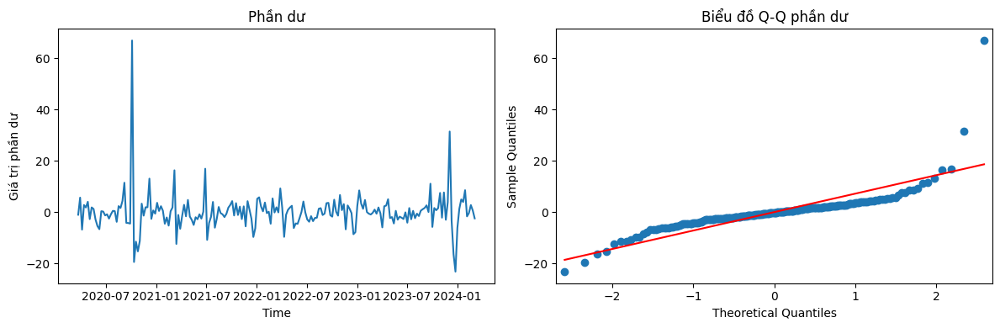

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)


Kết quả mô hình ARIMA cho từ khóa 'Telemedicine':
                               SARIMAX Results                                
Dep. Variable:     interest_over_time   No. Observations:                  208
Model:                 ARIMA(2, 1, 0)   Log Likelihood                -500.483
Date:                Fri, 14 Mar 2025   AIC                           1006.965
Time:                        20:15:46   BIC                           1016.964
Sample:                    03-15-2020   HQIC                          1011.009
                         - 03-03-2024                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.1182      0.025      4.650      0.000       0.068       0.168
ar.L2          0.0598      0.053      1.127      0.260      -0.044       0.164
si

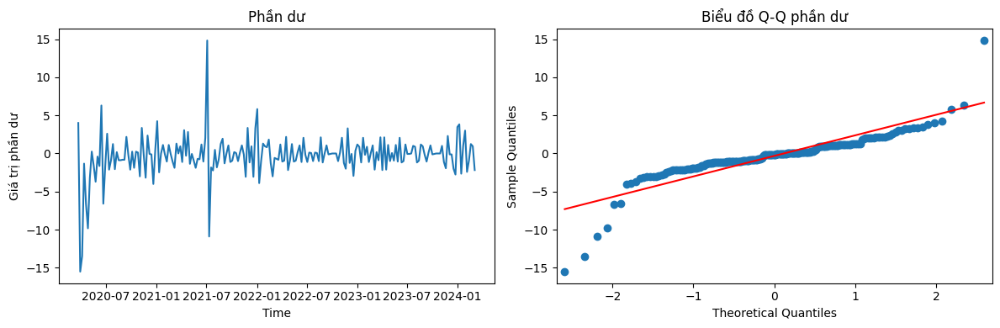

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)


Kết quả mô hình ARIMA cho từ khóa 'Lab-grown Meat':
                               SARIMAX Results                                
Dep. Variable:     interest_over_time   No. Observations:                  208
Model:                 ARIMA(2, 1, 0)   Log Likelihood                -440.068
Date:                Fri, 14 Mar 2025   AIC                            886.136
Time:                        20:15:47   BIC                            896.134
Sample:                    03-15-2020   HQIC                           890.179
                         - 03-03-2024                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.4665      0.059     -7.957      0.000      -0.581      -0.352
ar.L2         -0.2899      0.041     -7.063      0.000      -0.370      -0.209


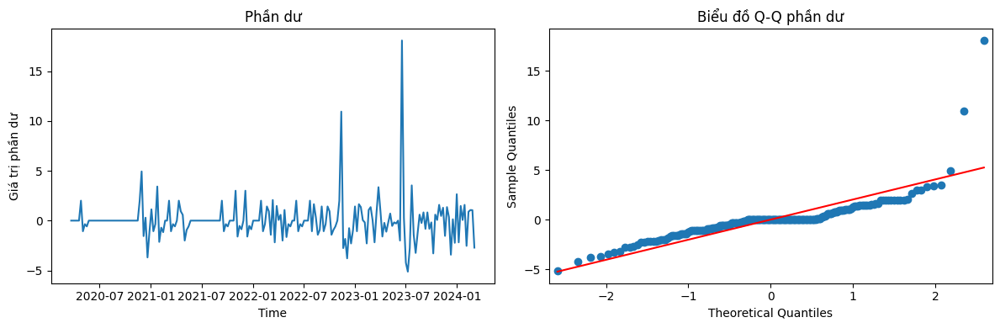

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)


Kết quả mô hình ARIMA cho từ khóa 'Chatbots':
                               SARIMAX Results                                
Dep. Variable:     interest_over_time   No. Observations:                  208
Model:                 ARIMA(2, 1, 0)   Log Likelihood                -543.720
Date:                Fri, 14 Mar 2025   AIC                           1093.439
Time:                        20:15:47   BIC                           1103.437
Sample:                    03-15-2020   HQIC                          1097.482
                         - 03-03-2024                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.3866      0.054     -7.211      0.000      -0.492      -0.282
ar.L2         -0.2416      0.060     -4.011      0.000      -0.360      -0.124
sigma2

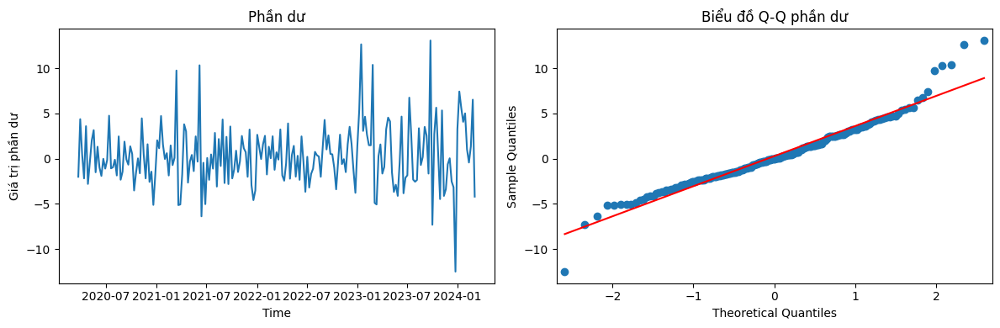

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)


Kết quả mô hình ARIMA cho từ khóa 'Green cloud computing':
                               SARIMAX Results                                
Dep. Variable:     interest_over_time   No. Observations:                  208
Model:                 ARIMA(2, 1, 0)   Log Likelihood                -862.632
Date:                Fri, 14 Mar 2025   AIC                           1731.264
Time:                        20:15:48   BIC                           1741.262
Sample:                    03-15-2020   HQIC                          1735.307
                         - 03-03-2024                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.4959      0.060     -8.221      0.000      -0.614      -0.378
ar.L2         -0.3081      0.066     -4.636      0.000      -0.438      

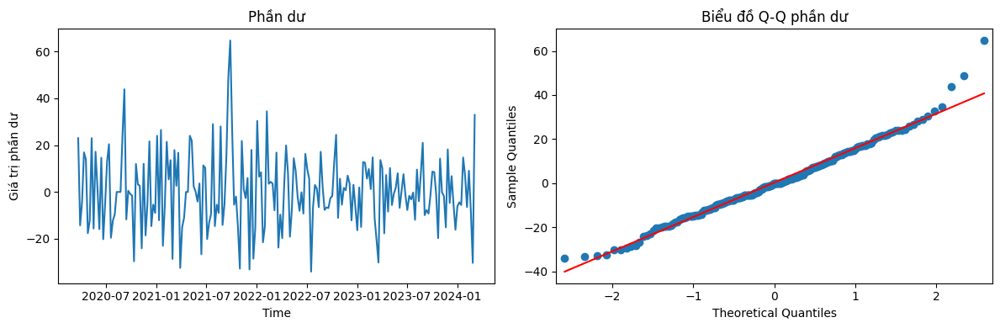

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)


Kết quả mô hình ARIMA cho từ khóa 'Reusable Rockets':
                               SARIMAX Results                                
Dep. Variable:     interest_over_time   No. Observations:                  208
Model:                 ARIMA(2, 1, 0)   Log Likelihood                -825.142
Date:                Fri, 14 Mar 2025   AIC                           1656.284
Time:                        20:15:49   BIC                           1666.282
Sample:                    03-15-2020   HQIC                          1660.327
                         - 03-03-2024                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.5105      0.037    -13.750      0.000      -0.583      -0.438
ar.L2         -0.3267      0.036     -8.974      0.000      -0.398      -0.25

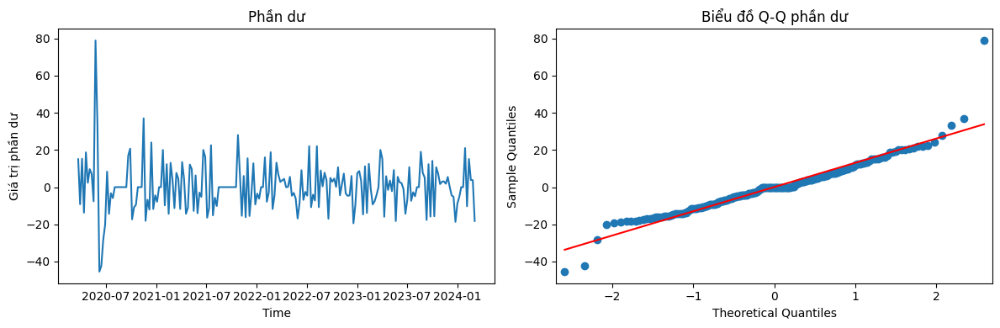

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)


Kết quả mô hình ARIMA cho từ khóa 'Cloud computing platforms':
                               SARIMAX Results                                
Dep. Variable:     interest_over_time   No. Observations:                  208
Model:                 ARIMA(2, 1, 0)   Log Likelihood                -868.731
Date:                Fri, 14 Mar 2025   AIC                           1743.462
Time:                        20:15:50   BIC                           1753.460
Sample:                    03-15-2020   HQIC                          1747.505
                         - 03-03-2024                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.4031      0.062     -6.450      0.000      -0.526      -0.281
ar.L2         -0.2022      0.065     -3.111      0.002      -0.330  

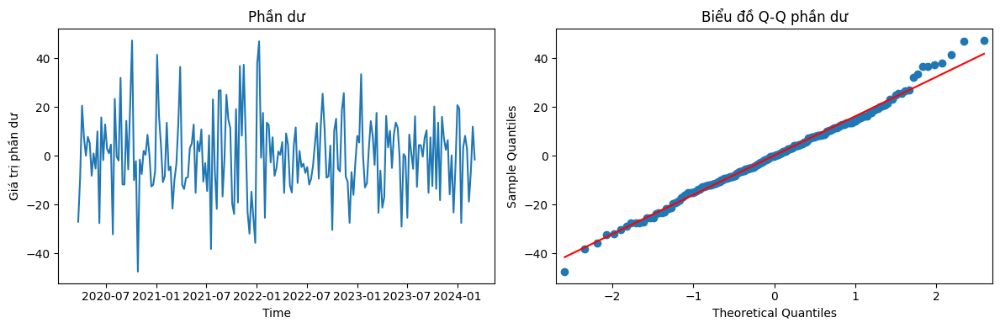

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)


Kết quả mô hình ARIMA cho từ khóa 'Synthetic Data':
                               SARIMAX Results                                
Dep. Variable:     interest_over_time   No. Observations:                  208
Model:                 ARIMA(2, 1, 0)   Log Likelihood                -589.857
Date:                Fri, 14 Mar 2025   AIC                           1185.714
Time:                        20:15:51   BIC                           1195.712
Sample:                    03-15-2020   HQIC                          1189.757
                         - 03-03-2024                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.3691      0.045     -8.226      0.000      -0.457      -0.281
ar.L2         -0.2076      0.051     -4.081      0.000      -0.307      -0.108


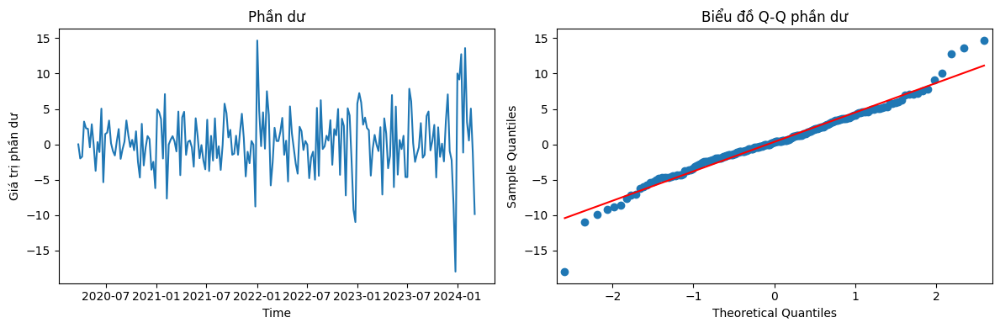

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)


Kết quả mô hình ARIMA cho từ khóa 'Carbon Capture':
                               SARIMAX Results                                
Dep. Variable:     interest_over_time   No. Observations:                  208
Model:                 ARIMA(2, 1, 0)   Log Likelihood                -728.421
Date:                Fri, 14 Mar 2025   AIC                           1462.842
Time:                        20:15:52   BIC                           1472.840
Sample:                    03-15-2020   HQIC                          1466.885
                         - 03-03-2024                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.3860      0.030    -12.985      0.000      -0.444      -0.328
ar.L2         -0.2632      0.028     -9.397      0.000      -0.318      -0.208


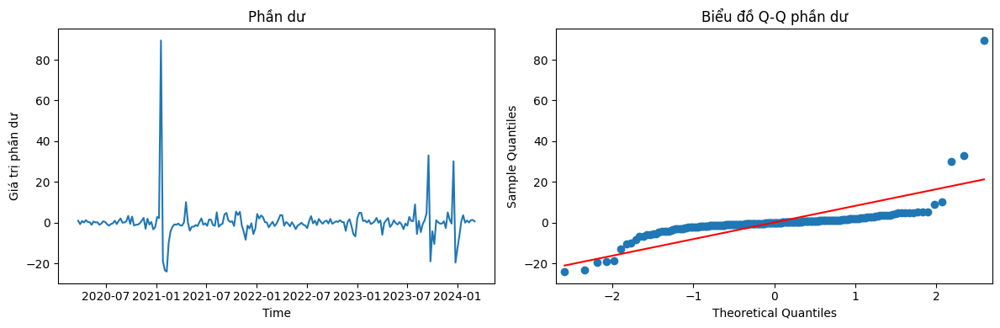

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/stattools.py:1431: RuntimeWarning: divide by zero encountered in divide
  test_statistic = numer_squared_sum / denom_squared_sum


Kết quả mô hình ARIMA cho từ khóa 'IoT security and trust':
                               SARIMAX Results                                
Dep. Variable:     interest_over_time   No. Observations:                  208
Model:                 ARIMA(2, 1, 0)   Log Likelihood                -785.123
Date:                Fri, 14 Mar 2025   AIC                           1576.246
Time:                        20:15:52   BIC                           1586.244
Sample:                    03-15-2020   HQIC                          1580.289
                         - 03-03-2024                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.6635      0.022    -29.882      0.000      -0.707      -0.620
ar.L2         -0.3301      0.022    -14.727      0.000      -0.374     

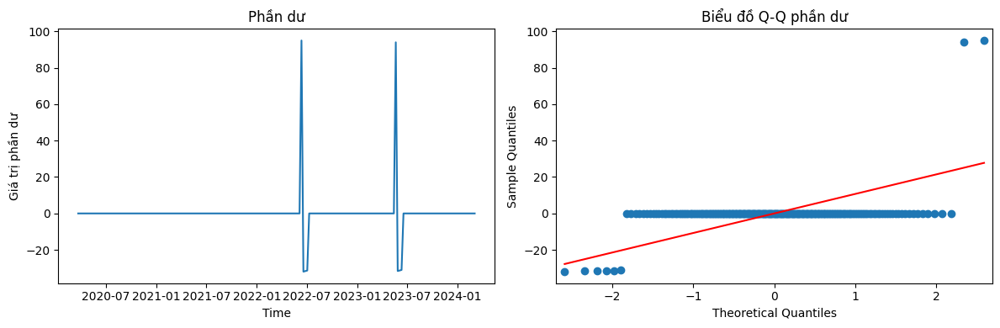

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)


Kết quả mô hình ARIMA cho từ khóa 'LiDAR':
                               SARIMAX Results                                
Dep. Variable:     interest_over_time   No. Observations:                  208
Model:                 ARIMA(2, 1, 0)   Log Likelihood                -644.482
Date:                Fri, 14 Mar 2025   AIC                           1294.964
Time:                        20:15:53   BIC                           1304.962
Sample:                    03-15-2020   HQIC                          1299.007
                         - 03-03-2024                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.3498      0.044     -7.932      0.000      -0.436      -0.263
ar.L2         -0.1260      0.044     -2.852      0.004      -0.213      -0.039
sigma2   

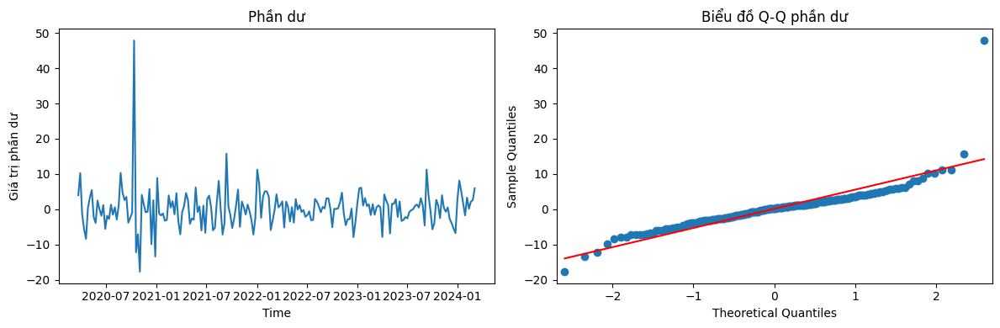

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)


Kết quả mô hình ARIMA cho từ khóa 'NLP':
                               SARIMAX Results                                
Dep. Variable:     interest_over_time   No. Observations:                  208
Model:                 ARIMA(2, 1, 0)   Log Likelihood                -658.263
Date:                Fri, 14 Mar 2025   AIC                           1322.525
Time:                        20:15:54   BIC                           1332.523
Sample:                    03-15-2020   HQIC                          1326.568
                         - 03-03-2024                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.2655      0.053     -4.993      0.000      -0.370      -0.161
ar.L2         -0.1607      0.060     -2.689      0.007      -0.278      -0.044
sigma2     

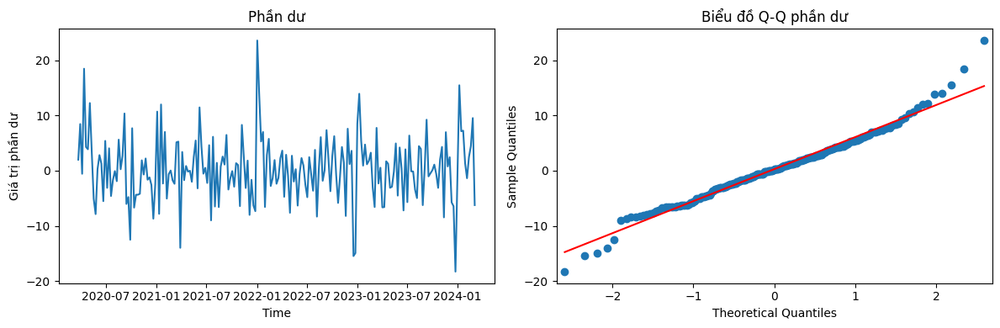

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)


Kết quả mô hình ARIMA cho từ khóa 'Network Slicing':
                               SARIMAX Results                                
Dep. Variable:     interest_over_time   No. Observations:                  208
Model:                 ARIMA(2, 1, 0)   Log Likelihood                -784.736
Date:                Fri, 14 Mar 2025   AIC                           1575.473
Time:                        20:15:54   BIC                           1585.471
Sample:                    03-15-2020   HQIC                          1579.516
                         - 03-03-2024                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.5304      0.049    -10.929      0.000      -0.626      -0.435
ar.L2         -0.2819      0.072     -3.932      0.000      -0.422      -0.141

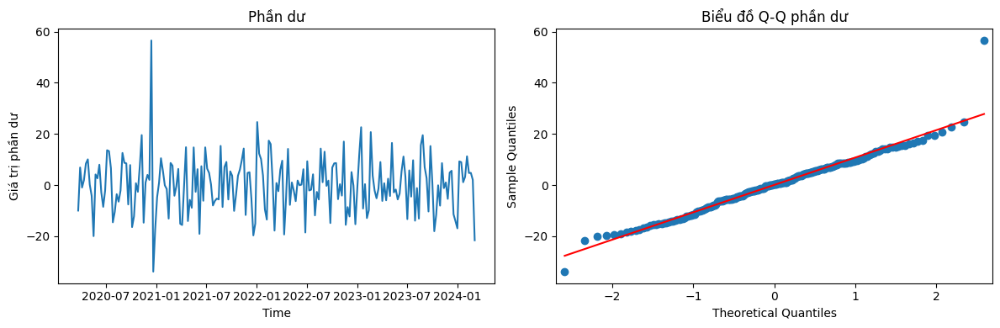

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)


Kết quả mô hình ARIMA cho từ khóa 'Vertical Farming':
                               SARIMAX Results                                
Dep. Variable:     interest_over_time   No. Observations:                  208
Model:                 ARIMA(2, 1, 0)   Log Likelihood                -703.728
Date:                Fri, 14 Mar 2025   AIC                           1413.457
Time:                        20:15:55   BIC                           1423.455
Sample:                    03-15-2020   HQIC                          1417.500
                         - 03-03-2024                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.3934      0.063     -6.247      0.000      -0.517      -0.270
ar.L2         -0.0802      0.061     -1.311      0.190      -0.200       0.04

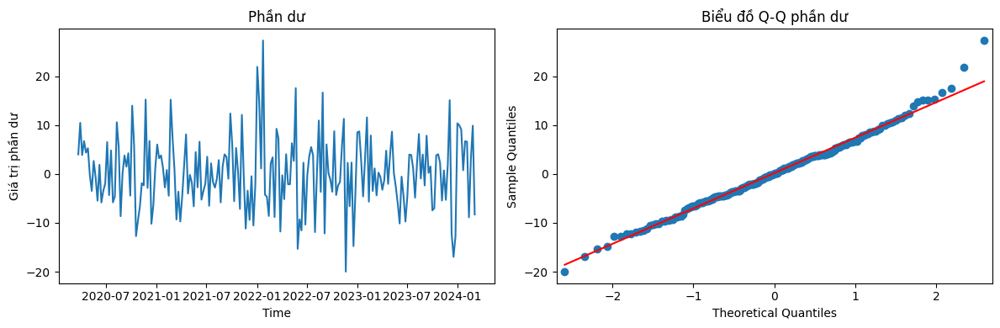

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)


Kết quả mô hình ARIMA cho từ khóa 'V2X':
                               SARIMAX Results                                
Dep. Variable:     interest_over_time   No. Observations:                  208
Model:                 ARIMA(2, 1, 0)   Log Likelihood                -608.900
Date:                Fri, 14 Mar 2025   AIC                           1223.799
Time:                        20:15:56   BIC                           1233.797
Sample:                    03-15-2020   HQIC                          1227.842
                         - 03-03-2024                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.6280      0.062    -10.062      0.000      -0.750      -0.506
ar.L2         -0.3917      0.064     -6.115      0.000      -0.517      -0.266
sigma2     

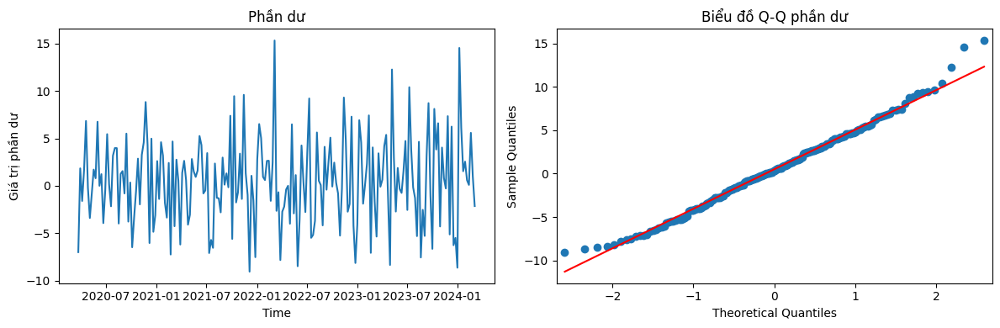

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)


Kết quả mô hình ARIMA cho từ khóa 'Zero Trust':
                               SARIMAX Results                                
Dep. Variable:     interest_over_time   No. Observations:                  208
Model:                 ARIMA(2, 1, 0)   Log Likelihood                -566.658
Date:                Fri, 14 Mar 2025   AIC                           1139.315
Time:                        20:15:56   BIC                           1149.313
Sample:                    03-15-2020   HQIC                          1143.358
                         - 03-03-2024                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.2049      0.058     -3.510      0.000      -0.319      -0.090
ar.L2         -0.2127      0.049     -4.344      0.000      -0.309      -0.117
sigm

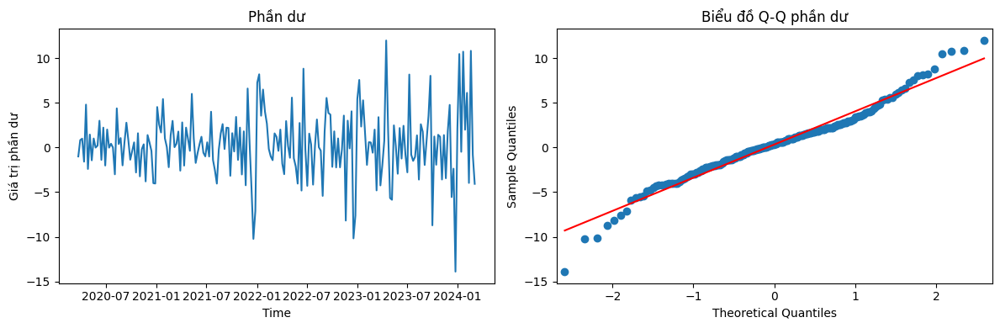

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)


Kết quả mô hình ARIMA cho từ khóa 'Nano robotics':
                               SARIMAX Results                                
Dep. Variable:     interest_over_time   No. Observations:                  208
Model:                 ARIMA(2, 1, 0)   Log Likelihood                -951.270
Date:                Fri, 14 Mar 2025   AIC                           1908.539
Time:                        20:15:57   BIC                           1918.537
Sample:                    03-15-2020   HQIC                          1912.582
                         - 03-03-2024                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.7207      0.057    -12.690      0.000      -0.832      -0.609
ar.L2         -0.2799      0.061     -4.609      0.000      -0.399      -0.161
s

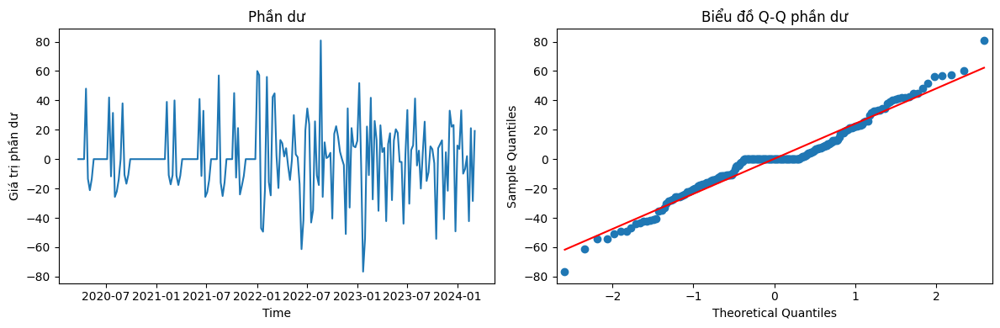

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)


Kết quả mô hình ARIMA cho từ khóa 'Applied AI':
                               SARIMAX Results                                
Dep. Variable:     interest_over_time   No. Observations:                  208
Model:                 ARIMA(2, 1, 0)   Log Likelihood                -528.906
Date:                Fri, 14 Mar 2025   AIC                           1063.813
Time:                        20:15:58   BIC                           1073.811
Sample:                    03-15-2020   HQIC                          1067.856
                         - 03-03-2024                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.4569      0.065     -7.067      0.000      -0.584      -0.330
ar.L2         -0.1662      0.065     -2.555      0.011      -0.294      -0.039
sigm

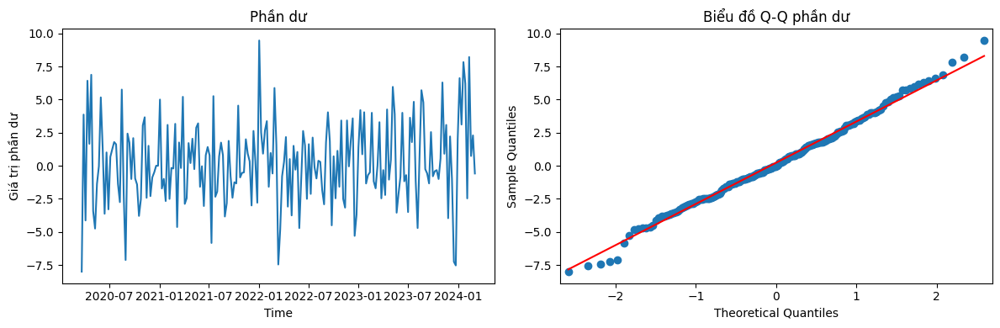

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)


Kết quả mô hình ARIMA cho từ khóa 'Bioprinting':
                               SARIMAX Results                                
Dep. Variable:     interest_over_time   No. Observations:                  208
Model:                 ARIMA(2, 1, 0)   Log Likelihood                -743.180
Date:                Fri, 14 Mar 2025   AIC                           1492.360
Time:                        20:15:58   BIC                           1502.358
Sample:                    03-15-2020   HQIC                          1496.403
                         - 03-03-2024                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.3257      0.033     -9.971      0.000      -0.390      -0.262
ar.L2         -0.1982      0.056     -3.563      0.000      -0.307      -0.089
sig

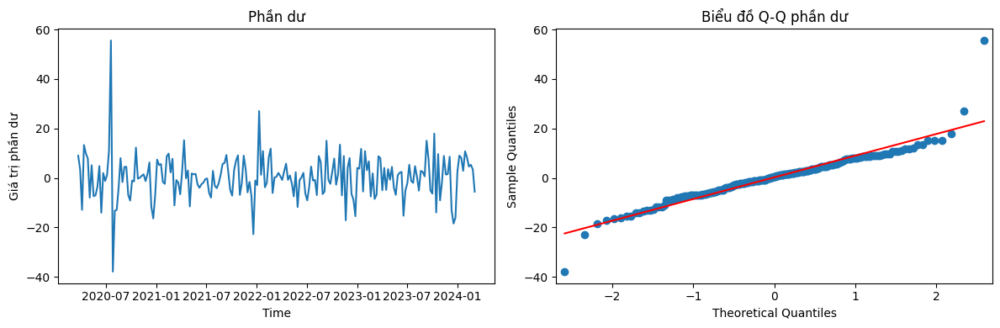

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)


Kết quả mô hình ARIMA cho từ khóa 'NFT':
                               SARIMAX Results                                
Dep. Variable:     interest_over_time   No. Observations:                  208
Model:                 ARIMA(2, 1, 0)   Log Likelihood                -535.505
Date:                Fri, 14 Mar 2025   AIC                           1077.011
Time:                        20:15:59   BIC                           1087.009
Sample:                    03-15-2020   HQIC                          1081.054
                         - 03-03-2024                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.2632      0.058      4.527      0.000       0.149       0.377
ar.L2          0.2035      0.046      4.410      0.000       0.113       0.294
sigma2     

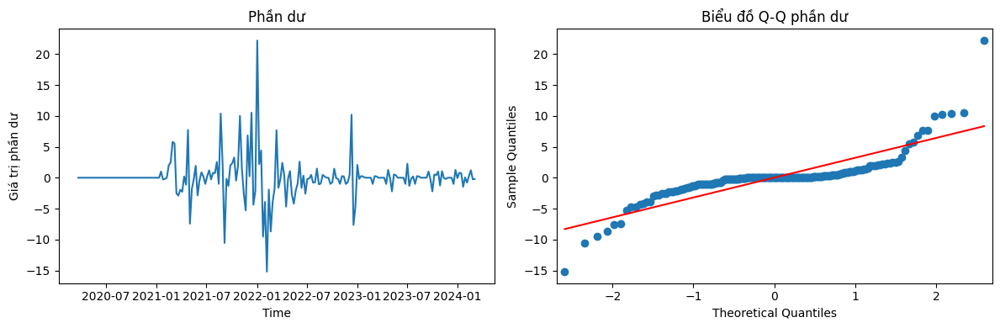

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)


Kết quả mô hình ARIMA cho từ khóa 'Metaverse':
                               SARIMAX Results                                
Dep. Variable:     interest_over_time   No. Observations:                  208
Model:                 ARIMA(2, 1, 0)   Log Likelihood                -666.494
Date:                Fri, 14 Mar 2025   AIC                           1338.988
Time:                        20:16:00   BIC                           1348.986
Sample:                    03-15-2020   HQIC                          1343.031
                         - 03-03-2024                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.0858      0.042      2.023      0.043       0.003       0.169
ar.L2         -0.1194      0.032     -3.719      0.000      -0.182      -0.056
sigma

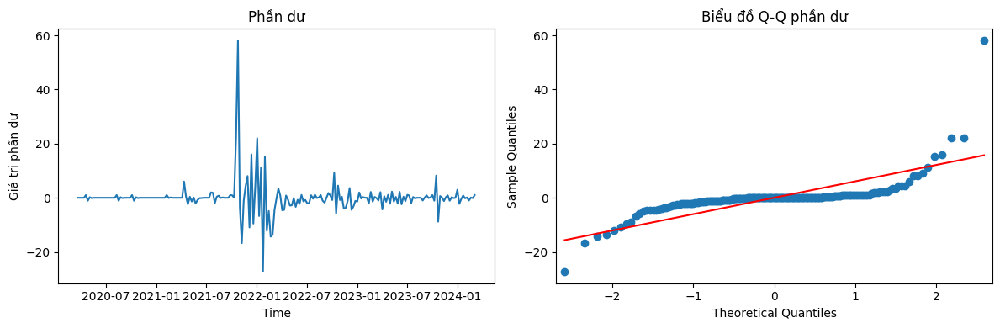

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)


Kết quả mô hình ARIMA cho từ khóa 'Reinforcement Learning':
                               SARIMAX Results                                
Dep. Variable:     interest_over_time   No. Observations:                  208
Model:                 ARIMA(2, 1, 0)   Log Likelihood                -650.283
Date:                Fri, 14 Mar 2025   AIC                           1306.566
Time:                        20:16:00   BIC                           1316.564
Sample:                    03-15-2020   HQIC                          1310.609
                         - 03-03-2024                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.1509      0.052     -2.921      0.003      -0.252      -0.050
ar.L2         -0.1855      0.056     -3.297      0.001      -0.296     

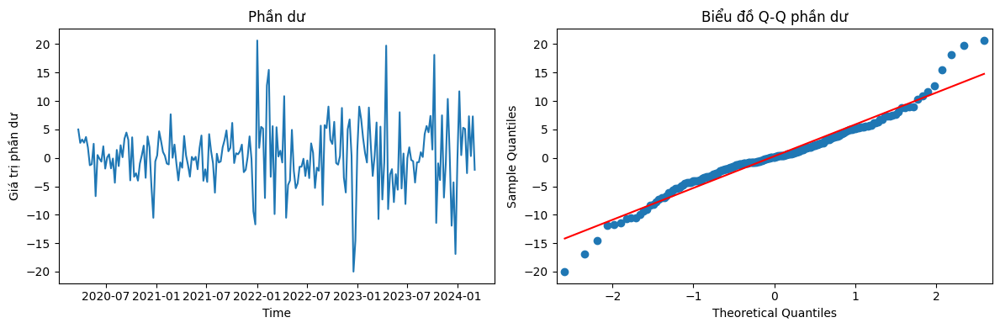

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)


Kết quả mô hình ARIMA cho từ khóa 'AR Glasses':
                               SARIMAX Results                                
Dep. Variable:     interest_over_time   No. Observations:                  208
Model:                 ARIMA(2, 1, 0)   Log Likelihood                -704.920
Date:                Fri, 14 Mar 2025   AIC                           1415.840
Time:                        20:16:01   BIC                           1425.838
Sample:                    03-15-2020   HQIC                          1419.883
                         - 03-03-2024                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.3538      0.023    -15.512      0.000      -0.399      -0.309
ar.L2         -0.2204      0.036     -6.208      0.000      -0.290      -0.151
sigm

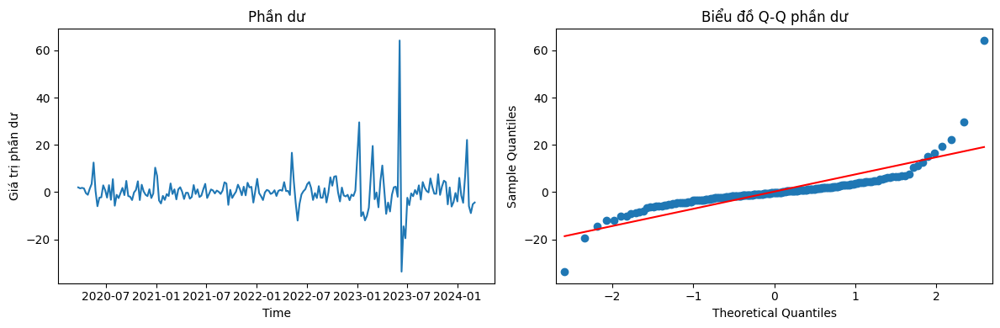

In [ ]:
from statsmodels.tsa.arima.model import ARIMA
# 1. Lấy danh sách các từ khóa duy nhất
keywords = df_cleaned['keyword'].unique()
# 2. Vòng lặp qua từng từ khóa
import statsmodels.api as sm # Import the statsmodels.api module

for keyword in keywords:
    # 3. Lọc dữ liệu cho từ khóa hiện tại
    df_keyword = df_cleaned[df_cleaned['keyword'] == keyword].copy()

    # 4. 'date' is already the index, reset it to a column
    df_keyword = df_keyword.reset_index()

    # 5. Now you can convert 'date' to datetime
    df_keyword["date"] = pd.to_datetime(df_keyword["date"], errors="coerce")
    df_keyword.dropna(subset=["date"], inplace=True)
    df_keyword.sort_values("date", inplace=True)
    df_keyword.set_index("date", inplace=True)

    # 5. Chia dữ liệu thành tập huấn luyện và tập kiểm tra (ví dụ: 80/20)
    train_size = int(len(df_keyword) * 0.8)
    df_train, df_test = df_keyword[:train_size], df_keyword[train_size:]

    # 6. Xây dựng và huấn luyện mô hình ARIMA
    model = ARIMA(df_train['interest_over_time'], order=(2, 1, 0))  # Áp dụng ARIMA lên cột 'interest_over_time'
    model_fit = model.fit()
    print(f"Kết quả mô hình ARIMA cho từ khóa '{keyword}':")
    print(model_fit.summary())

    # 7. Dự đoán trên tập kiểm tra và đánh giá (ví dụ)
    forecast = model_fit.predict(start=len(df_train), end=len(df_keyword)-1)

    # In ra kết quả đánh giá
    mae = mean_absolute_error(df_test['interest_over_time'], forecast)
    rmse = np.sqrt(mean_squared_error(df_test['interest_over_time'], forecast))
    print(f"Keyword: {keyword}, MAE: {mae}, RMSE: {rmse}")

    # Residual analysis
    residuals = model_fit.resid[1:]

    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 4))

    # Residuals plot
    ax1.plot(residuals)
    ax1.set_title('Phần dư')
    ax1.set_xlabel('Time')
    ax1.set_ylabel('Giá trị phần dư')

    # Residuals density plot (using statsmodels for better visualization)
    sm.qqplot(residuals, line='s', ax=ax2) # Using sm to call qqplot function
    ax2.set_title('Biểu đồ Q-Q phần dư')

    plt.tight_layout()
    plt.show()

Đang dự báo cho từ khóa: AI Security


/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)


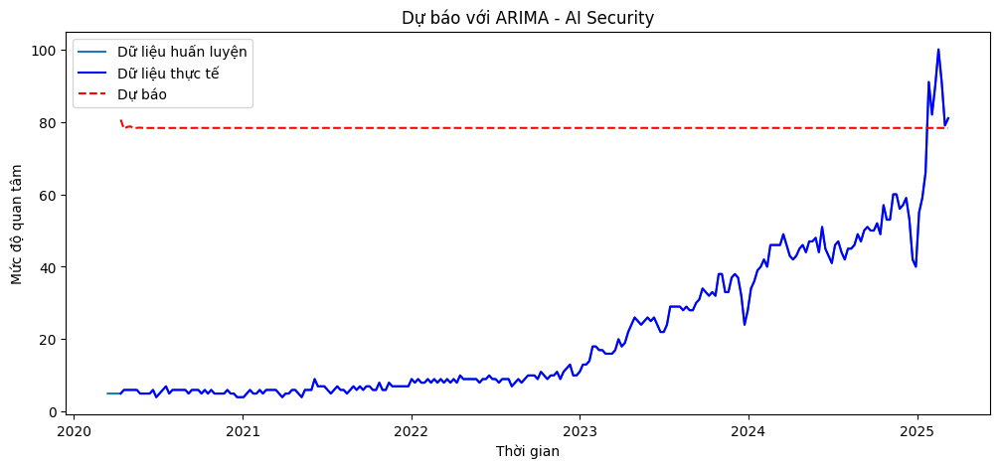

Đang dự báo cho từ khóa: FDM


/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)


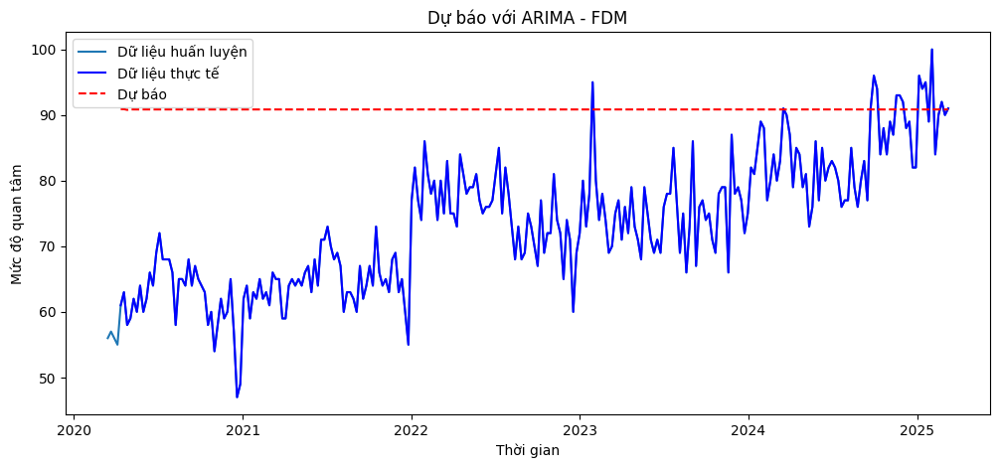

Đang dự báo cho từ khóa: RPA Software


/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)


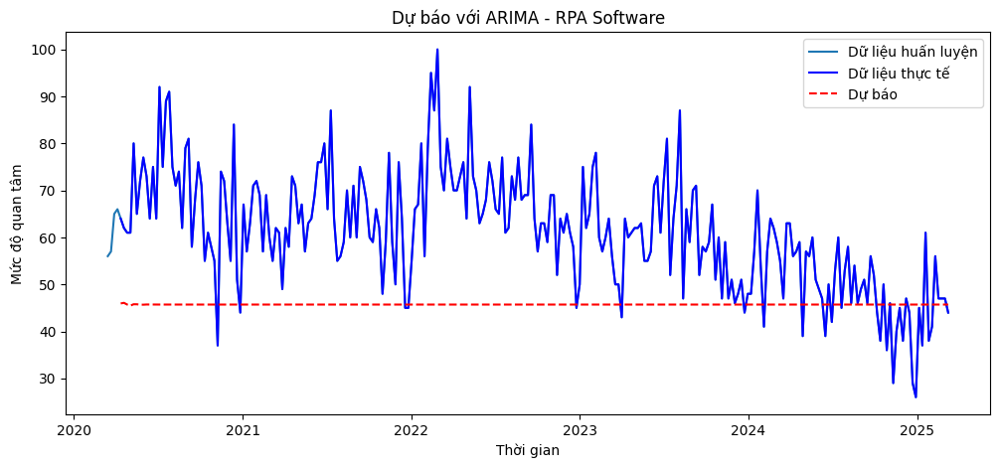

Đang dự báo cho từ khóa: Distributed Cloud


/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)


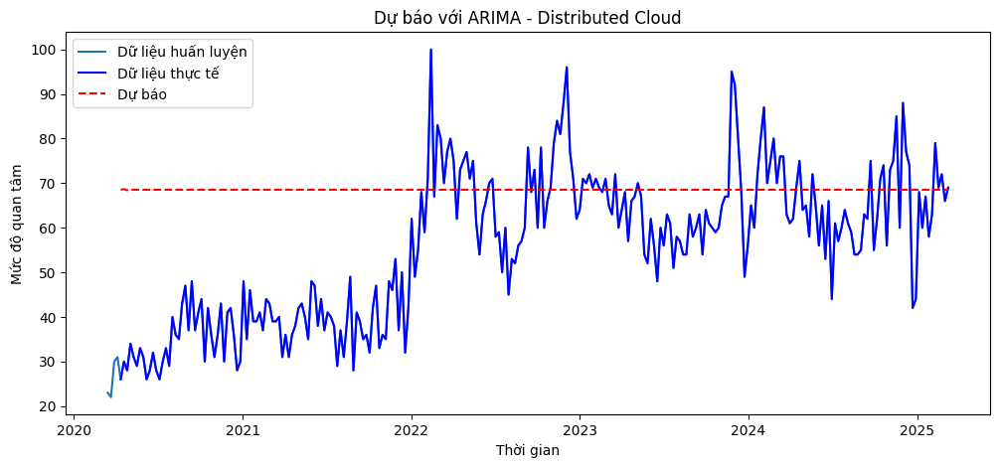

Đang dự báo cho từ khóa: Smart Contracts


/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)


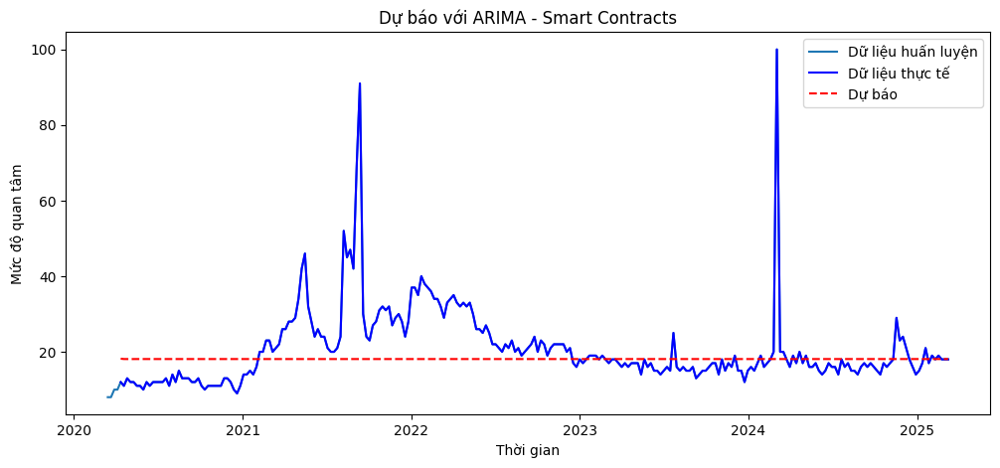

Đang dự báo cho từ khóa: Smart Sensors


/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)


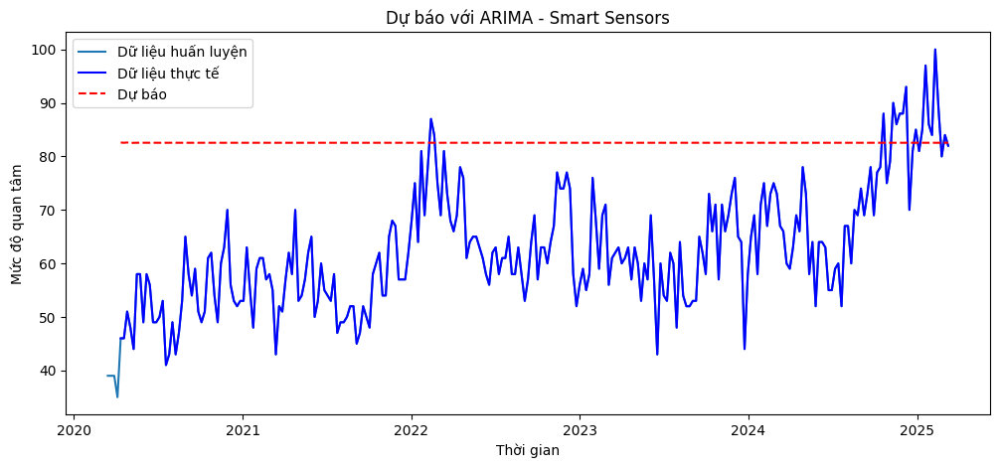

Đang dự báo cho từ khóa: Cloud computing for IoT


/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)


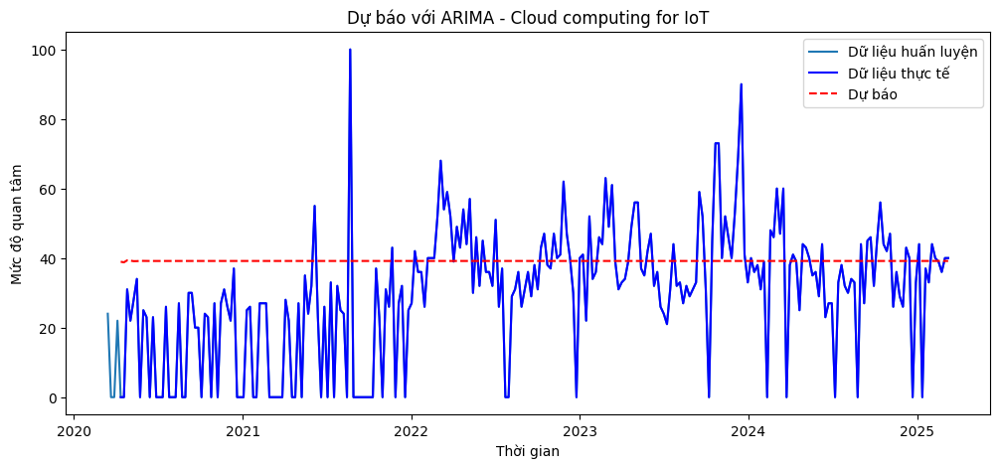

Đang dự báo cho từ khóa: Quantum computing


/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)


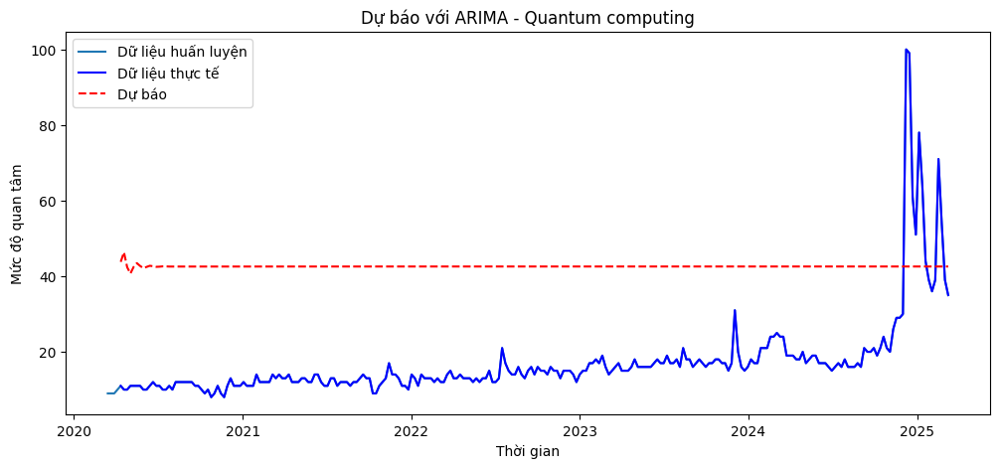

Đang dự báo cho từ khóa: Green Hydrogen


/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)


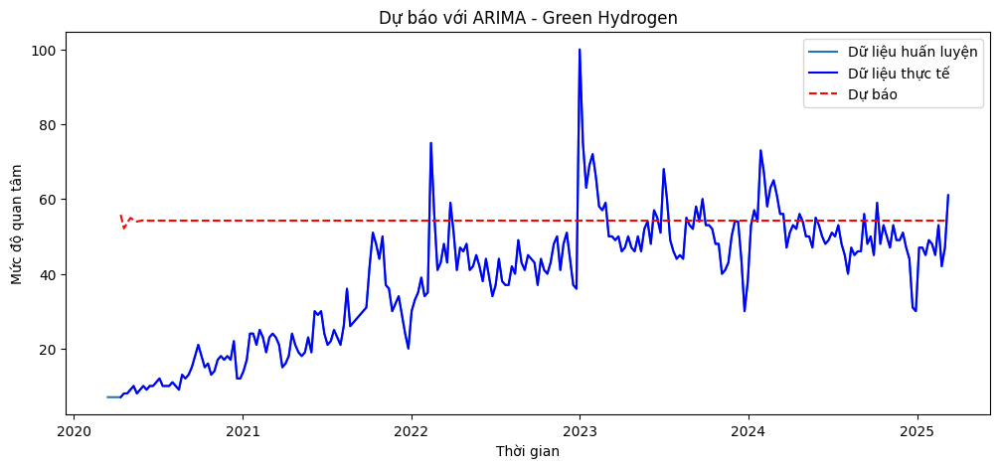

Đang dự báo cho từ khóa: Public Cloud


/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)


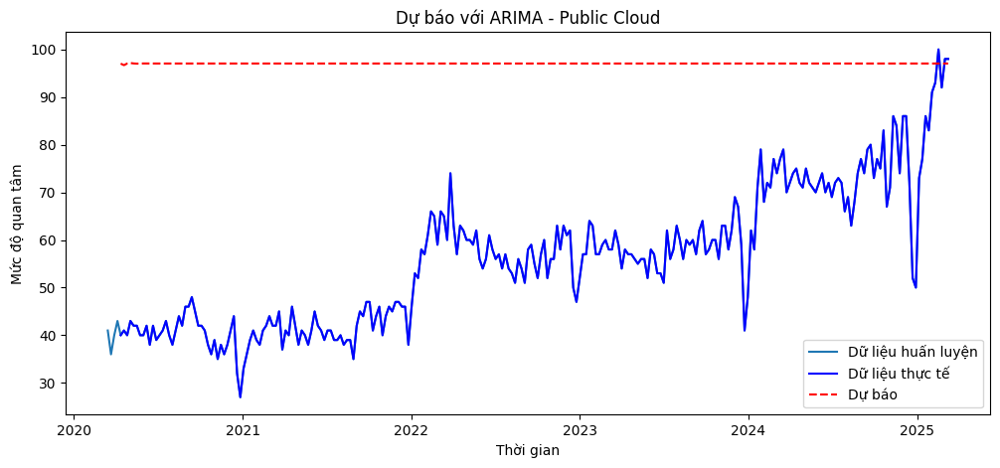

Đang dự báo cho từ khóa: Industrial Robots


/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)


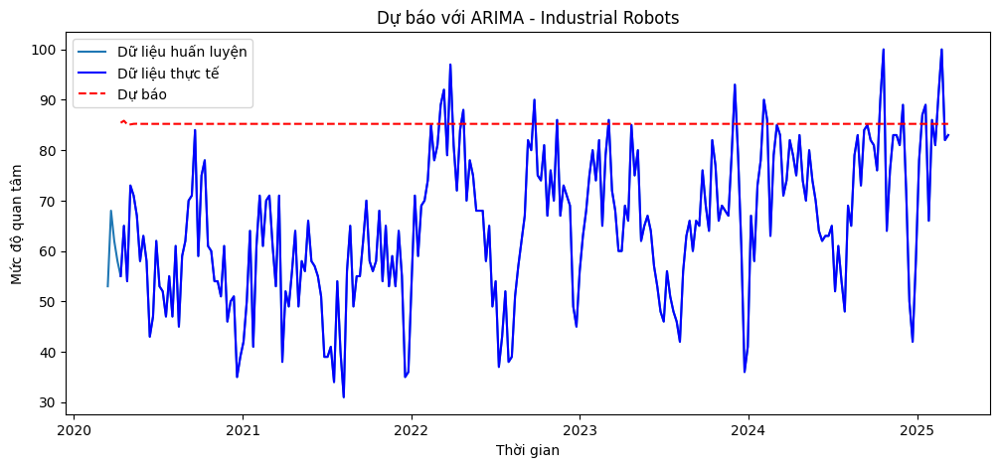

Đang dự báo cho từ khóa: Smart grid and IoT


/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)


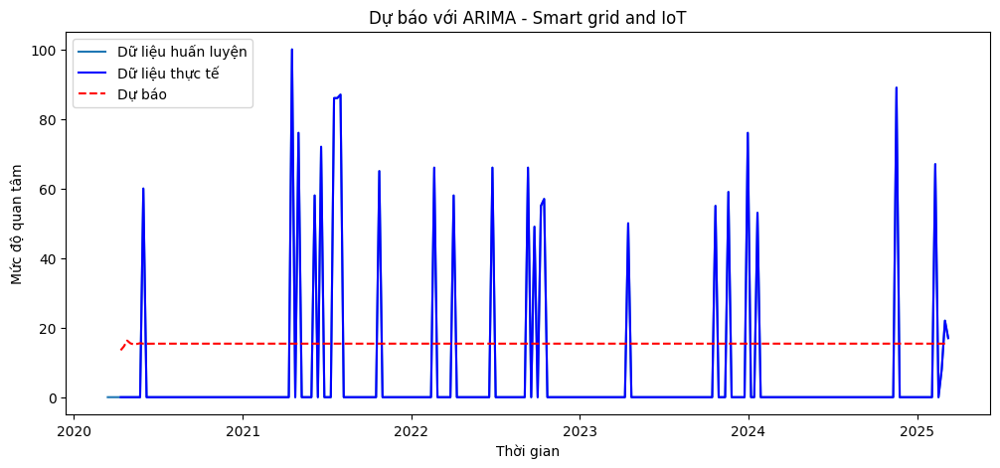

Đang dự báo cho từ khóa: VR Headsets


/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)


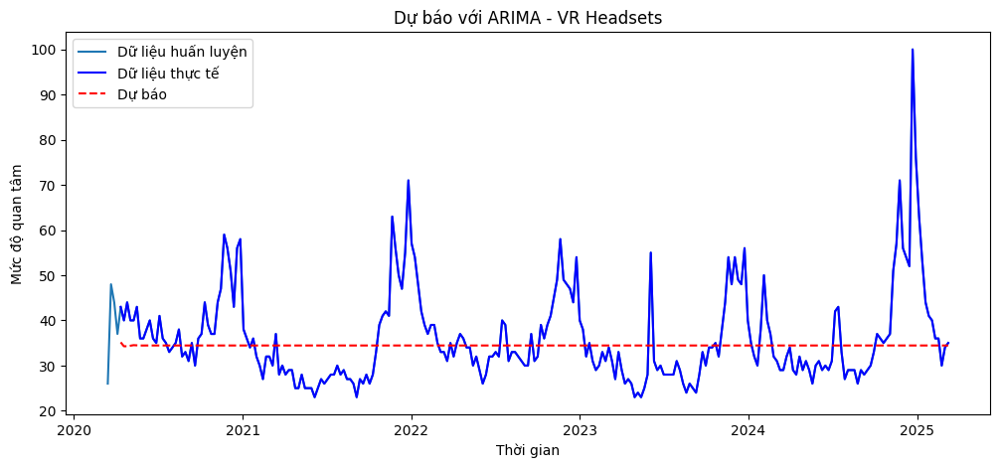

Đang dự báo cho từ khóa: Quantum Cryptography


/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)


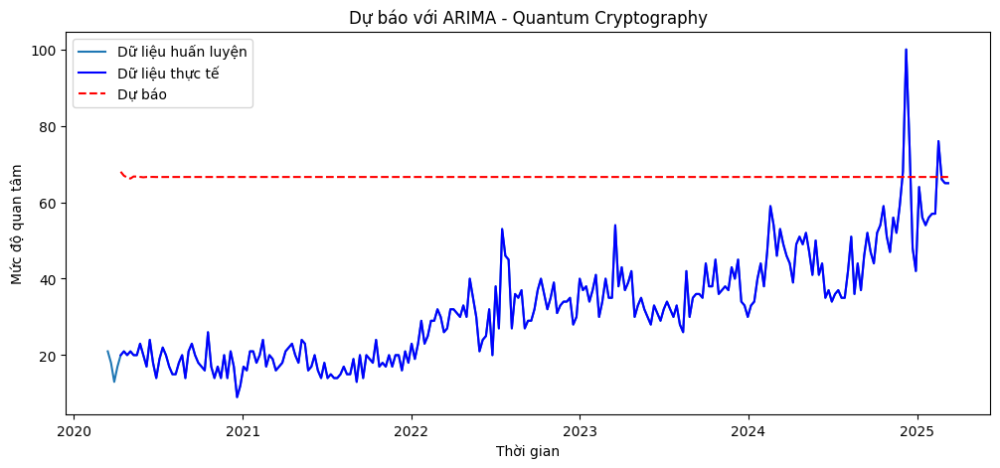

Đang dự báo cho từ khóa: Augmented reality


/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)


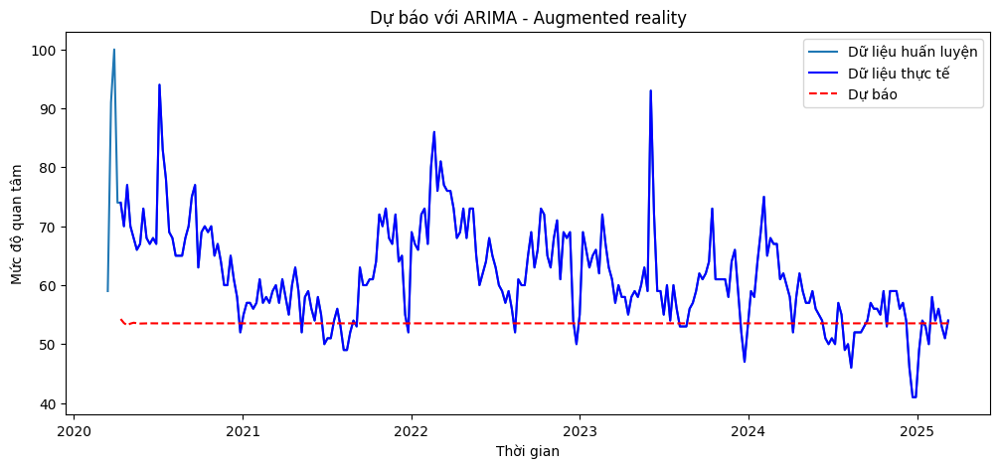

Đang dự báo cho từ khóa: Small Satellites


/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)


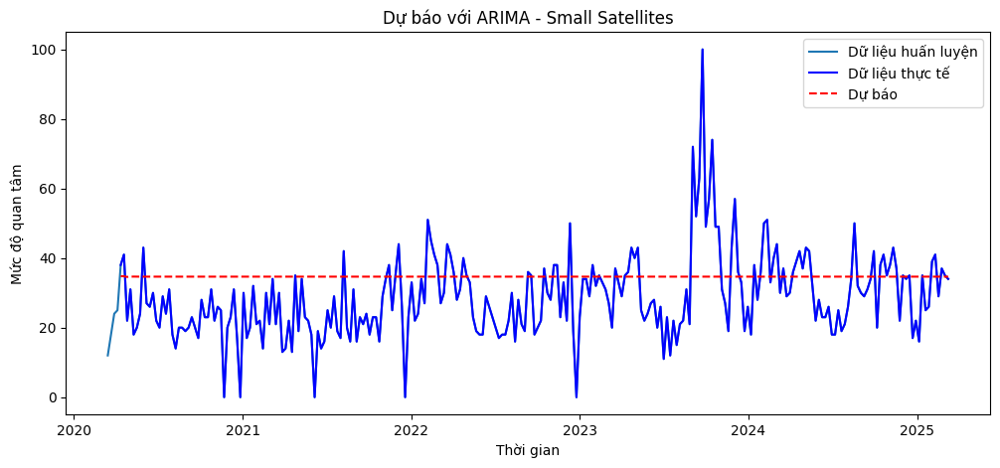

Đang dự báo cho từ khóa: Computer vision


/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)


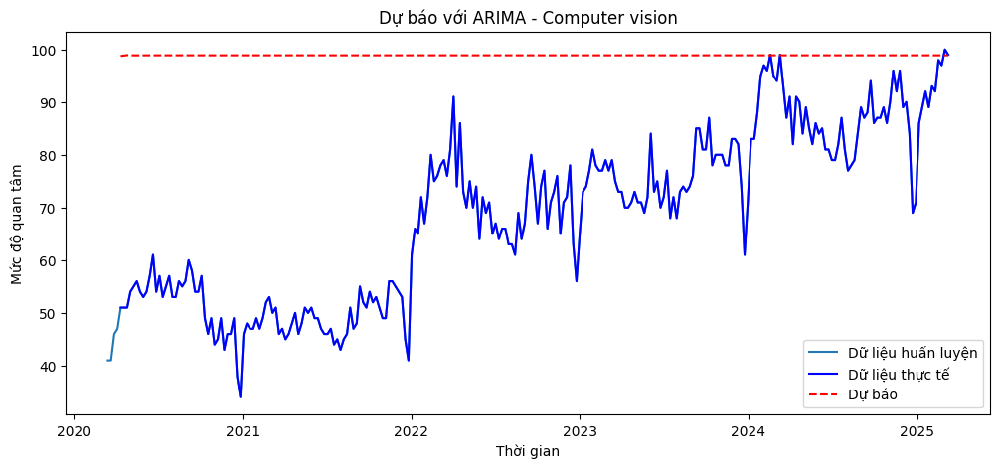

Đang dự báo cho từ khóa: Cashless Payment


/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)


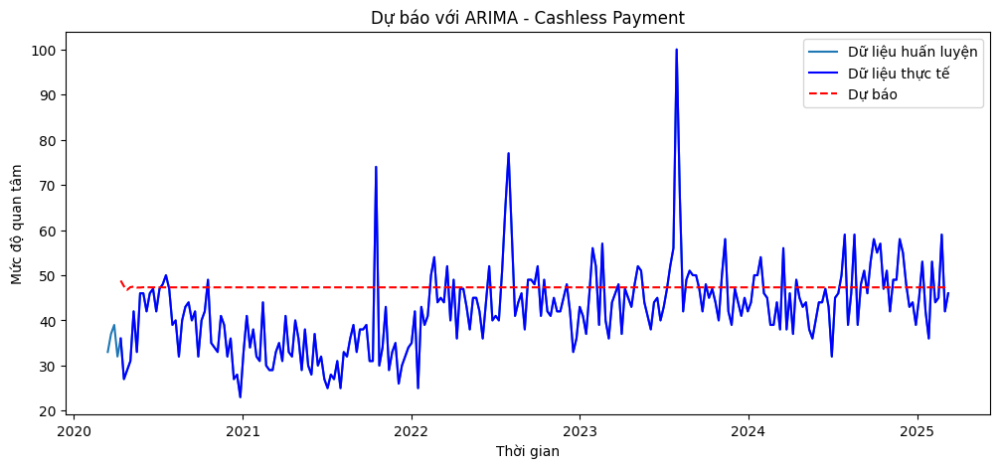

Đang dự báo cho từ khóa: Edge AI


/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)


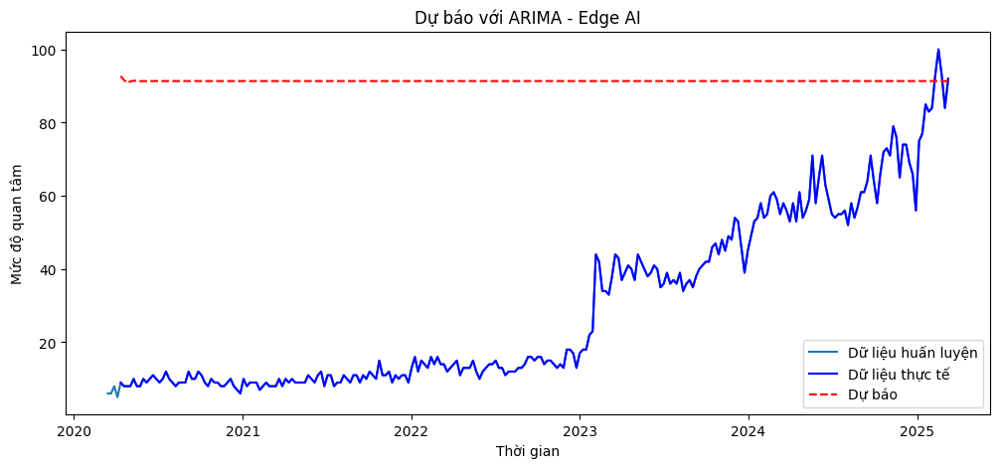

Đang dự báo cho từ khóa: Adaptive learning


/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)


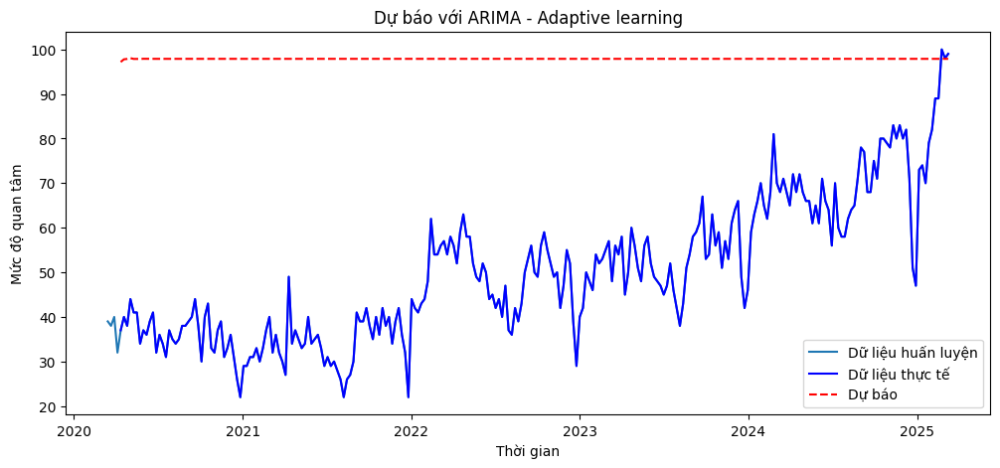

Đang dự báo cho từ khóa: Virtual reality technology


/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)


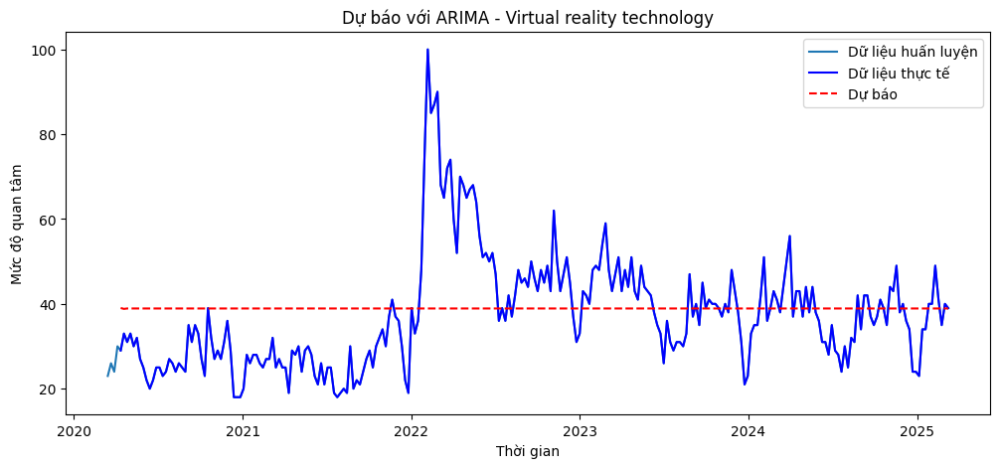

Đang dự báo cho từ khóa: Super Apps


/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)


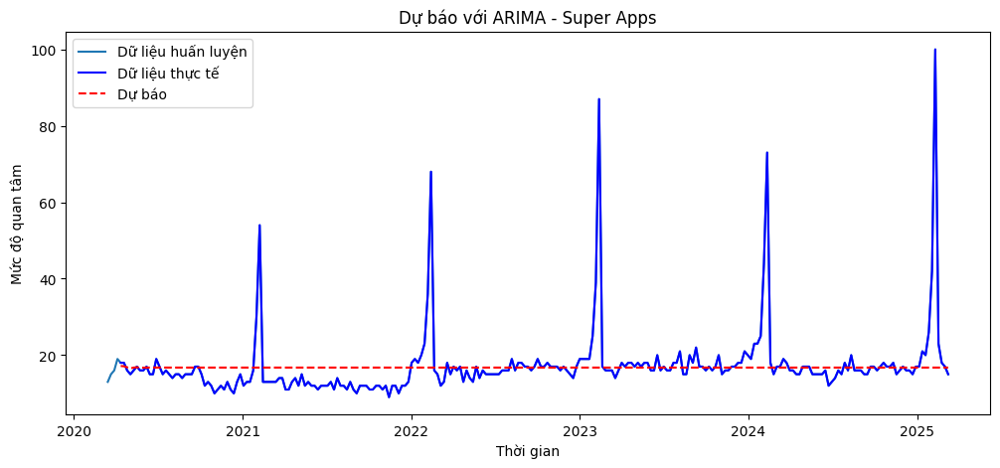

Đang dự báo cho từ khóa: Qubits


/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)


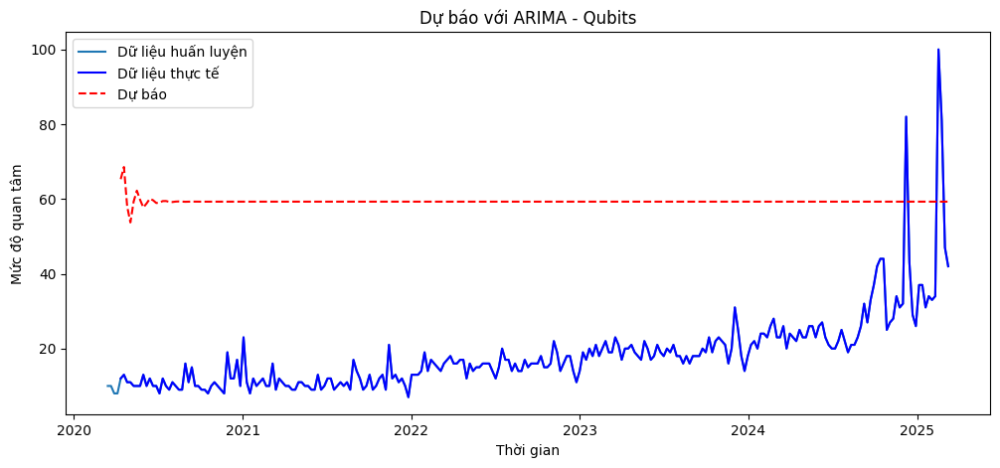

Đang dự báo cho từ khóa: Generative AI


/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)


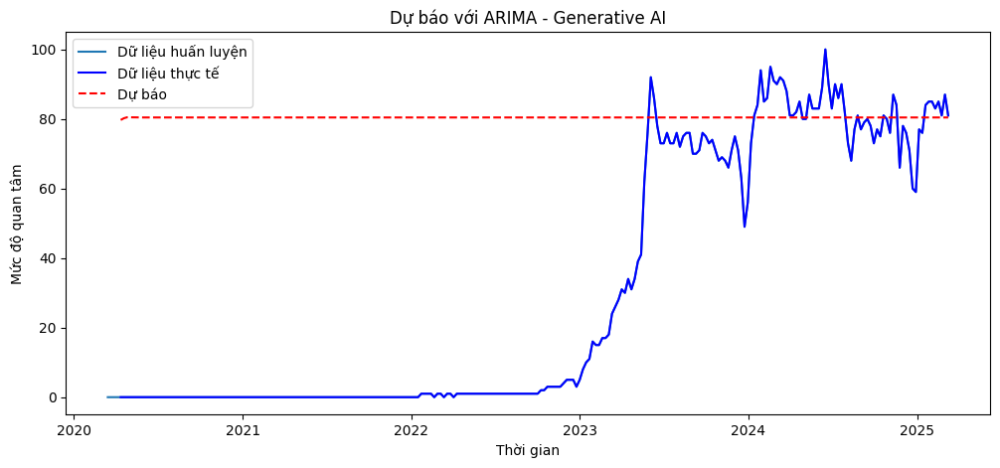

Đang dự báo cho từ khóa: CRISPR


/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)


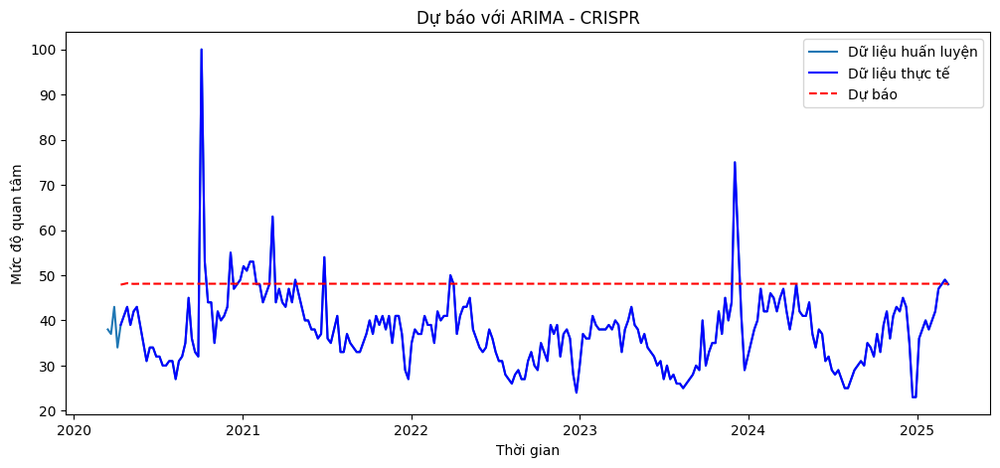

Đang dự báo cho từ khóa: Telemedicine


/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)


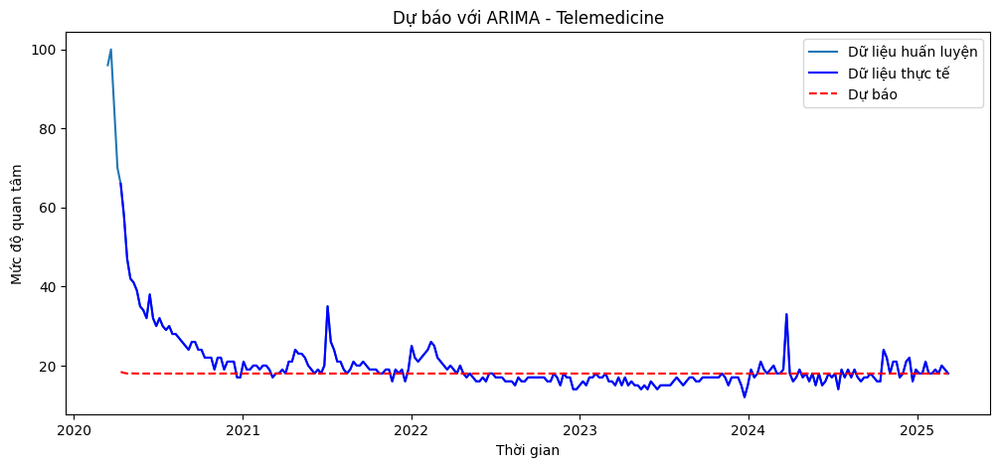

Đang dự báo cho từ khóa: Lab-grown Meat


/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)


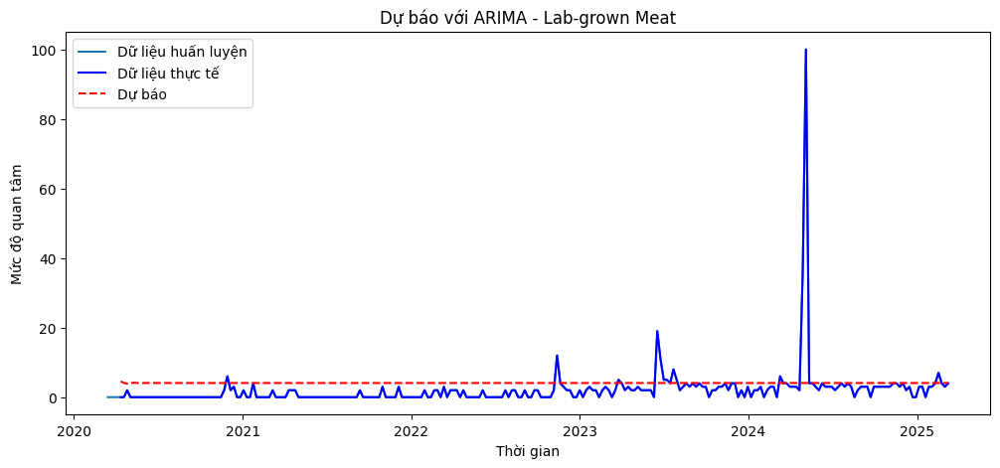

Đang dự báo cho từ khóa: Chatbots


/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)


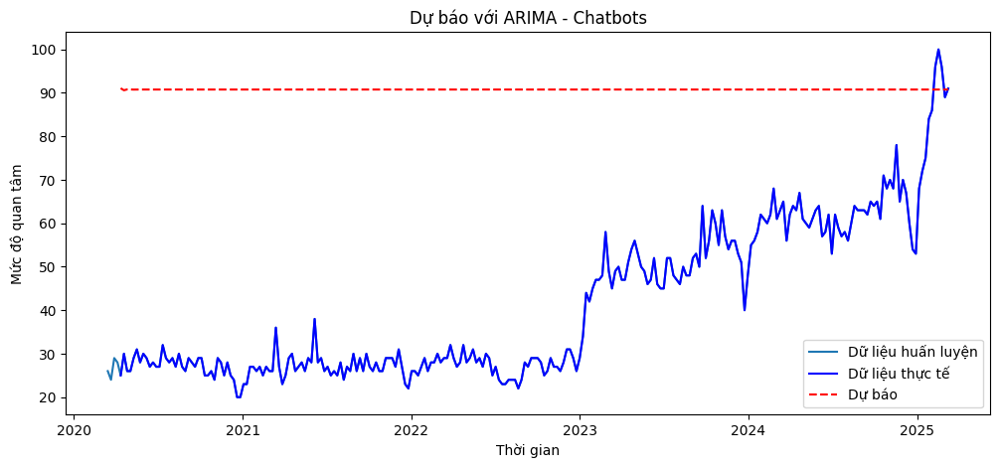

Đang dự báo cho từ khóa: Green cloud computing


/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)


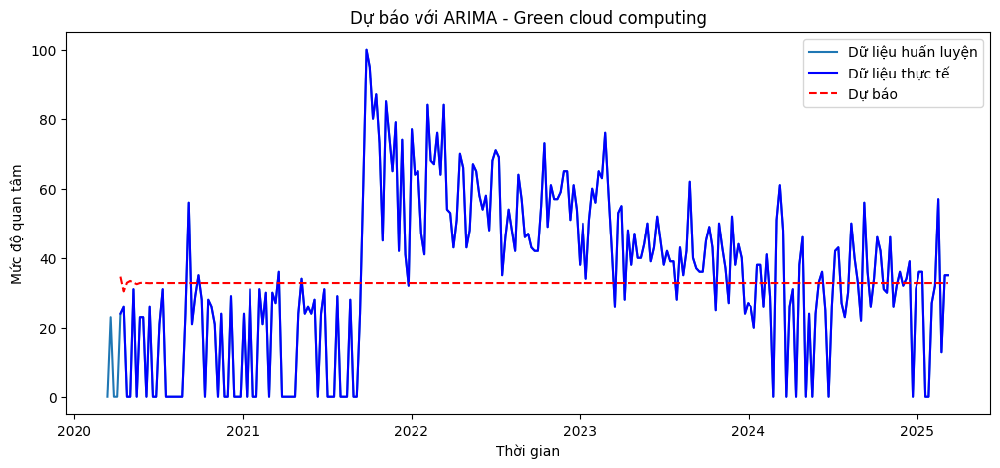

Đang dự báo cho từ khóa: Reusable Rockets


/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)


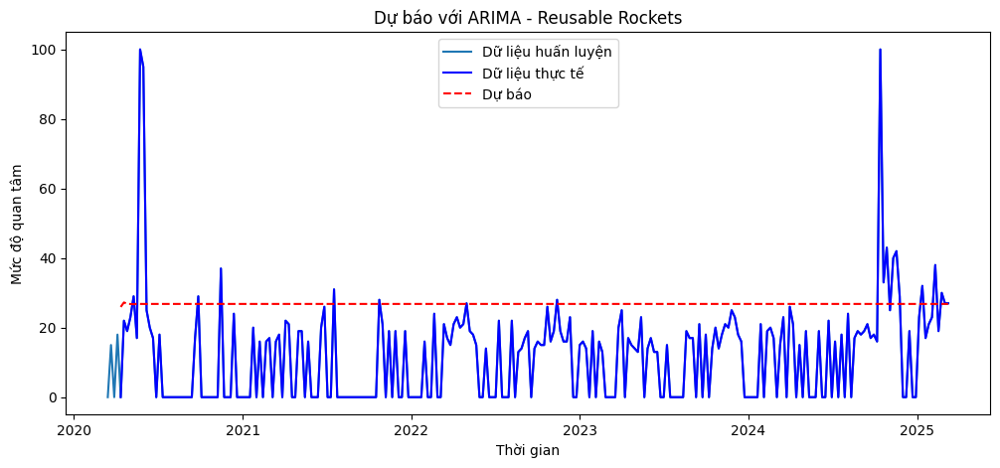

Đang dự báo cho từ khóa: Cloud computing platforms


/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)


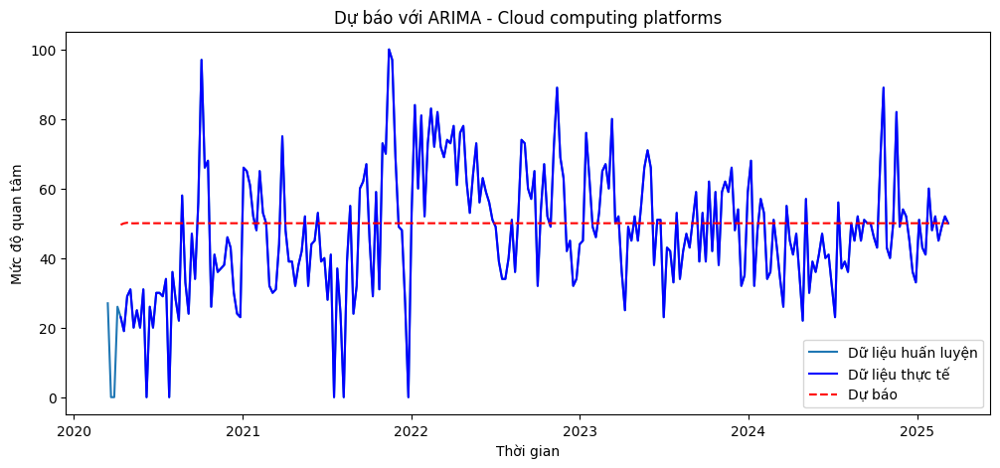

Đang dự báo cho từ khóa: Synthetic Data


/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)


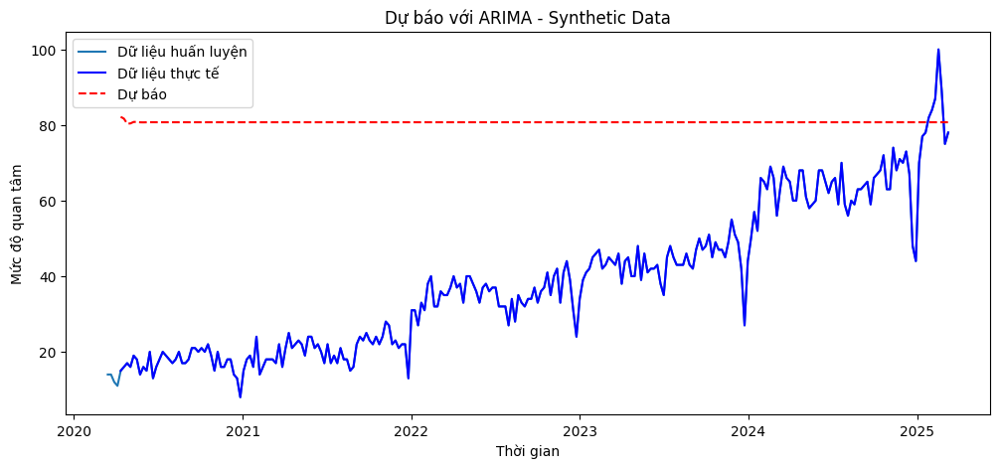

Đang dự báo cho từ khóa: Carbon Capture


/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)


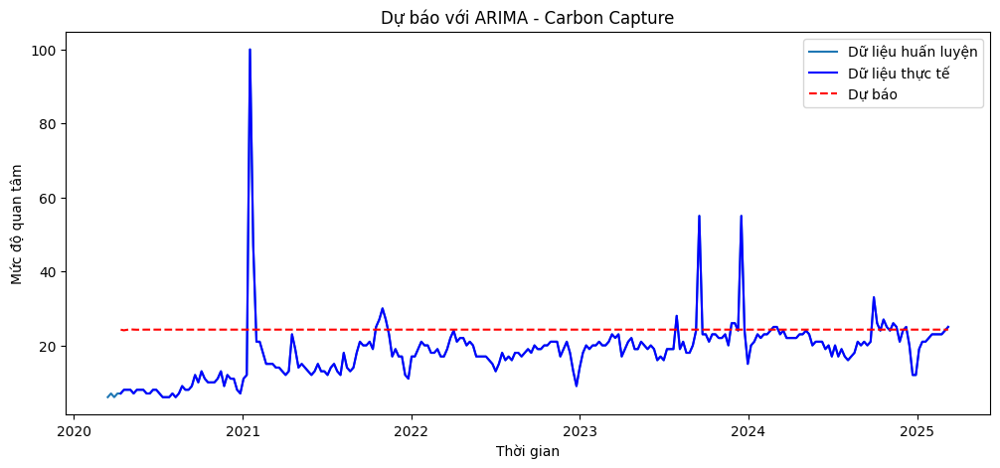

Đang dự báo cho từ khóa: IoT security and trust


/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)


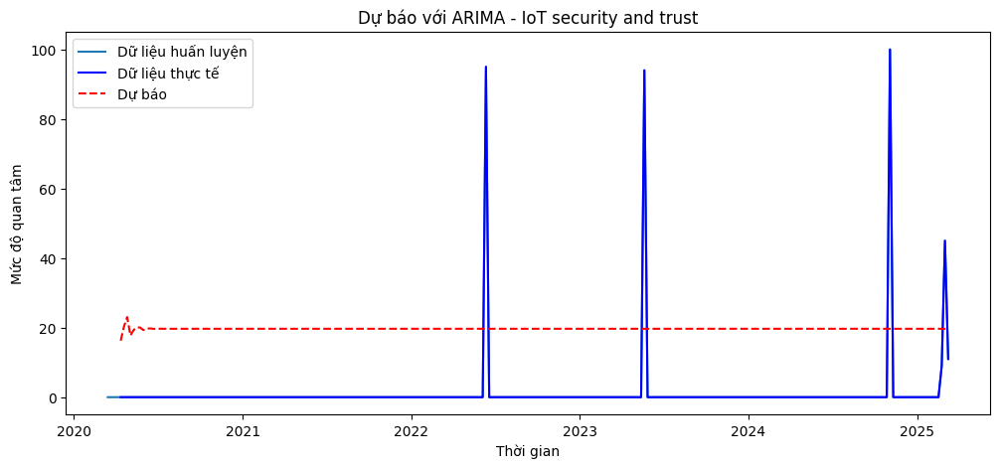

Đang dự báo cho từ khóa: LiDAR


/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)


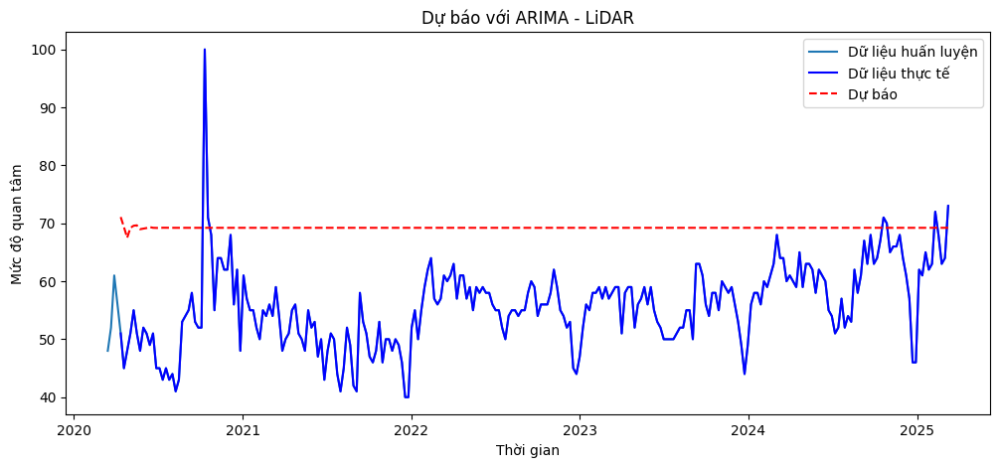

Đang dự báo cho từ khóa: NLP


/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)


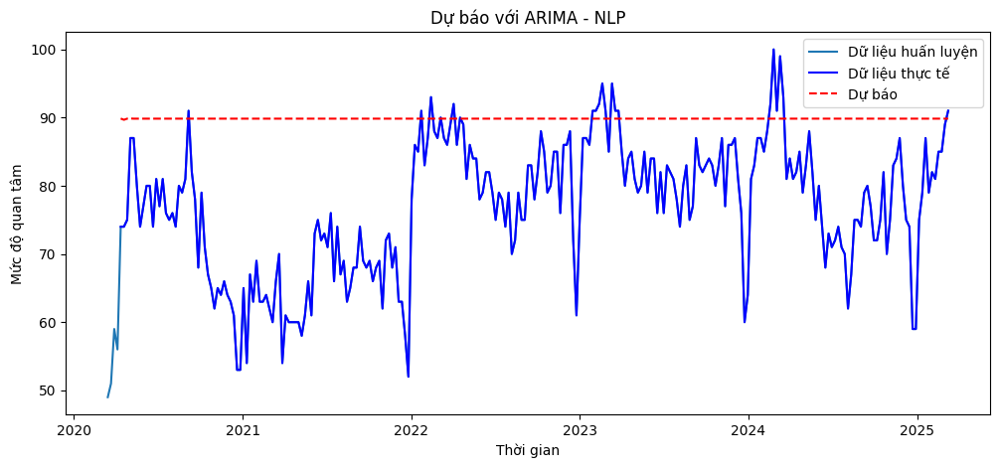

Đang dự báo cho từ khóa: Network Slicing


/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)


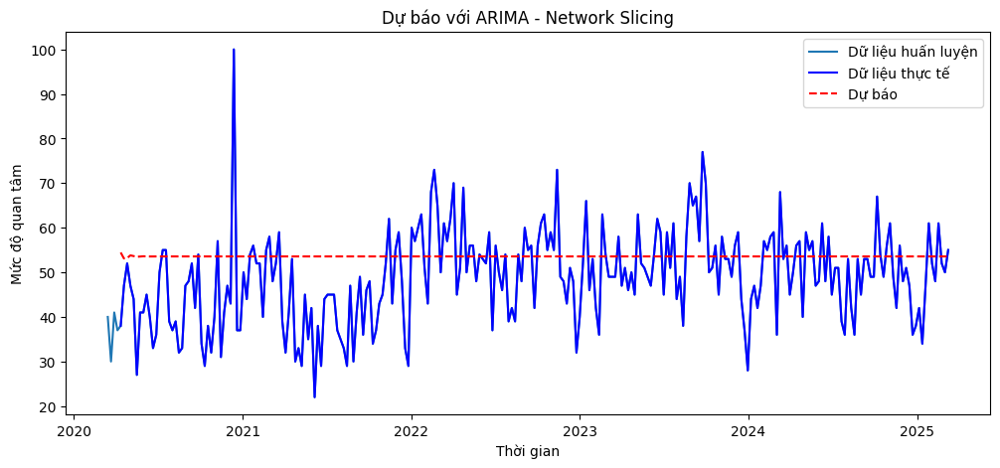

Đang dự báo cho từ khóa: Vertical Farming


/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)


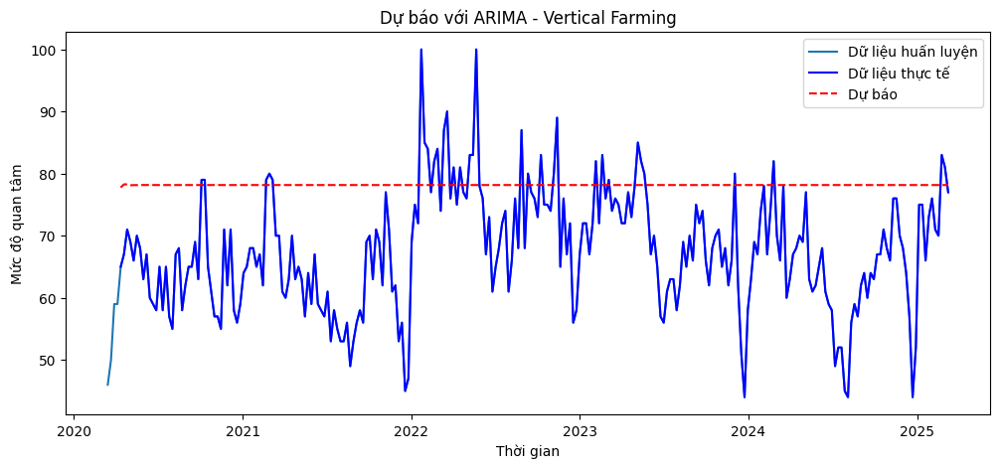

Đang dự báo cho từ khóa: V2X


/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)


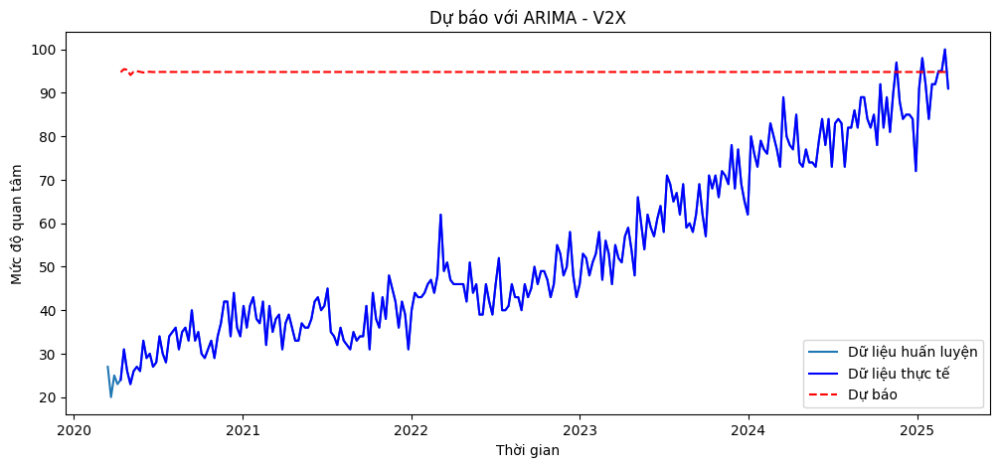

Đang dự báo cho từ khóa: Zero Trust


/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)


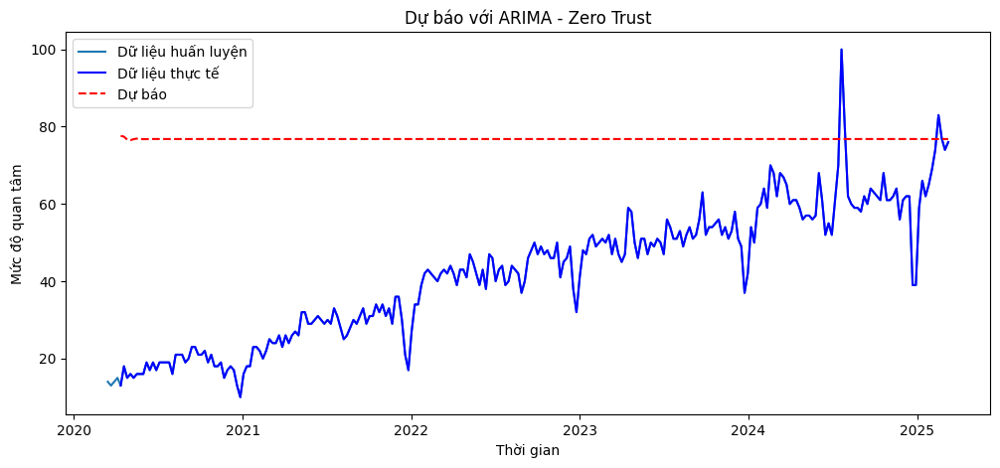

Đang dự báo cho từ khóa: Nano robotics


/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)


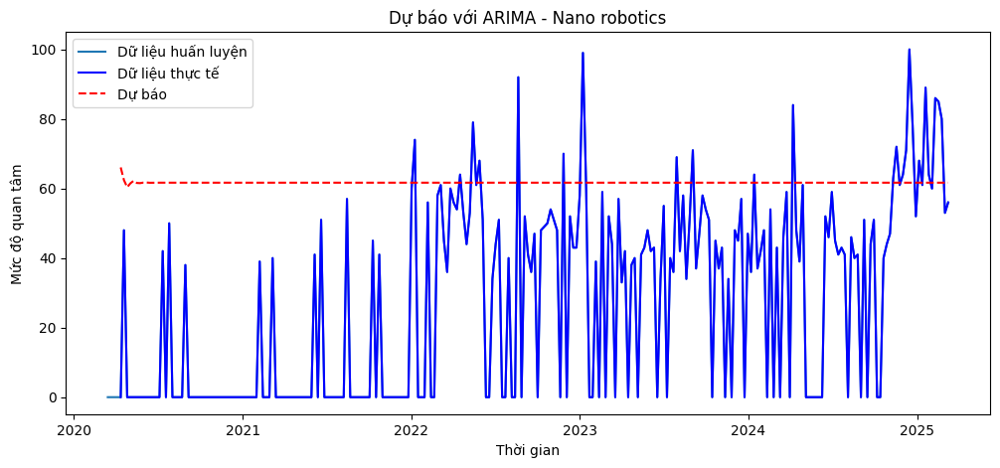

Đang dự báo cho từ khóa: Applied AI


/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)


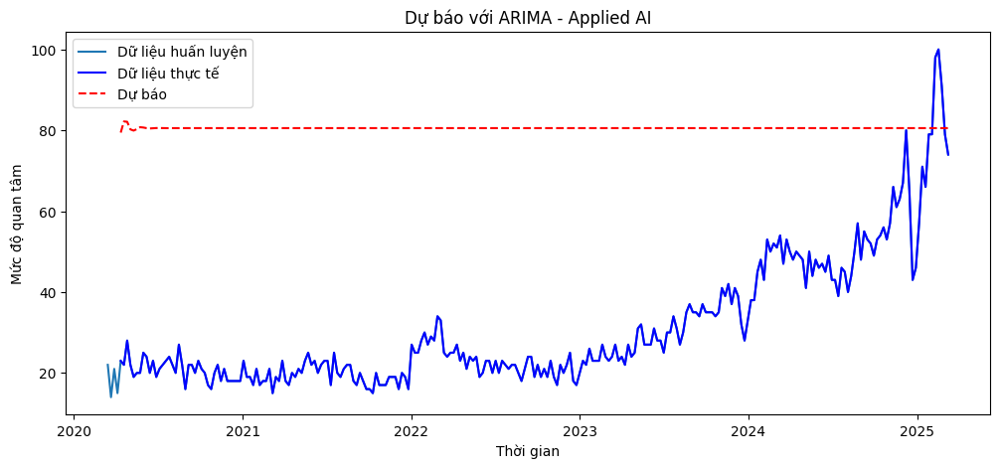

Đang dự báo cho từ khóa: Bioprinting


/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)


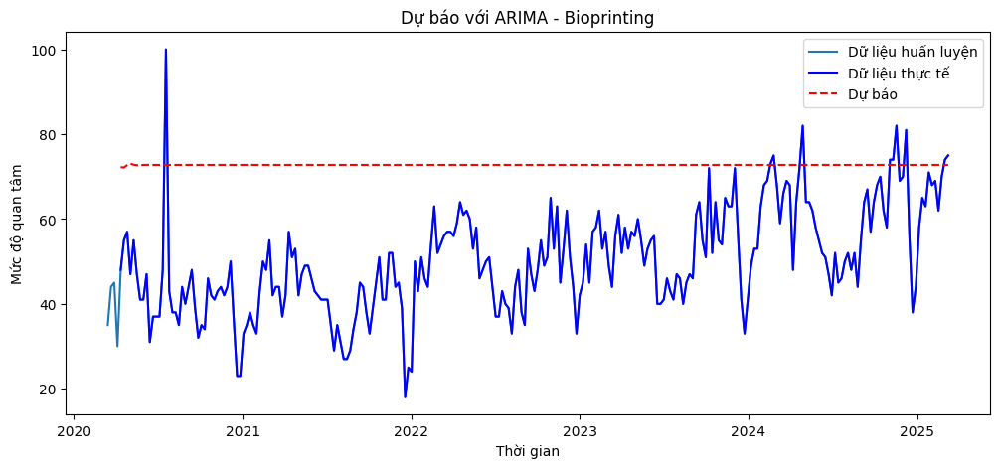

Đang dự báo cho từ khóa: NFT


/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)


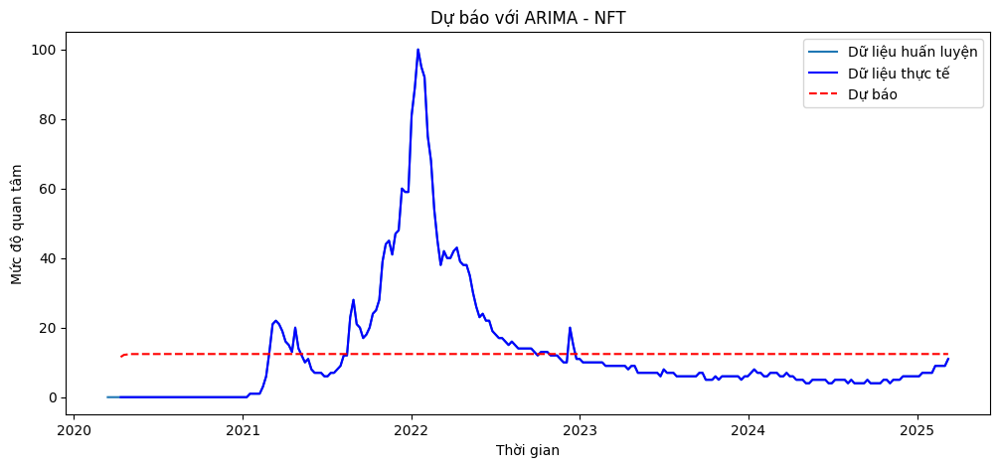

Đang dự báo cho từ khóa: Metaverse


/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)


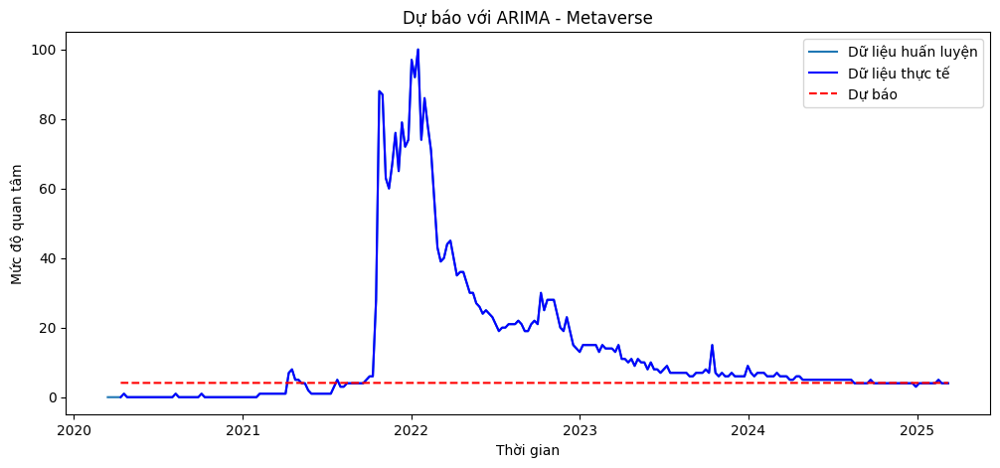

Đang dự báo cho từ khóa: Reinforcement Learning


/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)


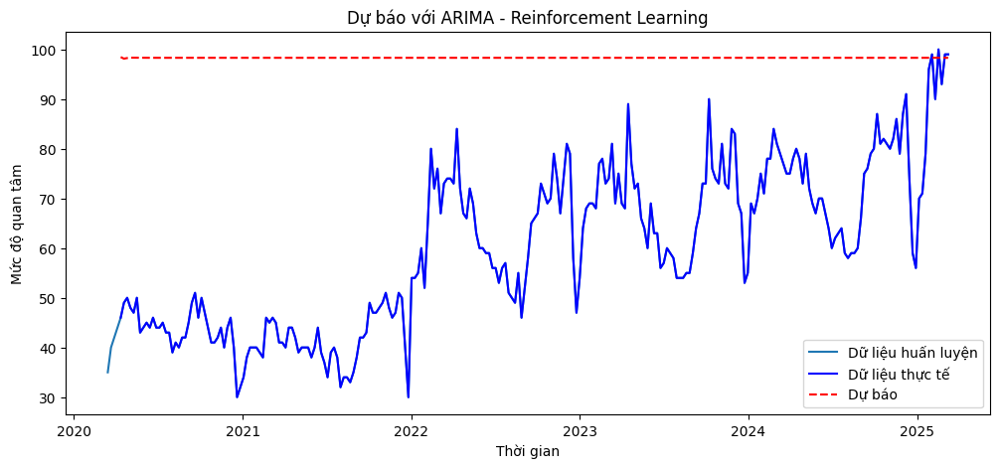

Đang dự báo cho từ khóa: AR Glasses


/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)


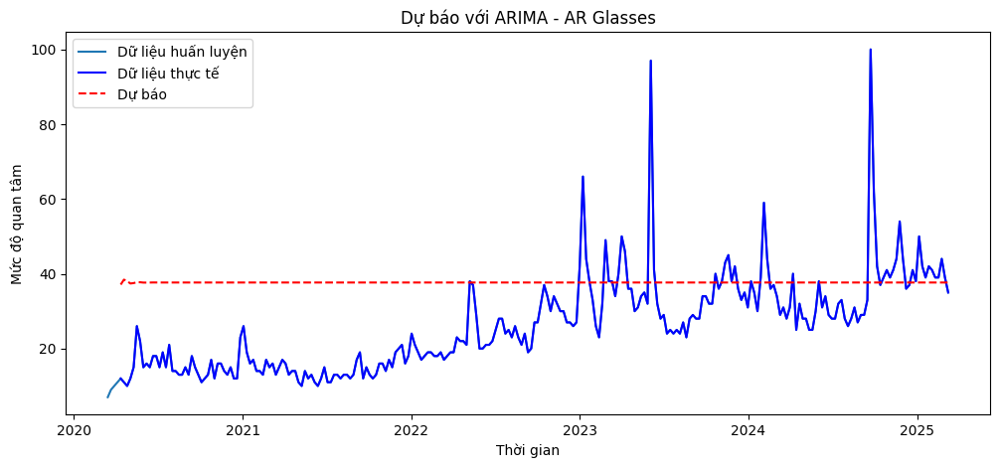

In [ ]:
import matplotlib.pyplot as plt

# Tạo một dictionary để lưu dự báo cho từng từ khóa
forecast_results = {}

# Use the unique keywords from df_cleaned instead of iterating through df_train
for keyword in df_cleaned['keyword'].unique():
    print(f"Đang dự báo cho từ khóa: {keyword}")

    # Filter df_cleaned based on the current keyword to get the training data
    keyword_data = df_cleaned[df_cleaned['keyword'] == keyword]['interest_over_time']

    # Huấn luyện mô hình ARIMA cho từng từ khóa
    # Ensure keyword_data is a Series before passing to ARIMA
    model = ARIMA(keyword_data, order=(3, 1, 0))
    model_fit = model.fit()

    # Get AR order (p) and differencing order (d) from the model
    p, d, _ = model.order  # Assuming order is (p, d, q)

    # Filter df_cleaned to get the test data for the current keyword
    # Use p and d instead of model_fit.k_ar and model_fit.k_diff
    df_test_keyword = df_cleaned[df_cleaned['keyword'] == keyword]['interest_over_time'].iloc[p + d:]  # start from the forecast horizon

    # Dự báo trên tập test
    # Use the length of the test data for the current keyword for steps
    forecast_test = model_fit.forecast(steps=len(df_test_keyword))

    # Lưu kết quả dự báo vào dictionary
    forecast_results[keyword] = forecast_test.values

    # Vẽ biểu đồ
    plt.figure(figsize=(12, 5))

    # Use keyword_data for plotting the training data
    plt.plot(keyword_data.index, keyword_data.values, label="Dữ liệu huấn luyện")

    # Use df_test_keyword for plotting the actual data
    plt.plot(df_test_keyword.index, df_test_keyword.values, label="Dữ liệu thực tế", color='blue')

    # Use df_test_keyword.index for plotting the forecast
    plt.plot(df_test_keyword.index, forecast_test, label="Dự báo", linestyle='dashed', color='red')
    plt.title(f'Dự báo với ARIMA - {keyword}')
    plt.xlabel('Thời gian')
    plt.ylabel('Mức độ quan tâm')
    plt.legend()
    plt.show()

In [ ]:
import numpy as np
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

def evaluate_arima_model(y_true, y_pred):
  """
  Đánh giá mô hình ARIMA bằng các chỉ số R2, MAE, MAPE, RMSE.

  Args:
    y_true: Chuỗi thời gian thực tế.
    y_pred: Chuỗi thời gian dự đoán.

  Returns:
    Một dictionary chứa các giá trị của R2, MAE, MAPE, RMSE.
  """

  # Tính toán các chỉ số
  r2 = r2_score(y_true, y_pred)
  mae = mean_absolute_error(y_true, y_pred)
  mape = np.mean(np.abs((y_true - y_pred) / y_true)) * 100
  rmse = np.sqrt(mean_squared_error(y_true, y_pred))

  # Trả về kết quả
  return {'r2': r2, 'mae': mae, 'mape': mape, 'rmse': rmse}

# Get the last keyword processed in the previous loop (ipython-input-71-0e42fc25ab49)
last_keyword = list(forecast_results.keys())[-1]

# Assuming df_test_keyword is still available from the previous loop
y_true = df_cleaned[df_cleaned['keyword'] == last_keyword]['interest_over_time'].iloc[model.order[0] + model.order[1]:].values  # Actual values for the last keyword

# Predicted values for the last keyword from forecast_results
y_pred = forecast_results[last_keyword]

# Ví dụ sử dụng:
# Giả sử `y_true` và `y_pred` là các chuỗi thời gian thực tế và dự đoán tương ứng
# từ mô hình ARIMA của bạn.
results = evaluate_arima_model(y_true, y_pred)

# In kết quả
print(f"R-squared (R2): {results['r2']:.4f}")
print(f"Mean Absolute Error (MAE): {results['mae']:.4f}")
print(f"Mean Absolute Percentage Error (MAPE): {results['mape']:.4f}%")
print(f"Root Mean Squared Error (RMSE): {results['rmse']:.4f}")

R-squared (R2): -0.7882
Mean Absolute Error (MAE): 14.0383
Mean Absolute Percentage Error (MAPE): 79.5431%
Root Mean Squared Error (RMSE): 16.9459
